# Suo

In [1]:
import warnings
import os
import sys
import gc
import warnings

In [2]:
import anndata as ad
import scanpy as sc
import copy
import torch
from pathlib import Path
import networkx as nx
from sklearn.neighbors import kneighbors_graph
import numpy as np
import scanpy as sc
import pandas as pd
import numpy as np
import scipy.stats

sys.path.append("/home/icb/kemal.inecik/work/codes/tardis")
import tardis
tardis.config = tardis.config_server

In [3]:
print(f"CUDA used: {torch.cuda.is_available()}")

CUDA used: True


In [4]:
%matplotlib inline
%config InlineBackend.figure_format='retina'
import matplotlib.pyplot as plt
import seaborn as sns

import pickle
_rcparams_path = "/home/icb/kemal.inecik/work/codes/tardis/training/local/figures/rcparams.pickle"
with open(_rcparams_path, 'rb') as file:
    _rcparams = pickle.load(file)
plt.rcParams.update(_rcparams)

In [5]:
adata_file_path = os.path.join(tardis.config.io_directories["processed"], "dataset_complete_Suo_age.h5ad")
assert os.path.isfile(adata_file_path), f"File not already exist: `{adata_file_path}`"
adata = ad.read_h5ad(adata_file_path)
adata.obs["age"] = adata.obs["age"].astype(float)
adata.obs["age_categorical"] = adata.obs["age"].astype(str)
print(adata_file_path, flush=True)
print(adata, flush=True)

/lustre/groups/ml01/workspace/kemal.inecik/tardis_data/processed/dataset_complete_Suo_age.h5ad


AnnData object with n_obs × n_vars = 73697 × 8192
    obs: 'sample_ID', 'organ', 'age', 'cell_type', 'sex', 'sex_inferred', 'concatenated_integration_covariates', 'integration_donor', 'integration_biological_unit', 'integration_sample_status', 'integration_library_platform_coarse', 'n_genes', 'age_categorical'
    uns: 'rank_genes_groups'
    obsm: 'Unintegrated', 'X_pca', 'harmony'


In [6]:
model_level_metrics = [
    dict(
        metric_identifier = "metric_mi|age_categorical",
        training_set = ["train", "validation"],
        every_n_epoch = 5,
        subsample = 0.25,
        progress_bar = True,
        metric_kwargs = dict(
            variation = "normalized",
            discretization_bins = 512,
            latent_subset=None,
            reduce=np.mean
        )
    )
]

In [7]:
warmup_epoch_range = [6, 48]
dtc_w1 = 100
dtc_w2 = 10

counteractive_minibatch_settings = dict(
    method = "categorical_random",
    method_kwargs = dict(
        within_labels = False,
        within_batch = False,
        within_categorical_covs = None,
        seed = "forward",
    )
)

disentenglement_targets_configurations=[
    dict(
        obs_key = "age_categorical",
        n_reserved_latent = 8,
        counteractive_minibatch_settings = counteractive_minibatch_settings,
        auxillary_losses = [
            dict(
                apply = True, 
                target_type="pseudo_categorical",
                non_categorical_coefficient_method="squared_difference",
                progress_bar = False,
                weight = dtc_w1,
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "negative",
                transformation = "inverse", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2, 
                method = "mse_z", 
                latent_group = "reserved",
                counteractive_example = "positive",
                transformation = "none",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w2 * 1,
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "negative",
                transformation = "none", 
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
            dict(
                apply = True, 
                target_type="categorical",
                progress_bar = False,
                weight = dtc_w1 * 1, 
                method = "mse_z", 
                latent_group = "unreserved_complete",
                counteractive_example = "positive",
                transformation = "inverse",
                warmup_epoch_range=warmup_epoch_range,
                method_kwargs = {}
            ),
        ]
    )
]

In [8]:
n_epochs_kl_warmup = 600

model_params = dict(
    n_hidden=512,
    n_layers=3, 
    n_latent=(12 + 8 * len(disentenglement_targets_configurations)),
    gene_likelihood = "nb",
    use_batch_norm = "none",
    use_layer_norm = "both",
    dropout_rate = 0.5,
    deeply_inject_disentengled_latents = True,
    include_auxillary_loss = True,
    beta_kl_weight = 0.5,
    encode_covariates=True
)

train_params = dict(
    max_epochs=600,
    train_size=0.8,
    batch_size=64,
    check_val_every_n_epoch=10,
    limit_train_batches=1.0, 
    limit_val_batches=1.0,
    learning_rate_monitor=True,
    # early stopping:
    early_stopping=False,
    early_stopping_patience=150,
    early_stopping_monitor="elbo_train",
    plan_kwargs = dict(
        n_epochs_kl_warmup=n_epochs_kl_warmup,
        lr=5e-5,
        weight_decay=1e-2,
        optimizer="AdamW",
        # lr-scheduler:
        reduce_lr_on_plateau=True,
        lr_patience=100,
        lr_scheduler_metric="elbo_train",
    )
)

dataset_params = dict(
    layer=None, 
    labels_key=None,
    batch_key=None,
    categorical_covariate_keys=None,
    disentenglement_targets_configurations=disentenglement_targets_configurations,
    model_level_metrics=model_level_metrics,
    model_level_metrics_helper_covariates=['age_categorical']
)

tardis.MyModel.setup_anndata(adata, **dataset_params)
dataset_params["adata_path"] = adata_file_path
dataset_params["adata"] = os.path.split(adata_file_path)[1]

tardis.MyModel.setup_wandb(
    wandb_configurations=tardis.config.wandb,
    hyperparams=dict(
        model_params=model_params,
        train_params=train_params,
        dataset_params=dataset_params,
    )
)

vae = tardis.MyModel(
    adata,
    **model_params
)
vae.train(**train_params)

dir_path = os.path.join(
    tardis.config.io_directories["models"],
    "suo_age-continuous_4"
)

vae.save(
    dir_path,
    overwrite=True,
)

CUDA backend failed to initialize: Found cuDNN version 8700, but JAX was built against version 8907, which is newer. The copy of cuDNN that is installed must be at least as new as the version against which JAX was built. (Set TF_CPP_MIN_LOG_LEVEL=0 and rerun for more info.)


W&B logger initialized with the following parameters: 
Entity: inecik-academic
Project: tardis_figures
ID: qevu2381
Name: dark-frost-148
Tags: tardis, conference, figures, final
Notes: Final runs for Tardis before conference.
URL: https://wandb.ai/inecik-academic/tardis_figures/runs/qevu2381
Directory: /lustre/groups/ml01/workspace/kemal.inecik/wandb/run-20240503_170121-qevu2381/files



/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...


GPU available: True (cuda), used: True


TPU available: False, using: 0 TPU cores


IPU available: False, using: 0 IPUs


HPU available: False, using: 0 HPUs


`Trainer(limit_train_batches=1.0)` was configured so 100% of the batches per epoch will be used..


`Trainer(limit_val_batches=1.0)` was configured so 100% of the batches will be used..


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/lightning/fabric/plugins/environments/slurm.py:168: The `srun` command is available on your system but is not used. HINT: If your intention is to run Lightning on SLURM, prepend your python command with `srun` like so: srun python /home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_ ...
You are using a CUDA device ('NVIDIA A100-PCIE-40GB MIG 3g.20gb') that has Tensor Cores. To properly utilize them, you should set `torch.set_float32_matmul_precision('medium' | 'high')` which will trade-off precision for performance. For more details, read https://pytorch.org/docs/stable/generated/torch.set_float32_matmul_precision.html#torch.set_float32_matmul_precision


LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-780ef5d7-fd86-5787-940a-4dbc0e48bcc3]


/home/icb/kemal.inecik/tools/apps/mamba/envs/tardis_env/lib/python3.10/site-packages/torch/optim/lr_scheduler.py:28: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn("The verbose parameter is deprecated. Please use get_last_lr() "


Training:   0%|          | 0/600 [00:00<?, ?it/s]

Epoch 1/600:   0%|          | 0/600 [00:00<?, ?it/s]

/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_categorical` for `training` set. Number of elements in each group: 4860,7554,5879,6688,15105,18872
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


/home/icb/kemal.inecik/work/codes/tardis/tardis/_counteractivegenerator.py:237: UserWarning: Possible group definition indices are calculated for `age_categorical` for `validation` set. Number of elements in each group: 1153,1890,1440,1656,3860,4740
  possible_indices = CachedPossibleGroupDefinitionIndices.get(


Epoch 1/600:   0%|          | 1/600 [00:24<4:01:24, 24.18s/it]

Epoch 1/600:   0%|          | 1/600 [00:24<4:01:24, 24.18s/it, v_num=81_1, total_loss_train=625, kl_local_train=35.1]

Epoch 2/600:   0%|          | 1/600 [00:24<4:01:24, 24.18s/it, v_num=81_1, total_loss_train=625, kl_local_train=35.1]

Epoch 2/600:   0%|          | 2/600 [00:42<3:27:29, 20.82s/it, v_num=81_1, total_loss_train=625, kl_local_train=35.1]

Epoch 2/600:   0%|          | 2/600 [00:42<3:27:29, 20.82s/it, v_num=81_1, total_loss_train=477, kl_local_train=64.4]

Epoch 3/600:   0%|          | 2/600 [00:42<3:27:29, 20.82s/it, v_num=81_1, total_loss_train=477, kl_local_train=64.4]

Epoch 3/600:   0%|          | 3/600 [01:02<3:22:59, 20.40s/it, v_num=81_1, total_loss_train=477, kl_local_train=64.4]

Epoch 3/600:   0%|          | 3/600 [01:02<3:22:59, 20.40s/it, v_num=81_1, total_loss_train=451, kl_local_train=76.4]

Epoch 4/600:   0%|          | 3/600 [01:02<3:22:59, 20.40s/it, v_num=81_1, total_loss_train=451, kl_local_train=76.4]

Epoch 4/600:   1%|          | 4/600 [01:19<3:09:14, 19.05s/it, v_num=81_1, total_loss_train=451, kl_local_train=76.4]

Epoch 4/600:   1%|          | 4/600 [01:19<3:09:14, 19.05s/it, v_num=81_1, total_loss_train=441, kl_local_train=80.6]

Epoch 5/600:   1%|          | 4/600 [01:19<3:09:14, 19.05s/it, v_num=81_1, total_loss_train=441, kl_local_train=80.6]

Epoch 5/600:   1%|          | 5/600 [01:39<3:11:33, 19.32s/it, v_num=81_1, total_loss_train=441, kl_local_train=80.6]

Epoch 5/600:   1%|          | 5/600 [01:39<3:11:33, 19.32s/it, v_num=81_1, total_loss_train=436, kl_local_train=81.6]

Epoch 6/600:   1%|          | 5/600 [01:39<3:11:33, 19.32s/it, v_num=81_1, total_loss_train=436, kl_local_train=81.6]

Epoch 6/600:   1%|          | 6/600 [01:57<3:08:13, 19.01s/it, v_num=81_1, total_loss_train=436, kl_local_train=81.6]

Epoch 6/600:   1%|          | 6/600 [01:57<3:08:13, 19.01s/it, v_num=81_1, total_loss_train=433, kl_local_train=80.6, metric_mi|age_categorical_train=0.071]

Epoch 7/600:   1%|          | 6/600 [01:57<3:08:13, 19.01s/it, v_num=81_1, total_loss_train=433, kl_local_train=80.6, metric_mi|age_categorical_train=0.071]

Epoch 7/600:   1%|          | 7/600 [02:16<3:06:06, 18.83s/it, v_num=81_1, total_loss_train=433, kl_local_train=80.6, metric_mi|age_categorical_train=0.071]

Epoch 7/600:   1%|          | 7/600 [02:16<3:06:06, 18.83s/it, v_num=81_1, total_loss_train=431, kl_local_train=78.5, metric_mi|age_categorical_train=0.071]

Epoch 8/600:   1%|          | 7/600 [02:16<3:06:06, 18.83s/it, v_num=81_1, total_loss_train=431, kl_local_train=78.5, metric_mi|age_categorical_train=0.071]

Epoch 8/600:   1%|▏         | 8/600 [02:33<2:59:56, 18.24s/it, v_num=81_1, total_loss_train=431, kl_local_train=78.5, metric_mi|age_categorical_train=0.071]

Epoch 8/600:   1%|▏         | 8/600 [02:33<2:59:56, 18.24s/it, v_num=81_1, total_loss_train=440, kl_local_train=91.3, metric_mi|age_categorical_train=0.071]

Epoch 9/600:   1%|▏         | 8/600 [02:33<2:59:56, 18.24s/it, v_num=81_1, total_loss_train=440, kl_local_train=91.3, metric_mi|age_categorical_train=0.071]

Epoch 9/600:   2%|▏         | 9/600 [02:51<2:58:28, 18.12s/it, v_num=81_1, total_loss_train=440, kl_local_train=91.3, metric_mi|age_categorical_train=0.071]

Epoch 9/600:   2%|▏         | 9/600 [02:51<2:58:28, 18.12s/it, v_num=81_1, total_loss_train=449, kl_local_train=84.4, metric_mi|age_categorical_train=0.071]

Epoch 10/600:   2%|▏         | 9/600 [02:51<2:58:28, 18.12s/it, v_num=81_1, total_loss_train=449, kl_local_train=84.4, metric_mi|age_categorical_train=0.071]

Epoch 10/600:   2%|▏         | 10/600 [03:08<2:57:43, 18.07s/it, v_num=81_1, total_loss_train=449, kl_local_train=84.4, metric_mi|age_categorical_train=0.071]

Epoch 10/600:   2%|▏         | 10/600 [03:09<2:57:43, 18.07s/it, v_num=81_1, total_loss_train=458, kl_local_train=80.2, metric_mi|age_categorical_train=0.071]

Epoch 11/600:   2%|▏         | 10/600 [03:09<2:57:43, 18.07s/it, v_num=81_1, total_loss_train=458, kl_local_train=80.2, metric_mi|age_categorical_train=0.071]

Epoch 11/600:   2%|▏         | 11/600 [03:27<2:58:13, 18.16s/it, v_num=81_1, total_loss_train=458, kl_local_train=80.2, metric_mi|age_categorical_train=0.071]

Epoch 11/600:   2%|▏         | 11/600 [03:27<2:58:13, 18.16s/it, v_num=81_1, total_loss_train=466, kl_local_train=78.7, metric_mi|age_categorical_train=0.0686]

Epoch 12/600:   2%|▏         | 11/600 [03:27<2:58:13, 18.16s/it, v_num=81_1, total_loss_train=466, kl_local_train=78.7, metric_mi|age_categorical_train=0.0686]

Epoch 12/600:   2%|▏         | 12/600 [03:45<2:56:47, 18.04s/it, v_num=81_1, total_loss_train=466, kl_local_train=78.7, metric_mi|age_categorical_train=0.0686]

Epoch 12/600:   2%|▏         | 12/600 [03:45<2:56:47, 18.04s/it, v_num=81_1, total_loss_train=476, kl_local_train=78.5, metric_mi|age_categorical_train=0.0686]

Epoch 13/600:   2%|▏         | 12/600 [03:45<2:56:47, 18.04s/it, v_num=81_1, total_loss_train=476, kl_local_train=78.5, metric_mi|age_categorical_train=0.0686]

Epoch 13/600:   2%|▏         | 13/600 [04:04<2:59:50, 18.38s/it, v_num=81_1, total_loss_train=476, kl_local_train=78.5, metric_mi|age_categorical_train=0.0686]

Epoch 13/600:   2%|▏         | 13/600 [04:04<2:59:50, 18.38s/it, v_num=81_1, total_loss_train=485, kl_local_train=79.4, metric_mi|age_categorical_train=0.0686]

Epoch 14/600:   2%|▏         | 13/600 [04:04<2:59:50, 18.38s/it, v_num=81_1, total_loss_train=485, kl_local_train=79.4, metric_mi|age_categorical_train=0.0686]

Epoch 14/600:   2%|▏         | 14/600 [04:24<3:05:02, 18.95s/it, v_num=81_1, total_loss_train=485, kl_local_train=79.4, metric_mi|age_categorical_train=0.0686]

Epoch 14/600:   2%|▏         | 14/600 [04:24<3:05:02, 18.95s/it, v_num=81_1, total_loss_train=493, kl_local_train=83.5, metric_mi|age_categorical_train=0.0686]

Epoch 15/600:   2%|▏         | 14/600 [04:24<3:05:02, 18.95s/it, v_num=81_1, total_loss_train=493, kl_local_train=83.5, metric_mi|age_categorical_train=0.0686]

Epoch 15/600:   2%|▎         | 15/600 [04:44<3:06:18, 19.11s/it, v_num=81_1, total_loss_train=493, kl_local_train=83.5, metric_mi|age_categorical_train=0.0686]

Epoch 15/600:   2%|▎         | 15/600 [04:44<3:06:18, 19.11s/it, v_num=81_1, total_loss_train=500, kl_local_train=95.1, metric_mi|age_categorical_train=0.0686]

Epoch 16/600:   2%|▎         | 15/600 [04:44<3:06:18, 19.11s/it, v_num=81_1, total_loss_train=500, kl_local_train=95.1, metric_mi|age_categorical_train=0.0686]

Epoch 16/600:   3%|▎         | 16/600 [05:03<3:07:15, 19.24s/it, v_num=81_1, total_loss_train=500, kl_local_train=95.1, metric_mi|age_categorical_train=0.0686]

Epoch 16/600:   3%|▎         | 16/600 [05:03<3:07:15, 19.24s/it, v_num=81_1, total_loss_train=484, kl_local_train=142, metric_mi|age_categorical_train=0.0767] 

Epoch 17/600:   3%|▎         | 16/600 [05:03<3:07:15, 19.24s/it, v_num=81_1, total_loss_train=484, kl_local_train=142, metric_mi|age_categorical_train=0.0767]

Epoch 17/600:   3%|▎         | 17/600 [05:21<3:03:55, 18.93s/it, v_num=81_1, total_loss_train=484, kl_local_train=142, metric_mi|age_categorical_train=0.0767]

Epoch 17/600:   3%|▎         | 17/600 [05:21<3:03:55, 18.93s/it, v_num=81_1, total_loss_train=469, kl_local_train=208, metric_mi|age_categorical_train=0.0767]

Epoch 18/600:   3%|▎         | 17/600 [05:21<3:03:55, 18.93s/it, v_num=81_1, total_loss_train=469, kl_local_train=208, metric_mi|age_categorical_train=0.0767]

Epoch 18/600:   3%|▎         | 18/600 [05:39<3:00:24, 18.60s/it, v_num=81_1, total_loss_train=469, kl_local_train=208, metric_mi|age_categorical_train=0.0767]

Epoch 18/600:   3%|▎         | 18/600 [05:39<3:00:24, 18.60s/it, v_num=81_1, total_loss_train=466, kl_local_train=257, metric_mi|age_categorical_train=0.0767]

Epoch 19/600:   3%|▎         | 18/600 [05:39<3:00:24, 18.60s/it, v_num=81_1, total_loss_train=466, kl_local_train=257, metric_mi|age_categorical_train=0.0767]

Epoch 19/600:   3%|▎         | 19/600 [05:57<2:57:40, 18.35s/it, v_num=81_1, total_loss_train=466, kl_local_train=257, metric_mi|age_categorical_train=0.0767]

Epoch 19/600:   3%|▎         | 19/600 [05:57<2:57:40, 18.35s/it, v_num=81_1, total_loss_train=466, kl_local_train=284, metric_mi|age_categorical_train=0.0767]

Epoch 20/600:   3%|▎         | 19/600 [05:57<2:57:40, 18.35s/it, v_num=81_1, total_loss_train=466, kl_local_train=284, metric_mi|age_categorical_train=0.0767]

Epoch 20/600:   3%|▎         | 20/600 [06:15<2:57:32, 18.37s/it, v_num=81_1, total_loss_train=466, kl_local_train=284, metric_mi|age_categorical_train=0.0767]

Epoch 20/600:   3%|▎         | 20/600 [06:15<2:57:32, 18.37s/it, v_num=81_1, total_loss_train=468, kl_local_train=298, metric_mi|age_categorical_train=0.0767]

Epoch 21/600:   3%|▎         | 20/600 [06:16<2:57:32, 18.37s/it, v_num=81_1, total_loss_train=468, kl_local_train=298, metric_mi|age_categorical_train=0.0767]

Epoch 21/600:   4%|▎         | 21/600 [06:34<2:57:16, 18.37s/it, v_num=81_1, total_loss_train=468, kl_local_train=298, metric_mi|age_categorical_train=0.0767]

Epoch 21/600:   4%|▎         | 21/600 [06:34<2:57:16, 18.37s/it, v_num=81_1, total_loss_train=469, kl_local_train=301, metric_mi|age_categorical_train=0.144] 

Epoch 22/600:   4%|▎         | 21/600 [06:34<2:57:16, 18.37s/it, v_num=81_1, total_loss_train=469, kl_local_train=301, metric_mi|age_categorical_train=0.144]

Epoch 22/600:   4%|▎         | 22/600 [06:54<3:01:18, 18.82s/it, v_num=81_1, total_loss_train=469, kl_local_train=301, metric_mi|age_categorical_train=0.144]

Epoch 22/600:   4%|▎         | 22/600 [06:54<3:01:18, 18.82s/it, v_num=81_1, total_loss_train=470, kl_local_train=295, metric_mi|age_categorical_train=0.144]

Epoch 23/600:   4%|▎         | 22/600 [06:54<3:01:18, 18.82s/it, v_num=81_1, total_loss_train=470, kl_local_train=295, metric_mi|age_categorical_train=0.144]

Epoch 23/600:   4%|▍         | 23/600 [07:13<3:02:50, 19.01s/it, v_num=81_1, total_loss_train=470, kl_local_train=295, metric_mi|age_categorical_train=0.144]

Epoch 23/600:   4%|▍         | 23/600 [07:13<3:02:50, 19.01s/it, v_num=81_1, total_loss_train=472, kl_local_train=285, metric_mi|age_categorical_train=0.144]

Epoch 24/600:   4%|▍         | 23/600 [07:13<3:02:50, 19.01s/it, v_num=81_1, total_loss_train=472, kl_local_train=285, metric_mi|age_categorical_train=0.144]

Epoch 24/600:   4%|▍         | 24/600 [07:31<3:00:34, 18.81s/it, v_num=81_1, total_loss_train=472, kl_local_train=285, metric_mi|age_categorical_train=0.144]

Epoch 24/600:   4%|▍         | 24/600 [07:31<3:00:34, 18.81s/it, v_num=81_1, total_loss_train=473, kl_local_train=280, metric_mi|age_categorical_train=0.144]

Epoch 25/600:   4%|▍         | 24/600 [07:31<3:00:34, 18.81s/it, v_num=81_1, total_loss_train=473, kl_local_train=280, metric_mi|age_categorical_train=0.144]

Epoch 25/600:   4%|▍         | 25/600 [07:50<2:58:27, 18.62s/it, v_num=81_1, total_loss_train=473, kl_local_train=280, metric_mi|age_categorical_train=0.144]

Epoch 25/600:   4%|▍         | 25/600 [07:50<2:58:27, 18.62s/it, v_num=81_1, total_loss_train=475, kl_local_train=281, metric_mi|age_categorical_train=0.144]

Epoch 26/600:   4%|▍         | 25/600 [07:50<2:58:27, 18.62s/it, v_num=81_1, total_loss_train=475, kl_local_train=281, metric_mi|age_categorical_train=0.144]

Epoch 26/600:   4%|▍         | 26/600 [08:10<3:04:15, 19.26s/it, v_num=81_1, total_loss_train=475, kl_local_train=281, metric_mi|age_categorical_train=0.144]

Epoch 26/600:   4%|▍         | 26/600 [08:10<3:04:15, 19.26s/it, v_num=81_1, total_loss_train=477, kl_local_train=282, metric_mi|age_categorical_train=0.158]

Epoch 27/600:   4%|▍         | 26/600 [08:10<3:04:15, 19.26s/it, v_num=81_1, total_loss_train=477, kl_local_train=282, metric_mi|age_categorical_train=0.158]

Epoch 27/600:   4%|▍         | 27/600 [08:27<2:57:14, 18.56s/it, v_num=81_1, total_loss_train=477, kl_local_train=282, metric_mi|age_categorical_train=0.158]

Epoch 27/600:   4%|▍         | 27/600 [08:27<2:57:14, 18.56s/it, v_num=81_1, total_loss_train=479, kl_local_train=273, metric_mi|age_categorical_train=0.158]

Epoch 28/600:   4%|▍         | 27/600 [08:27<2:57:14, 18.56s/it, v_num=81_1, total_loss_train=479, kl_local_train=273, metric_mi|age_categorical_train=0.158]

Epoch 28/600:   5%|▍         | 28/600 [08:47<2:59:16, 18.81s/it, v_num=81_1, total_loss_train=479, kl_local_train=273, metric_mi|age_categorical_train=0.158]

Epoch 28/600:   5%|▍         | 28/600 [08:47<2:59:16, 18.81s/it, v_num=81_1, total_loss_train=481, kl_local_train=271, metric_mi|age_categorical_train=0.158]

Epoch 29/600:   5%|▍         | 28/600 [08:47<2:59:16, 18.81s/it, v_num=81_1, total_loss_train=481, kl_local_train=271, metric_mi|age_categorical_train=0.158]

Epoch 29/600:   5%|▍         | 29/600 [09:05<2:56:59, 18.60s/it, v_num=81_1, total_loss_train=481, kl_local_train=271, metric_mi|age_categorical_train=0.158]

Epoch 29/600:   5%|▍         | 29/600 [09:05<2:56:59, 18.60s/it, v_num=81_1, total_loss_train=483, kl_local_train=260, metric_mi|age_categorical_train=0.158]

Epoch 30/600:   5%|▍         | 29/600 [09:05<2:56:59, 18.60s/it, v_num=81_1, total_loss_train=483, kl_local_train=260, metric_mi|age_categorical_train=0.158]

Epoch 30/600:   5%|▌         | 30/600 [09:22<2:51:44, 18.08s/it, v_num=81_1, total_loss_train=483, kl_local_train=260, metric_mi|age_categorical_train=0.158]

Epoch 30/600:   5%|▌         | 30/600 [09:22<2:51:44, 18.08s/it, v_num=81_1, total_loss_train=484, kl_local_train=254, metric_mi|age_categorical_train=0.158]

Epoch 31/600:   5%|▌         | 30/600 [09:22<2:51:44, 18.08s/it, v_num=81_1, total_loss_train=484, kl_local_train=254, metric_mi|age_categorical_train=0.158]

Epoch 31/600:   5%|▌         | 31/600 [09:45<3:05:54, 19.60s/it, v_num=81_1, total_loss_train=484, kl_local_train=254, metric_mi|age_categorical_train=0.158]

Epoch 31/600:   5%|▌         | 31/600 [09:45<3:05:54, 19.60s/it, v_num=81_1, total_loss_train=484, kl_local_train=252, metric_mi|age_categorical_train=0.174]

Epoch 32/600:   5%|▌         | 31/600 [09:45<3:05:54, 19.60s/it, v_num=81_1, total_loss_train=484, kl_local_train=252, metric_mi|age_categorical_train=0.174]

Epoch 32/600:   5%|▌         | 32/600 [10:03<3:01:43, 19.20s/it, v_num=81_1, total_loss_train=484, kl_local_train=252, metric_mi|age_categorical_train=0.174]

Epoch 32/600:   5%|▌         | 32/600 [10:03<3:01:43, 19.20s/it, v_num=81_1, total_loss_train=484, kl_local_train=257, metric_mi|age_categorical_train=0.174]

Epoch 33/600:   5%|▌         | 32/600 [10:03<3:01:43, 19.20s/it, v_num=81_1, total_loss_train=484, kl_local_train=257, metric_mi|age_categorical_train=0.174]

Epoch 33/600:   6%|▌         | 33/600 [10:20<2:55:24, 18.56s/it, v_num=81_1, total_loss_train=484, kl_local_train=257, metric_mi|age_categorical_train=0.174]

Epoch 33/600:   6%|▌         | 33/600 [10:20<2:55:24, 18.56s/it, v_num=81_1, total_loss_train=486, kl_local_train=263, metric_mi|age_categorical_train=0.174]

Epoch 34/600:   6%|▌         | 33/600 [10:20<2:55:24, 18.56s/it, v_num=81_1, total_loss_train=486, kl_local_train=263, metric_mi|age_categorical_train=0.174]

Epoch 34/600:   6%|▌         | 34/600 [10:37<2:51:02, 18.13s/it, v_num=81_1, total_loss_train=486, kl_local_train=263, metric_mi|age_categorical_train=0.174]

Epoch 34/600:   6%|▌         | 34/600 [10:37<2:51:02, 18.13s/it, v_num=81_1, total_loss_train=487, kl_local_train=265, metric_mi|age_categorical_train=0.174]

Epoch 35/600:   6%|▌         | 34/600 [10:37<2:51:02, 18.13s/it, v_num=81_1, total_loss_train=487, kl_local_train=265, metric_mi|age_categorical_train=0.174]

Epoch 35/600:   6%|▌         | 35/600 [10:55<2:51:16, 18.19s/it, v_num=81_1, total_loss_train=487, kl_local_train=265, metric_mi|age_categorical_train=0.174]

Epoch 35/600:   6%|▌         | 35/600 [10:55<2:51:16, 18.19s/it, v_num=81_1, total_loss_train=488, kl_local_train=262, metric_mi|age_categorical_train=0.174]

Epoch 36/600:   6%|▌         | 35/600 [10:56<2:51:16, 18.19s/it, v_num=81_1, total_loss_train=488, kl_local_train=262, metric_mi|age_categorical_train=0.174]

Epoch 36/600:   6%|▌         | 36/600 [11:14<2:51:15, 18.22s/it, v_num=81_1, total_loss_train=488, kl_local_train=262, metric_mi|age_categorical_train=0.174]

Epoch 36/600:   6%|▌         | 36/600 [11:14<2:51:15, 18.22s/it, v_num=81_1, total_loss_train=489, kl_local_train=257, metric_mi|age_categorical_train=0.212]

Epoch 37/600:   6%|▌         | 36/600 [11:14<2:51:15, 18.22s/it, v_num=81_1, total_loss_train=489, kl_local_train=257, metric_mi|age_categorical_train=0.212]

Epoch 37/600:   6%|▌         | 37/600 [11:30<2:46:33, 17.75s/it, v_num=81_1, total_loss_train=489, kl_local_train=257, metric_mi|age_categorical_train=0.212]

Epoch 37/600:   6%|▌         | 37/600 [11:30<2:46:33, 17.75s/it, v_num=81_1, total_loss_train=491, kl_local_train=257, metric_mi|age_categorical_train=0.212]

Epoch 38/600:   6%|▌         | 37/600 [11:30<2:46:33, 17.75s/it, v_num=81_1, total_loss_train=491, kl_local_train=257, metric_mi|age_categorical_train=0.212]

Epoch 38/600:   6%|▋         | 38/600 [11:49<2:49:26, 18.09s/it, v_num=81_1, total_loss_train=491, kl_local_train=257, metric_mi|age_categorical_train=0.212]

Epoch 38/600:   6%|▋         | 38/600 [11:49<2:49:26, 18.09s/it, v_num=81_1, total_loss_train=492, kl_local_train=259, metric_mi|age_categorical_train=0.212]

Epoch 39/600:   6%|▋         | 38/600 [11:49<2:49:26, 18.09s/it, v_num=81_1, total_loss_train=492, kl_local_train=259, metric_mi|age_categorical_train=0.212]

Epoch 39/600:   6%|▋         | 39/600 [12:06<2:45:09, 17.66s/it, v_num=81_1, total_loss_train=492, kl_local_train=259, metric_mi|age_categorical_train=0.212]

Epoch 39/600:   6%|▋         | 39/600 [12:06<2:45:09, 17.66s/it, v_num=81_1, total_loss_train=494, kl_local_train=258, metric_mi|age_categorical_train=0.212]

Epoch 40/600:   6%|▋         | 39/600 [12:06<2:45:09, 17.66s/it, v_num=81_1, total_loss_train=494, kl_local_train=258, metric_mi|age_categorical_train=0.212]

Epoch 40/600:   7%|▋         | 40/600 [12:24<2:47:06, 17.90s/it, v_num=81_1, total_loss_train=494, kl_local_train=258, metric_mi|age_categorical_train=0.212]

Epoch 40/600:   7%|▋         | 40/600 [12:24<2:47:06, 17.90s/it, v_num=81_1, total_loss_train=496, kl_local_train=260, metric_mi|age_categorical_train=0.212]

Epoch 41/600:   7%|▋         | 40/600 [12:25<2:47:06, 17.90s/it, v_num=81_1, total_loss_train=496, kl_local_train=260, metric_mi|age_categorical_train=0.212]

Epoch 41/600:   7%|▋         | 41/600 [12:43<2:49:34, 18.20s/it, v_num=81_1, total_loss_train=496, kl_local_train=260, metric_mi|age_categorical_train=0.212]

Epoch 41/600:   7%|▋         | 41/600 [12:43<2:49:34, 18.20s/it, v_num=81_1, total_loss_train=498, kl_local_train=258, metric_mi|age_categorical_train=0.23] 

Epoch 42/600:   7%|▋         | 41/600 [12:43<2:49:34, 18.20s/it, v_num=81_1, total_loss_train=498, kl_local_train=258, metric_mi|age_categorical_train=0.23]

Epoch 42/600:   7%|▋         | 42/600 [13:01<2:47:47, 18.04s/it, v_num=81_1, total_loss_train=498, kl_local_train=258, metric_mi|age_categorical_train=0.23]

Epoch 42/600:   7%|▋         | 42/600 [13:01<2:47:47, 18.04s/it, v_num=81_1, total_loss_train=499, kl_local_train=259, metric_mi|age_categorical_train=0.23]

Epoch 43/600:   7%|▋         | 42/600 [13:01<2:47:47, 18.04s/it, v_num=81_1, total_loss_train=499, kl_local_train=259, metric_mi|age_categorical_train=0.23]

Epoch 43/600:   7%|▋         | 43/600 [13:18<2:43:59, 17.67s/it, v_num=81_1, total_loss_train=499, kl_local_train=259, metric_mi|age_categorical_train=0.23]

Epoch 43/600:   7%|▋         | 43/600 [13:18<2:43:59, 17.67s/it, v_num=81_1, total_loss_train=501, kl_local_train=259, metric_mi|age_categorical_train=0.23]

Epoch 44/600:   7%|▋         | 43/600 [13:18<2:43:59, 17.67s/it, v_num=81_1, total_loss_train=501, kl_local_train=259, metric_mi|age_categorical_train=0.23]

Epoch 44/600:   7%|▋         | 44/600 [13:35<2:41:57, 17.48s/it, v_num=81_1, total_loss_train=501, kl_local_train=259, metric_mi|age_categorical_train=0.23]

Epoch 44/600:   7%|▋         | 44/600 [13:35<2:41:57, 17.48s/it, v_num=81_1, total_loss_train=503, kl_local_train=257, metric_mi|age_categorical_train=0.23]

Epoch 45/600:   7%|▋         | 44/600 [13:35<2:41:57, 17.48s/it, v_num=81_1, total_loss_train=503, kl_local_train=257, metric_mi|age_categorical_train=0.23]

Epoch 45/600:   8%|▊         | 45/600 [13:53<2:44:22, 17.77s/it, v_num=81_1, total_loss_train=503, kl_local_train=257, metric_mi|age_categorical_train=0.23]

Epoch 45/600:   8%|▊         | 45/600 [13:53<2:44:22, 17.77s/it, v_num=81_1, total_loss_train=505, kl_local_train=259, metric_mi|age_categorical_train=0.23]

Epoch 46/600:   8%|▊         | 45/600 [13:54<2:44:22, 17.77s/it, v_num=81_1, total_loss_train=505, kl_local_train=259, metric_mi|age_categorical_train=0.23]

Epoch 46/600:   8%|▊         | 46/600 [14:13<2:48:42, 18.27s/it, v_num=81_1, total_loss_train=505, kl_local_train=259, metric_mi|age_categorical_train=0.23]

Epoch 46/600:   8%|▊         | 46/600 [14:13<2:48:42, 18.27s/it, v_num=81_1, total_loss_train=507, kl_local_train=256, metric_mi|age_categorical_train=0.235]

Epoch 47/600:   8%|▊         | 46/600 [14:13<2:48:42, 18.27s/it, v_num=81_1, total_loss_train=507, kl_local_train=256, metric_mi|age_categorical_train=0.235]

Epoch 47/600:   8%|▊         | 47/600 [14:30<2:44:49, 17.88s/it, v_num=81_1, total_loss_train=507, kl_local_train=256, metric_mi|age_categorical_train=0.235]

Epoch 47/600:   8%|▊         | 47/600 [14:30<2:44:49, 17.88s/it, v_num=81_1, total_loss_train=509, kl_local_train=259, metric_mi|age_categorical_train=0.235]

Epoch 48/600:   8%|▊         | 47/600 [14:30<2:44:49, 17.88s/it, v_num=81_1, total_loss_train=509, kl_local_train=259, metric_mi|age_categorical_train=0.235]

Epoch 48/600:   8%|▊         | 48/600 [14:48<2:46:57, 18.15s/it, v_num=81_1, total_loss_train=509, kl_local_train=259, metric_mi|age_categorical_train=0.235]

Epoch 48/600:   8%|▊         | 48/600 [14:48<2:46:57, 18.15s/it, v_num=81_1, total_loss_train=511, kl_local_train=262, metric_mi|age_categorical_train=0.235]

Epoch 49/600:   8%|▊         | 48/600 [14:48<2:46:57, 18.15s/it, v_num=81_1, total_loss_train=511, kl_local_train=262, metric_mi|age_categorical_train=0.235]

Epoch 49/600:   8%|▊         | 49/600 [15:07<2:48:29, 18.35s/it, v_num=81_1, total_loss_train=511, kl_local_train=262, metric_mi|age_categorical_train=0.235]

Epoch 49/600:   8%|▊         | 49/600 [15:07<2:48:29, 18.35s/it, v_num=81_1, total_loss_train=513, kl_local_train=262, metric_mi|age_categorical_train=0.235]

Epoch 50/600:   8%|▊         | 49/600 [15:07<2:48:29, 18.35s/it, v_num=81_1, total_loss_train=513, kl_local_train=262, metric_mi|age_categorical_train=0.235]

Epoch 50/600:   8%|▊         | 50/600 [15:26<2:48:19, 18.36s/it, v_num=81_1, total_loss_train=513, kl_local_train=262, metric_mi|age_categorical_train=0.235]

Epoch 50/600:   8%|▊         | 50/600 [15:26<2:48:19, 18.36s/it, v_num=81_1, total_loss_train=515, kl_local_train=264, metric_mi|age_categorical_train=0.235]

Epoch 51/600:   8%|▊         | 50/600 [15:26<2:48:19, 18.36s/it, v_num=81_1, total_loss_train=515, kl_local_train=264, metric_mi|age_categorical_train=0.235]

Epoch 51/600:   8%|▊         | 51/600 [15:43<2:44:36, 17.99s/it, v_num=81_1, total_loss_train=515, kl_local_train=264, metric_mi|age_categorical_train=0.235]

Epoch 51/600:   8%|▊         | 51/600 [15:43<2:44:36, 17.99s/it, v_num=81_1, total_loss_train=515, kl_local_train=262, metric_mi|age_categorical_train=0.238]

Epoch 52/600:   8%|▊         | 51/600 [15:43<2:44:36, 17.99s/it, v_num=81_1, total_loss_train=515, kl_local_train=262, metric_mi|age_categorical_train=0.238]

Epoch 52/600:   9%|▊         | 52/600 [16:02<2:48:51, 18.49s/it, v_num=81_1, total_loss_train=515, kl_local_train=262, metric_mi|age_categorical_train=0.238]

Epoch 52/600:   9%|▊         | 52/600 [16:02<2:48:51, 18.49s/it, v_num=81_1, total_loss_train=515, kl_local_train=264, metric_mi|age_categorical_train=0.238]

Epoch 53/600:   9%|▊         | 52/600 [16:02<2:48:51, 18.49s/it, v_num=81_1, total_loss_train=515, kl_local_train=264, metric_mi|age_categorical_train=0.238]

Epoch 53/600:   9%|▉         | 53/600 [16:20<2:45:13, 18.12s/it, v_num=81_1, total_loss_train=515, kl_local_train=264, metric_mi|age_categorical_train=0.238]

Epoch 53/600:   9%|▉         | 53/600 [16:20<2:45:13, 18.12s/it, v_num=81_1, total_loss_train=515, kl_local_train=259, metric_mi|age_categorical_train=0.238]

Epoch 54/600:   9%|▉         | 53/600 [16:20<2:45:13, 18.12s/it, v_num=81_1, total_loss_train=515, kl_local_train=259, metric_mi|age_categorical_train=0.238]

Epoch 54/600:   9%|▉         | 54/600 [16:40<2:49:50, 18.66s/it, v_num=81_1, total_loss_train=515, kl_local_train=259, metric_mi|age_categorical_train=0.238]

Epoch 54/600:   9%|▉         | 54/600 [16:40<2:49:50, 18.66s/it, v_num=81_1, total_loss_train=515, kl_local_train=260, metric_mi|age_categorical_train=0.238]

Epoch 55/600:   9%|▉         | 54/600 [16:40<2:49:50, 18.66s/it, v_num=81_1, total_loss_train=515, kl_local_train=260, metric_mi|age_categorical_train=0.238]

Epoch 55/600:   9%|▉         | 55/600 [16:58<2:49:46, 18.69s/it, v_num=81_1, total_loss_train=515, kl_local_train=260, metric_mi|age_categorical_train=0.238]

Epoch 55/600:   9%|▉         | 55/600 [16:58<2:49:46, 18.69s/it, v_num=81_1, total_loss_train=514, kl_local_train=260, metric_mi|age_categorical_train=0.238]

Epoch 56/600:   9%|▉         | 55/600 [16:59<2:49:46, 18.69s/it, v_num=81_1, total_loss_train=514, kl_local_train=260, metric_mi|age_categorical_train=0.238]

Epoch 56/600:   9%|▉         | 56/600 [17:18<2:52:06, 18.98s/it, v_num=81_1, total_loss_train=514, kl_local_train=260, metric_mi|age_categorical_train=0.238]

Epoch 56/600:   9%|▉         | 56/600 [17:18<2:52:06, 18.98s/it, v_num=81_1, total_loss_train=514, kl_local_train=250, metric_mi|age_categorical_train=0.248]

Epoch 57/600:   9%|▉         | 56/600 [17:18<2:52:06, 18.98s/it, v_num=81_1, total_loss_train=514, kl_local_train=250, metric_mi|age_categorical_train=0.248]

Epoch 57/600:  10%|▉         | 57/600 [17:36<2:48:57, 18.67s/it, v_num=81_1, total_loss_train=514, kl_local_train=250, metric_mi|age_categorical_train=0.248]

Epoch 57/600:  10%|▉         | 57/600 [17:36<2:48:57, 18.67s/it, v_num=81_1, total_loss_train=514, kl_local_train=253, metric_mi|age_categorical_train=0.248]

Epoch 58/600:  10%|▉         | 57/600 [17:36<2:48:57, 18.67s/it, v_num=81_1, total_loss_train=514, kl_local_train=253, metric_mi|age_categorical_train=0.248]

Epoch 58/600:  10%|▉         | 58/600 [17:53<2:43:17, 18.08s/it, v_num=81_1, total_loss_train=514, kl_local_train=253, metric_mi|age_categorical_train=0.248]

Epoch 58/600:  10%|▉         | 58/600 [17:53<2:43:17, 18.08s/it, v_num=81_1, total_loss_train=513, kl_local_train=252, metric_mi|age_categorical_train=0.248]

Epoch 59/600:  10%|▉         | 58/600 [17:53<2:43:17, 18.08s/it, v_num=81_1, total_loss_train=513, kl_local_train=252, metric_mi|age_categorical_train=0.248]

Epoch 59/600:  10%|▉         | 59/600 [18:10<2:40:32, 17.80s/it, v_num=81_1, total_loss_train=513, kl_local_train=252, metric_mi|age_categorical_train=0.248]

Epoch 59/600:  10%|▉         | 59/600 [18:10<2:40:32, 17.80s/it, v_num=81_1, total_loss_train=513, kl_local_train=247, metric_mi|age_categorical_train=0.248]

Epoch 60/600:  10%|▉         | 59/600 [18:10<2:40:32, 17.80s/it, v_num=81_1, total_loss_train=513, kl_local_train=247, metric_mi|age_categorical_train=0.248]

Epoch 60/600:  10%|█         | 60/600 [18:27<2:37:26, 17.49s/it, v_num=81_1, total_loss_train=513, kl_local_train=247, metric_mi|age_categorical_train=0.248]

Epoch 60/600:  10%|█         | 60/600 [18:27<2:37:26, 17.49s/it, v_num=81_1, total_loss_train=512, kl_local_train=246, metric_mi|age_categorical_train=0.248]

Epoch 61/600:  10%|█         | 60/600 [18:27<2:37:26, 17.49s/it, v_num=81_1, total_loss_train=512, kl_local_train=246, metric_mi|age_categorical_train=0.248]

Epoch 61/600:  10%|█         | 61/600 [18:47<2:43:42, 18.22s/it, v_num=81_1, total_loss_train=512, kl_local_train=246, metric_mi|age_categorical_train=0.248]

Epoch 61/600:  10%|█         | 61/600 [18:47<2:43:42, 18.22s/it, v_num=81_1, total_loss_train=512, kl_local_train=242, metric_mi|age_categorical_train=0.258]

Epoch 62/600:  10%|█         | 61/600 [18:47<2:43:42, 18.22s/it, v_num=81_1, total_loss_train=512, kl_local_train=242, metric_mi|age_categorical_train=0.258]

Epoch 62/600:  10%|█         | 62/600 [19:07<2:49:39, 18.92s/it, v_num=81_1, total_loss_train=512, kl_local_train=242, metric_mi|age_categorical_train=0.258]

Epoch 62/600:  10%|█         | 62/600 [19:07<2:49:39, 18.92s/it, v_num=81_1, total_loss_train=512, kl_local_train=244, metric_mi|age_categorical_train=0.258]

Epoch 63/600:  10%|█         | 62/600 [19:07<2:49:39, 18.92s/it, v_num=81_1, total_loss_train=512, kl_local_train=244, metric_mi|age_categorical_train=0.258]

Epoch 63/600:  10%|█         | 63/600 [19:27<2:50:55, 19.10s/it, v_num=81_1, total_loss_train=512, kl_local_train=244, metric_mi|age_categorical_train=0.258]

Epoch 63/600:  10%|█         | 63/600 [19:27<2:50:55, 19.10s/it, v_num=81_1, total_loss_train=512, kl_local_train=241, metric_mi|age_categorical_train=0.258]

Epoch 64/600:  10%|█         | 63/600 [19:27<2:50:55, 19.10s/it, v_num=81_1, total_loss_train=512, kl_local_train=241, metric_mi|age_categorical_train=0.258]

Epoch 64/600:  11%|█         | 64/600 [19:46<2:51:37, 19.21s/it, v_num=81_1, total_loss_train=512, kl_local_train=241, metric_mi|age_categorical_train=0.258]

Epoch 64/600:  11%|█         | 64/600 [19:46<2:51:37, 19.21s/it, v_num=81_1, total_loss_train=511, kl_local_train=239, metric_mi|age_categorical_train=0.258]

Epoch 65/600:  11%|█         | 64/600 [19:46<2:51:37, 19.21s/it, v_num=81_1, total_loss_train=511, kl_local_train=239, metric_mi|age_categorical_train=0.258]

Epoch 65/600:  11%|█         | 65/600 [20:04<2:48:21, 18.88s/it, v_num=81_1, total_loss_train=511, kl_local_train=239, metric_mi|age_categorical_train=0.258]

Epoch 65/600:  11%|█         | 65/600 [20:04<2:48:21, 18.88s/it, v_num=81_1, total_loss_train=511, kl_local_train=235, metric_mi|age_categorical_train=0.258]

Epoch 66/600:  11%|█         | 65/600 [20:05<2:48:21, 18.88s/it, v_num=81_1, total_loss_train=511, kl_local_train=235, metric_mi|age_categorical_train=0.258]

Epoch 66/600:  11%|█         | 66/600 [20:23<2:47:48, 18.86s/it, v_num=81_1, total_loss_train=511, kl_local_train=235, metric_mi|age_categorical_train=0.258]

Epoch 66/600:  11%|█         | 66/600 [20:23<2:47:48, 18.86s/it, v_num=81_1, total_loss_train=511, kl_local_train=237, metric_mi|age_categorical_train=0.26] 

Epoch 67/600:  11%|█         | 66/600 [20:23<2:47:48, 18.86s/it, v_num=81_1, total_loss_train=511, kl_local_train=237, metric_mi|age_categorical_train=0.26]

Epoch 67/600:  11%|█         | 67/600 [20:41<2:46:08, 18.70s/it, v_num=81_1, total_loss_train=511, kl_local_train=237, metric_mi|age_categorical_train=0.26]

Epoch 67/600:  11%|█         | 67/600 [20:41<2:46:08, 18.70s/it, v_num=81_1, total_loss_train=511, kl_local_train=238, metric_mi|age_categorical_train=0.26]

Epoch 68/600:  11%|█         | 67/600 [20:41<2:46:08, 18.70s/it, v_num=81_1, total_loss_train=511, kl_local_train=238, metric_mi|age_categorical_train=0.26]

Epoch 68/600:  11%|█▏        | 68/600 [21:01<2:48:46, 19.04s/it, v_num=81_1, total_loss_train=511, kl_local_train=238, metric_mi|age_categorical_train=0.26]

Epoch 68/600:  11%|█▏        | 68/600 [21:01<2:48:46, 19.04s/it, v_num=81_1, total_loss_train=512, kl_local_train=232, metric_mi|age_categorical_train=0.26]

Epoch 69/600:  11%|█▏        | 68/600 [21:01<2:48:46, 19.04s/it, v_num=81_1, total_loss_train=512, kl_local_train=232, metric_mi|age_categorical_train=0.26]

Epoch 69/600:  12%|█▏        | 69/600 [21:20<2:48:49, 19.08s/it, v_num=81_1, total_loss_train=512, kl_local_train=232, metric_mi|age_categorical_train=0.26]

Epoch 69/600:  12%|█▏        | 69/600 [21:20<2:48:49, 19.08s/it, v_num=81_1, total_loss_train=511, kl_local_train=234, metric_mi|age_categorical_train=0.26]

Epoch 70/600:  12%|█▏        | 69/600 [21:20<2:48:49, 19.08s/it, v_num=81_1, total_loss_train=511, kl_local_train=234, metric_mi|age_categorical_train=0.26]

Epoch 70/600:  12%|█▏        | 70/600 [21:38<2:45:46, 18.77s/it, v_num=81_1, total_loss_train=511, kl_local_train=234, metric_mi|age_categorical_train=0.26]

Epoch 70/600:  12%|█▏        | 70/600 [21:38<2:45:46, 18.77s/it, v_num=81_1, total_loss_train=511, kl_local_train=228, metric_mi|age_categorical_train=0.26]

Epoch 71/600:  12%|█▏        | 70/600 [21:39<2:45:46, 18.77s/it, v_num=81_1, total_loss_train=511, kl_local_train=228, metric_mi|age_categorical_train=0.26]

Epoch 71/600:  12%|█▏        | 71/600 [21:57<2:43:46, 18.58s/it, v_num=81_1, total_loss_train=511, kl_local_train=228, metric_mi|age_categorical_train=0.26]

Epoch 71/600:  12%|█▏        | 71/600 [21:57<2:43:46, 18.58s/it, v_num=81_1, total_loss_train=510, kl_local_train=225, metric_mi|age_categorical_train=0.263]

Epoch 72/600:  12%|█▏        | 71/600 [21:57<2:43:46, 18.58s/it, v_num=81_1, total_loss_train=510, kl_local_train=225, metric_mi|age_categorical_train=0.263]

Epoch 72/600:  12%|█▏        | 72/600 [22:14<2:41:21, 18.34s/it, v_num=81_1, total_loss_train=510, kl_local_train=225, metric_mi|age_categorical_train=0.263]

Epoch 72/600:  12%|█▏        | 72/600 [22:14<2:41:21, 18.34s/it, v_num=81_1, total_loss_train=511, kl_local_train=225, metric_mi|age_categorical_train=0.263]

Epoch 73/600:  12%|█▏        | 72/600 [22:14<2:41:21, 18.34s/it, v_num=81_1, total_loss_train=511, kl_local_train=225, metric_mi|age_categorical_train=0.263]

Epoch 73/600:  12%|█▏        | 73/600 [22:33<2:43:08, 18.57s/it, v_num=81_1, total_loss_train=511, kl_local_train=225, metric_mi|age_categorical_train=0.263]

Epoch 73/600:  12%|█▏        | 73/600 [22:33<2:43:08, 18.57s/it, v_num=81_1, total_loss_train=511, kl_local_train=225, metric_mi|age_categorical_train=0.263]

Epoch 74/600:  12%|█▏        | 73/600 [22:33<2:43:08, 18.57s/it, v_num=81_1, total_loss_train=511, kl_local_train=225, metric_mi|age_categorical_train=0.263]

Epoch 74/600:  12%|█▏        | 74/600 [22:52<2:42:35, 18.55s/it, v_num=81_1, total_loss_train=511, kl_local_train=225, metric_mi|age_categorical_train=0.263]

Epoch 74/600:  12%|█▏        | 74/600 [22:52<2:42:35, 18.55s/it, v_num=81_1, total_loss_train=510, kl_local_train=223, metric_mi|age_categorical_train=0.263]

Epoch 75/600:  12%|█▏        | 74/600 [22:52<2:42:35, 18.55s/it, v_num=81_1, total_loss_train=510, kl_local_train=223, metric_mi|age_categorical_train=0.263]

Epoch 75/600:  12%|█▎        | 75/600 [23:11<2:43:38, 18.70s/it, v_num=81_1, total_loss_train=510, kl_local_train=223, metric_mi|age_categorical_train=0.263]

Epoch 75/600:  12%|█▎        | 75/600 [23:11<2:43:38, 18.70s/it, v_num=81_1, total_loss_train=510, kl_local_train=221, metric_mi|age_categorical_train=0.263]

Epoch 76/600:  12%|█▎        | 75/600 [23:12<2:43:38, 18.70s/it, v_num=81_1, total_loss_train=510, kl_local_train=221, metric_mi|age_categorical_train=0.263]

Epoch 76/600:  13%|█▎        | 76/600 [23:33<2:51:07, 19.59s/it, v_num=81_1, total_loss_train=510, kl_local_train=221, metric_mi|age_categorical_train=0.263]

Epoch 76/600:  13%|█▎        | 76/600 [23:33<2:51:07, 19.59s/it, v_num=81_1, total_loss_train=511, kl_local_train=219, metric_mi|age_categorical_train=0.273]

Epoch 77/600:  13%|█▎        | 76/600 [23:33<2:51:07, 19.59s/it, v_num=81_1, total_loss_train=511, kl_local_train=219, metric_mi|age_categorical_train=0.273]

Epoch 77/600:  13%|█▎        | 77/600 [23:52<2:50:17, 19.54s/it, v_num=81_1, total_loss_train=511, kl_local_train=219, metric_mi|age_categorical_train=0.273]

Epoch 77/600:  13%|█▎        | 77/600 [23:52<2:50:17, 19.54s/it, v_num=81_1, total_loss_train=510, kl_local_train=215, metric_mi|age_categorical_train=0.273]

Epoch 78/600:  13%|█▎        | 77/600 [23:52<2:50:17, 19.54s/it, v_num=81_1, total_loss_train=510, kl_local_train=215, metric_mi|age_categorical_train=0.273]

Epoch 78/600:  13%|█▎        | 78/600 [24:11<2:47:46, 19.29s/it, v_num=81_1, total_loss_train=510, kl_local_train=215, metric_mi|age_categorical_train=0.273]

Epoch 78/600:  13%|█▎        | 78/600 [24:11<2:47:46, 19.29s/it, v_num=81_1, total_loss_train=511, kl_local_train=218, metric_mi|age_categorical_train=0.273]

Epoch 79/600:  13%|█▎        | 78/600 [24:11<2:47:46, 19.29s/it, v_num=81_1, total_loss_train=511, kl_local_train=218, metric_mi|age_categorical_train=0.273]

Epoch 79/600:  13%|█▎        | 79/600 [24:29<2:45:29, 19.06s/it, v_num=81_1, total_loss_train=511, kl_local_train=218, metric_mi|age_categorical_train=0.273]

Epoch 79/600:  13%|█▎        | 79/600 [24:29<2:45:29, 19.06s/it, v_num=81_1, total_loss_train=510, kl_local_train=217, metric_mi|age_categorical_train=0.273]

Epoch 80/600:  13%|█▎        | 79/600 [24:29<2:45:29, 19.06s/it, v_num=81_1, total_loss_train=510, kl_local_train=217, metric_mi|age_categorical_train=0.273]

Epoch 80/600:  13%|█▎        | 80/600 [24:47<2:42:46, 18.78s/it, v_num=81_1, total_loss_train=510, kl_local_train=217, metric_mi|age_categorical_train=0.273]

Epoch 80/600:  13%|█▎        | 80/600 [24:47<2:42:46, 18.78s/it, v_num=81_1, total_loss_train=510, kl_local_train=214, metric_mi|age_categorical_train=0.273]

Epoch 81/600:  13%|█▎        | 80/600 [24:48<2:42:46, 18.78s/it, v_num=81_1, total_loss_train=510, kl_local_train=214, metric_mi|age_categorical_train=0.273]

Epoch 81/600:  14%|█▎        | 81/600 [25:06<2:41:58, 18.73s/it, v_num=81_1, total_loss_train=510, kl_local_train=214, metric_mi|age_categorical_train=0.273]

Epoch 81/600:  14%|█▎        | 81/600 [25:06<2:41:58, 18.73s/it, v_num=81_1, total_loss_train=510, kl_local_train=213, metric_mi|age_categorical_train=0.266]

Epoch 82/600:  14%|█▎        | 81/600 [25:06<2:41:58, 18.73s/it, v_num=81_1, total_loss_train=510, kl_local_train=213, metric_mi|age_categorical_train=0.266]

Epoch 82/600:  14%|█▎        | 82/600 [25:25<2:42:41, 18.85s/it, v_num=81_1, total_loss_train=510, kl_local_train=213, metric_mi|age_categorical_train=0.266]

Epoch 82/600:  14%|█▎        | 82/600 [25:25<2:42:41, 18.85s/it, v_num=81_1, total_loss_train=510, kl_local_train=210, metric_mi|age_categorical_train=0.266]

Epoch 83/600:  14%|█▎        | 82/600 [25:25<2:42:41, 18.85s/it, v_num=81_1, total_loss_train=510, kl_local_train=210, metric_mi|age_categorical_train=0.266]

Epoch 83/600:  14%|█▍        | 83/600 [25:44<2:43:38, 18.99s/it, v_num=81_1, total_loss_train=510, kl_local_train=210, metric_mi|age_categorical_train=0.266]

Epoch 83/600:  14%|█▍        | 83/600 [25:44<2:43:38, 18.99s/it, v_num=81_1, total_loss_train=510, kl_local_train=210, metric_mi|age_categorical_train=0.266]

Epoch 84/600:  14%|█▍        | 83/600 [25:44<2:43:38, 18.99s/it, v_num=81_1, total_loss_train=510, kl_local_train=210, metric_mi|age_categorical_train=0.266]

Epoch 84/600:  14%|█▍        | 84/600 [26:03<2:41:14, 18.75s/it, v_num=81_1, total_loss_train=510, kl_local_train=210, metric_mi|age_categorical_train=0.266]

Epoch 84/600:  14%|█▍        | 84/600 [26:03<2:41:14, 18.75s/it, v_num=81_1, total_loss_train=510, kl_local_train=212, metric_mi|age_categorical_train=0.266]

Epoch 85/600:  14%|█▍        | 84/600 [26:03<2:41:14, 18.75s/it, v_num=81_1, total_loss_train=510, kl_local_train=212, metric_mi|age_categorical_train=0.266]

Epoch 85/600:  14%|█▍        | 85/600 [26:21<2:40:47, 18.73s/it, v_num=81_1, total_loss_train=510, kl_local_train=212, metric_mi|age_categorical_train=0.266]

Epoch 85/600:  14%|█▍        | 85/600 [26:21<2:40:47, 18.73s/it, v_num=81_1, total_loss_train=511, kl_local_train=212, metric_mi|age_categorical_train=0.266]

Epoch 86/600:  14%|█▍        | 85/600 [26:22<2:40:47, 18.73s/it, v_num=81_1, total_loss_train=511, kl_local_train=212, metric_mi|age_categorical_train=0.266]

Epoch 86/600:  14%|█▍        | 86/600 [26:39<2:37:43, 18.41s/it, v_num=81_1, total_loss_train=511, kl_local_train=212, metric_mi|age_categorical_train=0.266]

Epoch 86/600:  14%|█▍        | 86/600 [26:39<2:37:43, 18.41s/it, v_num=81_1, total_loss_train=511, kl_local_train=208, metric_mi|age_categorical_train=0.256]

Epoch 87/600:  14%|█▍        | 86/600 [26:39<2:37:43, 18.41s/it, v_num=81_1, total_loss_train=511, kl_local_train=208, metric_mi|age_categorical_train=0.256]

Epoch 87/600:  14%|█▍        | 87/600 [26:57<2:36:09, 18.26s/it, v_num=81_1, total_loss_train=511, kl_local_train=208, metric_mi|age_categorical_train=0.256]

Epoch 87/600:  14%|█▍        | 87/600 [26:57<2:36:09, 18.26s/it, v_num=81_1, total_loss_train=511, kl_local_train=207, metric_mi|age_categorical_train=0.256]

Epoch 88/600:  14%|█▍        | 87/600 [26:57<2:36:09, 18.26s/it, v_num=81_1, total_loss_train=511, kl_local_train=207, metric_mi|age_categorical_train=0.256]

Epoch 88/600:  15%|█▍        | 88/600 [27:17<2:41:27, 18.92s/it, v_num=81_1, total_loss_train=511, kl_local_train=207, metric_mi|age_categorical_train=0.256]

Epoch 88/600:  15%|█▍        | 88/600 [27:17<2:41:27, 18.92s/it, v_num=81_1, total_loss_train=511, kl_local_train=203, metric_mi|age_categorical_train=0.256]

Epoch 89/600:  15%|█▍        | 88/600 [27:17<2:41:27, 18.92s/it, v_num=81_1, total_loss_train=511, kl_local_train=203, metric_mi|age_categorical_train=0.256]

Epoch 89/600:  15%|█▍        | 89/600 [27:36<2:39:28, 18.73s/it, v_num=81_1, total_loss_train=511, kl_local_train=203, metric_mi|age_categorical_train=0.256]

Epoch 89/600:  15%|█▍        | 89/600 [27:36<2:39:28, 18.73s/it, v_num=81_1, total_loss_train=511, kl_local_train=207, metric_mi|age_categorical_train=0.256]

Epoch 90/600:  15%|█▍        | 89/600 [27:36<2:39:28, 18.73s/it, v_num=81_1, total_loss_train=511, kl_local_train=207, metric_mi|age_categorical_train=0.256]

Epoch 90/600:  15%|█▌        | 90/600 [27:54<2:38:15, 18.62s/it, v_num=81_1, total_loss_train=511, kl_local_train=207, metric_mi|age_categorical_train=0.256]

Epoch 90/600:  15%|█▌        | 90/600 [27:54<2:38:15, 18.62s/it, v_num=81_1, total_loss_train=511, kl_local_train=206, metric_mi|age_categorical_train=0.256]

Epoch 91/600:  15%|█▌        | 90/600 [27:55<2:38:15, 18.62s/it, v_num=81_1, total_loss_train=511, kl_local_train=206, metric_mi|age_categorical_train=0.256]

Epoch 91/600:  15%|█▌        | 91/600 [28:13<2:38:30, 18.69s/it, v_num=81_1, total_loss_train=511, kl_local_train=206, metric_mi|age_categorical_train=0.256]

Epoch 91/600:  15%|█▌        | 91/600 [28:13<2:38:30, 18.69s/it, v_num=81_1, total_loss_train=511, kl_local_train=205, metric_mi|age_categorical_train=0.252]

Epoch 92/600:  15%|█▌        | 91/600 [28:13<2:38:30, 18.69s/it, v_num=81_1, total_loss_train=511, kl_local_train=205, metric_mi|age_categorical_train=0.252]

Epoch 92/600:  15%|█▌        | 92/600 [28:30<2:33:28, 18.13s/it, v_num=81_1, total_loss_train=511, kl_local_train=205, metric_mi|age_categorical_train=0.252]

Epoch 92/600:  15%|█▌        | 92/600 [28:30<2:33:28, 18.13s/it, v_num=81_1, total_loss_train=511, kl_local_train=203, metric_mi|age_categorical_train=0.252]

Epoch 93/600:  15%|█▌        | 92/600 [28:30<2:33:28, 18.13s/it, v_num=81_1, total_loss_train=511, kl_local_train=203, metric_mi|age_categorical_train=0.252]

Epoch 93/600:  16%|█▌        | 93/600 [28:48<2:32:41, 18.07s/it, v_num=81_1, total_loss_train=511, kl_local_train=203, metric_mi|age_categorical_train=0.252]

Epoch 93/600:  16%|█▌        | 93/600 [28:48<2:32:41, 18.07s/it, v_num=81_1, total_loss_train=511, kl_local_train=202, metric_mi|age_categorical_train=0.252]

Epoch 94/600:  16%|█▌        | 93/600 [28:48<2:32:41, 18.07s/it, v_num=81_1, total_loss_train=511, kl_local_train=202, metric_mi|age_categorical_train=0.252]

wandb: Network error (ConnectTimeout), entering retry loop.


Epoch 94/600:  16%|█▌        | 94/600 [29:05<2:31:43, 17.99s/it, v_num=81_1, total_loss_train=511, kl_local_train=202, metric_mi|age_categorical_train=0.252]

Epoch 94/600:  16%|█▌        | 94/600 [29:05<2:31:43, 17.99s/it, v_num=81_1, total_loss_train=511, kl_local_train=200, metric_mi|age_categorical_train=0.252]

Epoch 95/600:  16%|█▌        | 94/600 [29:05<2:31:43, 17.99s/it, v_num=81_1, total_loss_train=511, kl_local_train=200, metric_mi|age_categorical_train=0.252]

Epoch 95/600:  16%|█▌        | 95/600 [29:25<2:36:25, 18.59s/it, v_num=81_1, total_loss_train=511, kl_local_train=200, metric_mi|age_categorical_train=0.252]

Epoch 95/600:  16%|█▌        | 95/600 [29:25<2:36:25, 18.59s/it, v_num=81_1, total_loss_train=511, kl_local_train=203, metric_mi|age_categorical_train=0.252]

Epoch 96/600:  16%|█▌        | 95/600 [29:26<2:36:25, 18.59s/it, v_num=81_1, total_loss_train=511, kl_local_train=203, metric_mi|age_categorical_train=0.252]

Epoch 96/600:  16%|█▌        | 96/600 [29:43<2:32:34, 18.16s/it, v_num=81_1, total_loss_train=511, kl_local_train=203, metric_mi|age_categorical_train=0.252]

Epoch 96/600:  16%|█▌        | 96/600 [29:43<2:32:34, 18.16s/it, v_num=81_1, total_loss_train=511, kl_local_train=200, metric_mi|age_categorical_train=0.26] 

Epoch 97/600:  16%|█▌        | 96/600 [29:43<2:32:34, 18.16s/it, v_num=81_1, total_loss_train=511, kl_local_train=200, metric_mi|age_categorical_train=0.26]

Epoch 97/600:  16%|█▌        | 97/600 [30:05<2:41:53, 19.31s/it, v_num=81_1, total_loss_train=511, kl_local_train=200, metric_mi|age_categorical_train=0.26]

Epoch 97/600:  16%|█▌        | 97/600 [30:05<2:41:53, 19.31s/it, v_num=81_1, total_loss_train=511, kl_local_train=200, metric_mi|age_categorical_train=0.26]

Epoch 98/600:  16%|█▌        | 97/600 [30:05<2:41:53, 19.31s/it, v_num=81_1, total_loss_train=511, kl_local_train=200, metric_mi|age_categorical_train=0.26]

Epoch 98/600:  16%|█▋        | 98/600 [30:26<2:46:14, 19.87s/it, v_num=81_1, total_loss_train=511, kl_local_train=200, metric_mi|age_categorical_train=0.26]

Epoch 98/600:  16%|█▋        | 98/600 [30:26<2:46:14, 19.87s/it, v_num=81_1, total_loss_train=511, kl_local_train=198, metric_mi|age_categorical_train=0.26]

Epoch 99/600:  16%|█▋        | 98/600 [30:26<2:46:14, 19.87s/it, v_num=81_1, total_loss_train=511, kl_local_train=198, metric_mi|age_categorical_train=0.26]

Epoch 99/600:  16%|█▋        | 99/600 [30:44<2:41:39, 19.36s/it, v_num=81_1, total_loss_train=511, kl_local_train=198, metric_mi|age_categorical_train=0.26]

Epoch 99/600:  16%|█▋        | 99/600 [30:44<2:41:39, 19.36s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.26]

Epoch 100/600:  16%|█▋        | 99/600 [30:44<2:41:39, 19.36s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.26]

Epoch 100/600:  17%|█▋        | 100/600 [31:02<2:38:03, 18.97s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.26]

Epoch 100/600:  17%|█▋        | 100/600 [31:02<2:38:03, 18.97s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.26]

Epoch 101/600:  17%|█▋        | 100/600 [31:03<2:38:03, 18.97s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.26]

Epoch 101/600:  17%|█▋        | 101/600 [31:21<2:37:27, 18.93s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.26]

Epoch 101/600:  17%|█▋        | 101/600 [31:21<2:37:27, 18.93s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.252]

Epoch 102/600:  17%|█▋        | 101/600 [31:21<2:37:27, 18.93s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.252]

Epoch 102/600:  17%|█▋        | 102/600 [31:38<2:33:16, 18.47s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.252]

Epoch 102/600:  17%|█▋        | 102/600 [31:38<2:33:16, 18.47s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.252]

Epoch 103/600:  17%|█▋        | 102/600 [31:38<2:33:16, 18.47s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.252]

Epoch 103/600:  17%|█▋        | 103/600 [31:57<2:33:34, 18.54s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.252]

Epoch 103/600:  17%|█▋        | 103/600 [31:57<2:33:34, 18.54s/it, v_num=81_1, total_loss_train=512, kl_local_train=192, metric_mi|age_categorical_train=0.252]

Epoch 104/600:  17%|█▋        | 103/600 [31:57<2:33:34, 18.54s/it, v_num=81_1, total_loss_train=512, kl_local_train=192, metric_mi|age_categorical_train=0.252]

Epoch 104/600:  17%|█▋        | 104/600 [32:15<2:32:21, 18.43s/it, v_num=81_1, total_loss_train=512, kl_local_train=192, metric_mi|age_categorical_train=0.252]

Epoch 104/600:  17%|█▋        | 104/600 [32:15<2:32:21, 18.43s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.252]

Epoch 105/600:  17%|█▋        | 104/600 [32:15<2:32:21, 18.43s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.252]

Epoch 105/600:  18%|█▊        | 105/600 [32:32<2:28:35, 18.01s/it, v_num=81_1, total_loss_train=512, kl_local_train=193, metric_mi|age_categorical_train=0.252]

Epoch 105/600:  18%|█▊        | 105/600 [32:32<2:28:35, 18.01s/it, v_num=81_1, total_loss_train=512, kl_local_train=191, metric_mi|age_categorical_train=0.252]

Epoch 106/600:  18%|█▊        | 105/600 [32:33<2:28:35, 18.01s/it, v_num=81_1, total_loss_train=512, kl_local_train=191, metric_mi|age_categorical_train=0.252]

Epoch 106/600:  18%|█▊        | 106/600 [32:51<2:30:35, 18.29s/it, v_num=81_1, total_loss_train=512, kl_local_train=191, metric_mi|age_categorical_train=0.252]

Epoch 106/600:  18%|█▊        | 106/600 [32:51<2:30:35, 18.29s/it, v_num=81_1, total_loss_train=512, kl_local_train=190, metric_mi|age_categorical_train=0.249]

Epoch 107/600:  18%|█▊        | 106/600 [32:51<2:30:35, 18.29s/it, v_num=81_1, total_loss_train=512, kl_local_train=190, metric_mi|age_categorical_train=0.249]

Epoch 107/600:  18%|█▊        | 107/600 [33:09<2:29:34, 18.20s/it, v_num=81_1, total_loss_train=512, kl_local_train=190, metric_mi|age_categorical_train=0.249]

Epoch 107/600:  18%|█▊        | 107/600 [33:09<2:29:34, 18.20s/it, v_num=81_1, total_loss_train=512, kl_local_train=188, metric_mi|age_categorical_train=0.249]

Epoch 108/600:  18%|█▊        | 107/600 [33:09<2:29:34, 18.20s/it, v_num=81_1, total_loss_train=512, kl_local_train=188, metric_mi|age_categorical_train=0.249]

Epoch 108/600:  18%|█▊        | 108/600 [33:27<2:29:08, 18.19s/it, v_num=81_1, total_loss_train=512, kl_local_train=188, metric_mi|age_categorical_train=0.249]

Epoch 108/600:  18%|█▊        | 108/600 [33:27<2:29:08, 18.19s/it, v_num=81_1, total_loss_train=512, kl_local_train=187, metric_mi|age_categorical_train=0.249]

Epoch 109/600:  18%|█▊        | 108/600 [33:27<2:29:08, 18.19s/it, v_num=81_1, total_loss_train=512, kl_local_train=187, metric_mi|age_categorical_train=0.249]

Epoch 109/600:  18%|█▊        | 109/600 [33:46<2:29:50, 18.31s/it, v_num=81_1, total_loss_train=512, kl_local_train=187, metric_mi|age_categorical_train=0.249]

Epoch 109/600:  18%|█▊        | 109/600 [33:46<2:29:50, 18.31s/it, v_num=81_1, total_loss_train=512, kl_local_train=184, metric_mi|age_categorical_train=0.249]

Epoch 110/600:  18%|█▊        | 109/600 [33:46<2:29:50, 18.31s/it, v_num=81_1, total_loss_train=512, kl_local_train=184, metric_mi|age_categorical_train=0.249]

Epoch 110/600:  18%|█▊        | 110/600 [34:06<2:33:54, 18.85s/it, v_num=81_1, total_loss_train=512, kl_local_train=184, metric_mi|age_categorical_train=0.249]

Epoch 110/600:  18%|█▊        | 110/600 [34:06<2:33:54, 18.85s/it, v_num=81_1, total_loss_train=513, kl_local_train=186, metric_mi|age_categorical_train=0.249]

Epoch 111/600:  18%|█▊        | 110/600 [34:07<2:33:54, 18.85s/it, v_num=81_1, total_loss_train=513, kl_local_train=186, metric_mi|age_categorical_train=0.249]

Epoch 111/600:  18%|█▊        | 111/600 [34:28<2:41:42, 19.84s/it, v_num=81_1, total_loss_train=513, kl_local_train=186, metric_mi|age_categorical_train=0.249]

Epoch 111/600:  18%|█▊        | 111/600 [34:28<2:41:42, 19.84s/it, v_num=81_1, total_loss_train=512, kl_local_train=183, metric_mi|age_categorical_train=0.247]

Epoch 112/600:  18%|█▊        | 111/600 [34:28<2:41:42, 19.84s/it, v_num=81_1, total_loss_train=512, kl_local_train=183, metric_mi|age_categorical_train=0.247]

Epoch 112/600:  19%|█▊        | 112/600 [34:48<2:41:30, 19.86s/it, v_num=81_1, total_loss_train=512, kl_local_train=183, metric_mi|age_categorical_train=0.247]

Epoch 112/600:  19%|█▊        | 112/600 [34:48<2:41:30, 19.86s/it, v_num=81_1, total_loss_train=512, kl_local_train=183, metric_mi|age_categorical_train=0.247]

Epoch 113/600:  19%|█▊        | 112/600 [34:48<2:41:30, 19.86s/it, v_num=81_1, total_loss_train=512, kl_local_train=183, metric_mi|age_categorical_train=0.247]

Epoch 113/600:  19%|█▉        | 113/600 [35:06<2:37:05, 19.35s/it, v_num=81_1, total_loss_train=512, kl_local_train=183, metric_mi|age_categorical_train=0.247]

Epoch 113/600:  19%|█▉        | 113/600 [35:06<2:37:05, 19.35s/it, v_num=81_1, total_loss_train=512, kl_local_train=181, metric_mi|age_categorical_train=0.247]

Epoch 114/600:  19%|█▉        | 113/600 [35:06<2:37:05, 19.35s/it, v_num=81_1, total_loss_train=512, kl_local_train=181, metric_mi|age_categorical_train=0.247]

Epoch 114/600:  19%|█▉        | 114/600 [35:23<2:31:55, 18.76s/it, v_num=81_1, total_loss_train=512, kl_local_train=181, metric_mi|age_categorical_train=0.247]

Epoch 114/600:  19%|█▉        | 114/600 [35:23<2:31:55, 18.76s/it, v_num=81_1, total_loss_train=513, kl_local_train=181, metric_mi|age_categorical_train=0.247]

Epoch 115/600:  19%|█▉        | 114/600 [35:24<2:31:55, 18.76s/it, v_num=81_1, total_loss_train=513, kl_local_train=181, metric_mi|age_categorical_train=0.247]

Epoch 115/600:  19%|█▉        | 115/600 [35:41<2:27:56, 18.30s/it, v_num=81_1, total_loss_train=513, kl_local_train=181, metric_mi|age_categorical_train=0.247]

Epoch 115/600:  19%|█▉        | 115/600 [35:41<2:27:56, 18.30s/it, v_num=81_1, total_loss_train=512, kl_local_train=179, metric_mi|age_categorical_train=0.247]

Epoch 116/600:  19%|█▉        | 115/600 [35:41<2:27:56, 18.30s/it, v_num=81_1, total_loss_train=512, kl_local_train=179, metric_mi|age_categorical_train=0.247]

Epoch 116/600:  19%|█▉        | 116/600 [36:01<2:32:41, 18.93s/it, v_num=81_1, total_loss_train=512, kl_local_train=179, metric_mi|age_categorical_train=0.247]

Epoch 116/600:  19%|█▉        | 116/600 [36:01<2:32:41, 18.93s/it, v_num=81_1, total_loss_train=512, kl_local_train=178, metric_mi|age_categorical_train=0.261]

Epoch 117/600:  19%|█▉        | 116/600 [36:01<2:32:41, 18.93s/it, v_num=81_1, total_loss_train=512, kl_local_train=178, metric_mi|age_categorical_train=0.261]

Epoch 117/600:  20%|█▉        | 117/600 [36:20<2:31:41, 18.84s/it, v_num=81_1, total_loss_train=512, kl_local_train=178, metric_mi|age_categorical_train=0.261]

Epoch 117/600:  20%|█▉        | 117/600 [36:20<2:31:41, 18.84s/it, v_num=81_1, total_loss_train=512, kl_local_train=177, metric_mi|age_categorical_train=0.261]

Epoch 118/600:  20%|█▉        | 117/600 [36:20<2:31:41, 18.84s/it, v_num=81_1, total_loss_train=512, kl_local_train=177, metric_mi|age_categorical_train=0.261]

Epoch 118/600:  20%|█▉        | 118/600 [36:37<2:27:31, 18.36s/it, v_num=81_1, total_loss_train=512, kl_local_train=177, metric_mi|age_categorical_train=0.261]

Epoch 118/600:  20%|█▉        | 118/600 [36:37<2:27:31, 18.36s/it, v_num=81_1, total_loss_train=513, kl_local_train=178, metric_mi|age_categorical_train=0.261]

Epoch 119/600:  20%|█▉        | 118/600 [36:37<2:27:31, 18.36s/it, v_num=81_1, total_loss_train=513, kl_local_train=178, metric_mi|age_categorical_train=0.261]

Epoch 119/600:  20%|█▉        | 119/600 [36:54<2:24:59, 18.09s/it, v_num=81_1, total_loss_train=513, kl_local_train=178, metric_mi|age_categorical_train=0.261]

Epoch 119/600:  20%|█▉        | 119/600 [36:54<2:24:59, 18.09s/it, v_num=81_1, total_loss_train=513, kl_local_train=175, metric_mi|age_categorical_train=0.261]

Epoch 120/600:  20%|█▉        | 119/600 [36:54<2:24:59, 18.09s/it, v_num=81_1, total_loss_train=513, kl_local_train=175, metric_mi|age_categorical_train=0.261]

Epoch 120/600:  20%|██        | 120/600 [37:13<2:26:19, 18.29s/it, v_num=81_1, total_loss_train=513, kl_local_train=175, metric_mi|age_categorical_train=0.261]

Epoch 120/600:  20%|██        | 120/600 [37:13<2:26:19, 18.29s/it, v_num=81_1, total_loss_train=512, kl_local_train=175, metric_mi|age_categorical_train=0.261]

Epoch 121/600:  20%|██        | 120/600 [37:14<2:26:19, 18.29s/it, v_num=81_1, total_loss_train=512, kl_local_train=175, metric_mi|age_categorical_train=0.261]

Epoch 121/600:  20%|██        | 121/600 [37:32<2:26:05, 18.30s/it, v_num=81_1, total_loss_train=512, kl_local_train=175, metric_mi|age_categorical_train=0.261]

Epoch 121/600:  20%|██        | 121/600 [37:32<2:26:05, 18.30s/it, v_num=81_1, total_loss_train=512, kl_local_train=173, metric_mi|age_categorical_train=0.262]

Epoch 122/600:  20%|██        | 121/600 [37:32<2:26:05, 18.30s/it, v_num=81_1, total_loss_train=512, kl_local_train=173, metric_mi|age_categorical_train=0.262]

Epoch 122/600:  20%|██        | 122/600 [37:48<2:21:43, 17.79s/it, v_num=81_1, total_loss_train=512, kl_local_train=173, metric_mi|age_categorical_train=0.262]

Epoch 122/600:  20%|██        | 122/600 [37:48<2:21:43, 17.79s/it, v_num=81_1, total_loss_train=513, kl_local_train=173, metric_mi|age_categorical_train=0.262]

Epoch 123/600:  20%|██        | 122/600 [37:48<2:21:43, 17.79s/it, v_num=81_1, total_loss_train=513, kl_local_train=173, metric_mi|age_categorical_train=0.262]

Epoch 123/600:  20%|██        | 123/600 [38:05<2:18:38, 17.44s/it, v_num=81_1, total_loss_train=513, kl_local_train=173, metric_mi|age_categorical_train=0.262]

Epoch 123/600:  20%|██        | 123/600 [38:05<2:18:38, 17.44s/it, v_num=81_1, total_loss_train=513, kl_local_train=174, metric_mi|age_categorical_train=0.262]

Epoch 124/600:  20%|██        | 123/600 [38:05<2:18:38, 17.44s/it, v_num=81_1, total_loss_train=513, kl_local_train=174, metric_mi|age_categorical_train=0.262]

Epoch 124/600:  21%|██        | 124/600 [38:24<2:22:06, 17.91s/it, v_num=81_1, total_loss_train=513, kl_local_train=174, metric_mi|age_categorical_train=0.262]

Epoch 124/600:  21%|██        | 124/600 [38:24<2:22:06, 17.91s/it, v_num=81_1, total_loss_train=513, kl_local_train=173, metric_mi|age_categorical_train=0.262]

Epoch 125/600:  21%|██        | 124/600 [38:24<2:22:06, 17.91s/it, v_num=81_1, total_loss_train=513, kl_local_train=173, metric_mi|age_categorical_train=0.262]

Epoch 125/600:  21%|██        | 125/600 [38:42<2:22:56, 18.06s/it, v_num=81_1, total_loss_train=513, kl_local_train=173, metric_mi|age_categorical_train=0.262]

Epoch 125/600:  21%|██        | 125/600 [38:42<2:22:56, 18.06s/it, v_num=81_1, total_loss_train=513, kl_local_train=171, metric_mi|age_categorical_train=0.262]

Epoch 126/600:  21%|██        | 125/600 [38:43<2:22:56, 18.06s/it, v_num=81_1, total_loss_train=513, kl_local_train=171, metric_mi|age_categorical_train=0.262]

Epoch 126/600:  21%|██        | 126/600 [39:00<2:21:04, 17.86s/it, v_num=81_1, total_loss_train=513, kl_local_train=171, metric_mi|age_categorical_train=0.262]

Epoch 126/600:  21%|██        | 126/600 [39:00<2:21:04, 17.86s/it, v_num=81_1, total_loss_train=513, kl_local_train=170, metric_mi|age_categorical_train=0.266]

Epoch 127/600:  21%|██        | 126/600 [39:00<2:21:04, 17.86s/it, v_num=81_1, total_loss_train=513, kl_local_train=170, metric_mi|age_categorical_train=0.266]

Epoch 127/600:  21%|██        | 127/600 [39:18<2:21:49, 17.99s/it, v_num=81_1, total_loss_train=513, kl_local_train=170, metric_mi|age_categorical_train=0.266]

Epoch 127/600:  21%|██        | 127/600 [39:18<2:21:49, 17.99s/it, v_num=81_1, total_loss_train=513, kl_local_train=168, metric_mi|age_categorical_train=0.266]

Epoch 128/600:  21%|██        | 127/600 [39:18<2:21:49, 17.99s/it, v_num=81_1, total_loss_train=513, kl_local_train=168, metric_mi|age_categorical_train=0.266]

Epoch 128/600:  21%|██▏       | 128/600 [39:38<2:26:46, 18.66s/it, v_num=81_1, total_loss_train=513, kl_local_train=168, metric_mi|age_categorical_train=0.266]

Epoch 128/600:  21%|██▏       | 128/600 [39:38<2:26:46, 18.66s/it, v_num=81_1, total_loss_train=514, kl_local_train=169, metric_mi|age_categorical_train=0.266]

Epoch 129/600:  21%|██▏       | 128/600 [39:38<2:26:46, 18.66s/it, v_num=81_1, total_loss_train=514, kl_local_train=169, metric_mi|age_categorical_train=0.266]

Epoch 129/600:  22%|██▏       | 129/600 [39:55<2:22:47, 18.19s/it, v_num=81_1, total_loss_train=514, kl_local_train=169, metric_mi|age_categorical_train=0.266]

Epoch 129/600:  22%|██▏       | 129/600 [39:55<2:22:47, 18.19s/it, v_num=81_1, total_loss_train=514, kl_local_train=170, metric_mi|age_categorical_train=0.266]

Epoch 130/600:  22%|██▏       | 129/600 [39:55<2:22:47, 18.19s/it, v_num=81_1, total_loss_train=514, kl_local_train=170, metric_mi|age_categorical_train=0.266]

Epoch 130/600:  22%|██▏       | 130/600 [40:14<2:23:47, 18.36s/it, v_num=81_1, total_loss_train=514, kl_local_train=170, metric_mi|age_categorical_train=0.266]

Epoch 130/600:  22%|██▏       | 130/600 [40:14<2:23:47, 18.36s/it, v_num=81_1, total_loss_train=514, kl_local_train=168, metric_mi|age_categorical_train=0.266]

Epoch 131/600:  22%|██▏       | 130/600 [40:14<2:23:47, 18.36s/it, v_num=81_1, total_loss_train=514, kl_local_train=168, metric_mi|age_categorical_train=0.266]

Epoch 131/600:  22%|██▏       | 131/600 [40:33<2:24:27, 18.48s/it, v_num=81_1, total_loss_train=514, kl_local_train=168, metric_mi|age_categorical_train=0.266]

Epoch 131/600:  22%|██▏       | 131/600 [40:33<2:24:27, 18.48s/it, v_num=81_1, total_loss_train=514, kl_local_train=168, metric_mi|age_categorical_train=0.265]

Epoch 132/600:  22%|██▏       | 131/600 [40:33<2:24:27, 18.48s/it, v_num=81_1, total_loss_train=514, kl_local_train=168, metric_mi|age_categorical_train=0.265]

Epoch 132/600:  22%|██▏       | 132/600 [40:52<2:26:31, 18.79s/it, v_num=81_1, total_loss_train=514, kl_local_train=168, metric_mi|age_categorical_train=0.265]

Epoch 132/600:  22%|██▏       | 132/600 [40:52<2:26:31, 18.79s/it, v_num=81_1, total_loss_train=514, kl_local_train=166, metric_mi|age_categorical_train=0.265]

Epoch 133/600:  22%|██▏       | 132/600 [40:52<2:26:31, 18.79s/it, v_num=81_1, total_loss_train=514, kl_local_train=166, metric_mi|age_categorical_train=0.265]

Epoch 133/600:  22%|██▏       | 133/600 [41:10<2:24:44, 18.60s/it, v_num=81_1, total_loss_train=514, kl_local_train=166, metric_mi|age_categorical_train=0.265]

Epoch 133/600:  22%|██▏       | 133/600 [41:10<2:24:44, 18.60s/it, v_num=81_1, total_loss_train=514, kl_local_train=166, metric_mi|age_categorical_train=0.265]

Epoch 134/600:  22%|██▏       | 133/600 [41:10<2:24:44, 18.60s/it, v_num=81_1, total_loss_train=514, kl_local_train=166, metric_mi|age_categorical_train=0.265]

Epoch 134/600:  22%|██▏       | 134/600 [41:30<2:26:00, 18.80s/it, v_num=81_1, total_loss_train=514, kl_local_train=166, metric_mi|age_categorical_train=0.265]

Epoch 134/600:  22%|██▏       | 134/600 [41:30<2:26:00, 18.80s/it, v_num=81_1, total_loss_train=514, kl_local_train=165, metric_mi|age_categorical_train=0.265]

Epoch 135/600:  22%|██▏       | 134/600 [41:30<2:26:00, 18.80s/it, v_num=81_1, total_loss_train=514, kl_local_train=165, metric_mi|age_categorical_train=0.265]

Epoch 135/600:  22%|██▎       | 135/600 [41:48<2:24:31, 18.65s/it, v_num=81_1, total_loss_train=514, kl_local_train=165, metric_mi|age_categorical_train=0.265]

Epoch 135/600:  22%|██▎       | 135/600 [41:48<2:24:31, 18.65s/it, v_num=81_1, total_loss_train=514, kl_local_train=163, metric_mi|age_categorical_train=0.265]

Epoch 136/600:  22%|██▎       | 135/600 [41:48<2:24:31, 18.65s/it, v_num=81_1, total_loss_train=514, kl_local_train=163, metric_mi|age_categorical_train=0.265]

Epoch 136/600:  23%|██▎       | 136/600 [42:08<2:26:36, 18.96s/it, v_num=81_1, total_loss_train=514, kl_local_train=163, metric_mi|age_categorical_train=0.265]

Epoch 136/600:  23%|██▎       | 136/600 [42:08<2:26:36, 18.96s/it, v_num=81_1, total_loss_train=514, kl_local_train=162, metric_mi|age_categorical_train=0.254]

Epoch 137/600:  23%|██▎       | 136/600 [42:08<2:26:36, 18.96s/it, v_num=81_1, total_loss_train=514, kl_local_train=162, metric_mi|age_categorical_train=0.254]

Epoch 137/600:  23%|██▎       | 137/600 [42:26<2:24:17, 18.70s/it, v_num=81_1, total_loss_train=514, kl_local_train=162, metric_mi|age_categorical_train=0.254]

Epoch 137/600:  23%|██▎       | 137/600 [42:26<2:24:17, 18.70s/it, v_num=81_1, total_loss_train=515, kl_local_train=163, metric_mi|age_categorical_train=0.254]

Epoch 138/600:  23%|██▎       | 137/600 [42:26<2:24:17, 18.70s/it, v_num=81_1, total_loss_train=515, kl_local_train=163, metric_mi|age_categorical_train=0.254]

Epoch 138/600:  23%|██▎       | 138/600 [42:47<2:29:55, 19.47s/it, v_num=81_1, total_loss_train=515, kl_local_train=163, metric_mi|age_categorical_train=0.254]

Epoch 138/600:  23%|██▎       | 138/600 [42:47<2:29:55, 19.47s/it, v_num=81_1, total_loss_train=515, kl_local_train=163, metric_mi|age_categorical_train=0.254]

Epoch 139/600:  23%|██▎       | 138/600 [42:47<2:29:55, 19.47s/it, v_num=81_1, total_loss_train=515, kl_local_train=163, metric_mi|age_categorical_train=0.254]

Epoch 139/600:  23%|██▎       | 139/600 [43:05<2:26:59, 19.13s/it, v_num=81_1, total_loss_train=515, kl_local_train=163, metric_mi|age_categorical_train=0.254]

Epoch 139/600:  23%|██▎       | 139/600 [43:05<2:26:59, 19.13s/it, v_num=81_1, total_loss_train=515, kl_local_train=161, metric_mi|age_categorical_train=0.254]

Epoch 140/600:  23%|██▎       | 139/600 [43:05<2:26:59, 19.13s/it, v_num=81_1, total_loss_train=515, kl_local_train=161, metric_mi|age_categorical_train=0.254]

Epoch 140/600:  23%|██▎       | 140/600 [43:25<2:27:54, 19.29s/it, v_num=81_1, total_loss_train=515, kl_local_train=161, metric_mi|age_categorical_train=0.254]

Epoch 140/600:  23%|██▎       | 140/600 [43:25<2:27:54, 19.29s/it, v_num=81_1, total_loss_train=515, kl_local_train=160, metric_mi|age_categorical_train=0.254]

Epoch 141/600:  23%|██▎       | 140/600 [43:25<2:27:54, 19.29s/it, v_num=81_1, total_loss_train=515, kl_local_train=160, metric_mi|age_categorical_train=0.254]

Epoch 141/600:  24%|██▎       | 141/600 [43:44<2:27:00, 19.22s/it, v_num=81_1, total_loss_train=515, kl_local_train=160, metric_mi|age_categorical_train=0.254]

Epoch 141/600:  24%|██▎       | 141/600 [43:44<2:27:00, 19.22s/it, v_num=81_1, total_loss_train=515, kl_local_train=160, metric_mi|age_categorical_train=0.25] 

Epoch 142/600:  24%|██▎       | 141/600 [43:44<2:27:00, 19.22s/it, v_num=81_1, total_loss_train=515, kl_local_train=160, metric_mi|age_categorical_train=0.25]

Epoch 142/600:  24%|██▎       | 142/600 [44:01<2:21:08, 18.49s/it, v_num=81_1, total_loss_train=515, kl_local_train=160, metric_mi|age_categorical_train=0.25]

Epoch 142/600:  24%|██▎       | 142/600 [44:01<2:21:08, 18.49s/it, v_num=81_1, total_loss_train=515, kl_local_train=159, metric_mi|age_categorical_train=0.25]

Epoch 143/600:  24%|██▎       | 142/600 [44:01<2:21:08, 18.49s/it, v_num=81_1, total_loss_train=515, kl_local_train=159, metric_mi|age_categorical_train=0.25]

Epoch 143/600:  24%|██▍       | 143/600 [44:19<2:20:06, 18.40s/it, v_num=81_1, total_loss_train=515, kl_local_train=159, metric_mi|age_categorical_train=0.25]

Epoch 143/600:  24%|██▍       | 143/600 [44:19<2:20:06, 18.40s/it, v_num=81_1, total_loss_train=515, kl_local_train=158, metric_mi|age_categorical_train=0.25]

Epoch 144/600:  24%|██▍       | 143/600 [44:19<2:20:06, 18.40s/it, v_num=81_1, total_loss_train=515, kl_local_train=158, metric_mi|age_categorical_train=0.25]

Epoch 144/600:  24%|██▍       | 144/600 [44:36<2:15:52, 17.88s/it, v_num=81_1, total_loss_train=515, kl_local_train=158, metric_mi|age_categorical_train=0.25]

Epoch 144/600:  24%|██▍       | 144/600 [44:36<2:15:52, 17.88s/it, v_num=81_1, total_loss_train=515, kl_local_train=157, metric_mi|age_categorical_train=0.25]

Epoch 145/600:  24%|██▍       | 144/600 [44:36<2:15:52, 17.88s/it, v_num=81_1, total_loss_train=515, kl_local_train=157, metric_mi|age_categorical_train=0.25]

Epoch 145/600:  24%|██▍       | 145/600 [44:55<2:17:50, 18.18s/it, v_num=81_1, total_loss_train=515, kl_local_train=157, metric_mi|age_categorical_train=0.25]

Epoch 145/600:  24%|██▍       | 145/600 [44:55<2:17:50, 18.18s/it, v_num=81_1, total_loss_train=515, kl_local_train=157, metric_mi|age_categorical_train=0.25]

Epoch 146/600:  24%|██▍       | 145/600 [44:55<2:17:50, 18.18s/it, v_num=81_1, total_loss_train=515, kl_local_train=157, metric_mi|age_categorical_train=0.25]

Epoch 146/600:  24%|██▍       | 146/600 [45:18<2:28:47, 19.67s/it, v_num=81_1, total_loss_train=515, kl_local_train=157, metric_mi|age_categorical_train=0.25]

Epoch 146/600:  24%|██▍       | 146/600 [45:18<2:28:47, 19.67s/it, v_num=81_1, total_loss_train=515, kl_local_train=158, metric_mi|age_categorical_train=0.244]

Epoch 147/600:  24%|██▍       | 146/600 [45:18<2:28:47, 19.67s/it, v_num=81_1, total_loss_train=515, kl_local_train=158, metric_mi|age_categorical_train=0.244]

Epoch 147/600:  24%|██▍       | 147/600 [45:36<2:26:06, 19.35s/it, v_num=81_1, total_loss_train=515, kl_local_train=158, metric_mi|age_categorical_train=0.244]

Epoch 147/600:  24%|██▍       | 147/600 [45:36<2:26:06, 19.35s/it, v_num=81_1, total_loss_train=515, kl_local_train=157, metric_mi|age_categorical_train=0.244]

Epoch 148/600:  24%|██▍       | 147/600 [45:36<2:26:06, 19.35s/it, v_num=81_1, total_loss_train=515, kl_local_train=157, metric_mi|age_categorical_train=0.244]

Epoch 148/600:  25%|██▍       | 148/600 [45:53<2:19:03, 18.46s/it, v_num=81_1, total_loss_train=515, kl_local_train=157, metric_mi|age_categorical_train=0.244]

Epoch 148/600:  25%|██▍       | 148/600 [45:53<2:19:03, 18.46s/it, v_num=81_1, total_loss_train=516, kl_local_train=157, metric_mi|age_categorical_train=0.244]

Epoch 149/600:  25%|██▍       | 148/600 [45:53<2:19:03, 18.46s/it, v_num=81_1, total_loss_train=516, kl_local_train=157, metric_mi|age_categorical_train=0.244]

Epoch 149/600:  25%|██▍       | 149/600 [46:13<2:23:27, 19.09s/it, v_num=81_1, total_loss_train=516, kl_local_train=157, metric_mi|age_categorical_train=0.244]

Epoch 149/600:  25%|██▍       | 149/600 [46:13<2:23:27, 19.09s/it, v_num=81_1, total_loss_train=515, kl_local_train=155, metric_mi|age_categorical_train=0.244]

Epoch 150/600:  25%|██▍       | 149/600 [46:13<2:23:27, 19.09s/it, v_num=81_1, total_loss_train=515, kl_local_train=155, metric_mi|age_categorical_train=0.244]

Epoch 150/600:  25%|██▌       | 150/600 [46:31<2:20:18, 18.71s/it, v_num=81_1, total_loss_train=515, kl_local_train=155, metric_mi|age_categorical_train=0.244]

Epoch 150/600:  25%|██▌       | 150/600 [46:31<2:20:18, 18.71s/it, v_num=81_1, total_loss_train=515, kl_local_train=153, metric_mi|age_categorical_train=0.244]

Epoch 151/600:  25%|██▌       | 150/600 [46:32<2:20:18, 18.71s/it, v_num=81_1, total_loss_train=515, kl_local_train=153, metric_mi|age_categorical_train=0.244]

Epoch 151/600:  25%|██▌       | 151/600 [46:49<2:19:14, 18.61s/it, v_num=81_1, total_loss_train=515, kl_local_train=153, metric_mi|age_categorical_train=0.244]

Epoch 151/600:  25%|██▌       | 151/600 [46:49<2:19:14, 18.61s/it, v_num=81_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.246]

Epoch 152/600:  25%|██▌       | 151/600 [46:49<2:19:14, 18.61s/it, v_num=81_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.246]

Epoch 152/600:  25%|██▌       | 152/600 [47:07<2:15:52, 18.20s/it, v_num=81_1, total_loss_train=515, kl_local_train=152, metric_mi|age_categorical_train=0.246]

Epoch 152/600:  25%|██▌       | 152/600 [47:07<2:15:52, 18.20s/it, v_num=81_1, total_loss_train=515, kl_local_train=153, metric_mi|age_categorical_train=0.246]

Epoch 153/600:  25%|██▌       | 152/600 [47:07<2:15:52, 18.20s/it, v_num=81_1, total_loss_train=515, kl_local_train=153, metric_mi|age_categorical_train=0.246]

Epoch 153/600:  26%|██▌       | 153/600 [47:23<2:11:35, 17.66s/it, v_num=81_1, total_loss_train=515, kl_local_train=153, metric_mi|age_categorical_train=0.246]

Epoch 153/600:  26%|██▌       | 153/600 [47:23<2:11:35, 17.66s/it, v_num=81_1, total_loss_train=516, kl_local_train=153, metric_mi|age_categorical_train=0.246]

Epoch 154/600:  26%|██▌       | 153/600 [47:23<2:11:35, 17.66s/it, v_num=81_1, total_loss_train=516, kl_local_train=153, metric_mi|age_categorical_train=0.246]

Epoch 154/600:  26%|██▌       | 154/600 [47:41<2:11:52, 17.74s/it, v_num=81_1, total_loss_train=516, kl_local_train=153, metric_mi|age_categorical_train=0.246]

Epoch 154/600:  26%|██▌       | 154/600 [47:41<2:11:52, 17.74s/it, v_num=81_1, total_loss_train=516, kl_local_train=152, metric_mi|age_categorical_train=0.246]

Epoch 155/600:  26%|██▌       | 154/600 [47:41<2:11:52, 17.74s/it, v_num=81_1, total_loss_train=516, kl_local_train=152, metric_mi|age_categorical_train=0.246]

Epoch 155/600:  26%|██▌       | 155/600 [47:58<2:10:04, 17.54s/it, v_num=81_1, total_loss_train=516, kl_local_train=152, metric_mi|age_categorical_train=0.246]

Epoch 155/600:  26%|██▌       | 155/600 [47:58<2:10:04, 17.54s/it, v_num=81_1, total_loss_train=516, kl_local_train=152, metric_mi|age_categorical_train=0.246]

Epoch 156/600:  26%|██▌       | 155/600 [47:59<2:10:04, 17.54s/it, v_num=81_1, total_loss_train=516, kl_local_train=152, metric_mi|age_categorical_train=0.246]

Epoch 156/600:  26%|██▌       | 156/600 [48:17<2:11:55, 17.83s/it, v_num=81_1, total_loss_train=516, kl_local_train=152, metric_mi|age_categorical_train=0.246]

Epoch 156/600:  26%|██▌       | 156/600 [48:17<2:11:55, 17.83s/it, v_num=81_1, total_loss_train=516, kl_local_train=151, metric_mi|age_categorical_train=0.259]

Epoch 157/600:  26%|██▌       | 156/600 [48:17<2:11:55, 17.83s/it, v_num=81_1, total_loss_train=516, kl_local_train=151, metric_mi|age_categorical_train=0.259]

Epoch 157/600:  26%|██▌       | 157/600 [48:36<2:14:15, 18.18s/it, v_num=81_1, total_loss_train=516, kl_local_train=151, metric_mi|age_categorical_train=0.259]

Epoch 157/600:  26%|██▌       | 157/600 [48:36<2:14:15, 18.18s/it, v_num=81_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.259]

Epoch 158/600:  26%|██▌       | 157/600 [48:36<2:14:15, 18.18s/it, v_num=81_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.259]

Epoch 158/600:  26%|██▋       | 158/600 [48:54<2:15:09, 18.35s/it, v_num=81_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.259]

Epoch 158/600:  26%|██▋       | 158/600 [48:54<2:15:09, 18.35s/it, v_num=81_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.259]

Epoch 159/600:  26%|██▋       | 158/600 [48:54<2:15:09, 18.35s/it, v_num=81_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.259]

Epoch 159/600:  26%|██▋       | 159/600 [49:11<2:11:45, 17.93s/it, v_num=81_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.259]

Epoch 159/600:  26%|██▋       | 159/600 [49:11<2:11:45, 17.93s/it, v_num=81_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.259]

Epoch 160/600:  26%|██▋       | 159/600 [49:11<2:11:45, 17.93s/it, v_num=81_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.259]

Epoch 160/600:  27%|██▋       | 160/600 [49:32<2:16:57, 18.68s/it, v_num=81_1, total_loss_train=516, kl_local_train=150, metric_mi|age_categorical_train=0.259]

Epoch 160/600:  27%|██▋       | 160/600 [49:32<2:16:57, 18.68s/it, v_num=81_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.259]

Epoch 161/600:  27%|██▋       | 160/600 [49:32<2:16:57, 18.68s/it, v_num=81_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.259]

Epoch 161/600:  27%|██▋       | 161/600 [49:49<2:14:16, 18.35s/it, v_num=81_1, total_loss_train=516, kl_local_train=149, metric_mi|age_categorical_train=0.259]

Epoch 161/600:  27%|██▋       | 161/600 [49:49<2:14:16, 18.35s/it, v_num=81_1, total_loss_train=516, kl_local_train=147, metric_mi|age_categorical_train=0.26] 

Epoch 162/600:  27%|██▋       | 161/600 [49:49<2:14:16, 18.35s/it, v_num=81_1, total_loss_train=516, kl_local_train=147, metric_mi|age_categorical_train=0.26]

Epoch 162/600:  27%|██▋       | 162/600 [50:09<2:18:06, 18.92s/it, v_num=81_1, total_loss_train=516, kl_local_train=147, metric_mi|age_categorical_train=0.26]

Epoch 162/600:  27%|██▋       | 162/600 [50:10<2:18:06, 18.92s/it, v_num=81_1, total_loss_train=517, kl_local_train=148, metric_mi|age_categorical_train=0.26]

Epoch 163/600:  27%|██▋       | 162/600 [50:10<2:18:06, 18.92s/it, v_num=81_1, total_loss_train=517, kl_local_train=148, metric_mi|age_categorical_train=0.26]

Epoch 163/600:  27%|██▋       | 163/600 [50:28<2:16:35, 18.75s/it, v_num=81_1, total_loss_train=517, kl_local_train=148, metric_mi|age_categorical_train=0.26]

Epoch 163/600:  27%|██▋       | 163/600 [50:28<2:16:35, 18.75s/it, v_num=81_1, total_loss_train=517, kl_local_train=148, metric_mi|age_categorical_train=0.26]

Epoch 164/600:  27%|██▋       | 163/600 [50:28<2:16:35, 18.75s/it, v_num=81_1, total_loss_train=517, kl_local_train=148, metric_mi|age_categorical_train=0.26]

Epoch 164/600:  27%|██▋       | 164/600 [50:47<2:17:24, 18.91s/it, v_num=81_1, total_loss_train=517, kl_local_train=148, metric_mi|age_categorical_train=0.26]

Epoch 164/600:  27%|██▋       | 164/600 [50:47<2:17:24, 18.91s/it, v_num=81_1, total_loss_train=517, kl_local_train=147, metric_mi|age_categorical_train=0.26]

Epoch 165/600:  27%|██▋       | 164/600 [50:47<2:17:24, 18.91s/it, v_num=81_1, total_loss_train=517, kl_local_train=147, metric_mi|age_categorical_train=0.26]

Epoch 165/600:  28%|██▊       | 165/600 [51:05<2:15:12, 18.65s/it, v_num=81_1, total_loss_train=517, kl_local_train=147, metric_mi|age_categorical_train=0.26]

Epoch 165/600:  28%|██▊       | 165/600 [51:05<2:15:12, 18.65s/it, v_num=81_1, total_loss_train=517, kl_local_train=146, metric_mi|age_categorical_train=0.26]

Epoch 166/600:  28%|██▊       | 165/600 [51:06<2:15:12, 18.65s/it, v_num=81_1, total_loss_train=517, kl_local_train=146, metric_mi|age_categorical_train=0.26]

Epoch 166/600:  28%|██▊       | 166/600 [51:23<2:13:37, 18.47s/it, v_num=81_1, total_loss_train=517, kl_local_train=146, metric_mi|age_categorical_train=0.26]

Epoch 166/600:  28%|██▊       | 166/600 [51:23<2:13:37, 18.47s/it, v_num=81_1, total_loss_train=517, kl_local_train=146, metric_mi|age_categorical_train=0.257]

Epoch 167/600:  28%|██▊       | 166/600 [51:23<2:13:37, 18.47s/it, v_num=81_1, total_loss_train=517, kl_local_train=146, metric_mi|age_categorical_train=0.257]

Epoch 167/600:  28%|██▊       | 167/600 [51:40<2:09:05, 17.89s/it, v_num=81_1, total_loss_train=517, kl_local_train=146, metric_mi|age_categorical_train=0.257]

Epoch 167/600:  28%|██▊       | 167/600 [51:40<2:09:05, 17.89s/it, v_num=81_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.257]

Epoch 168/600:  28%|██▊       | 167/600 [51:40<2:09:05, 17.89s/it, v_num=81_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.257]

Epoch 168/600:  28%|██▊       | 168/600 [51:59<2:11:26, 18.26s/it, v_num=81_1, total_loss_train=517, kl_local_train=145, metric_mi|age_categorical_train=0.257]

Epoch 168/600:  28%|██▊       | 168/600 [51:59<2:11:26, 18.26s/it, v_num=81_1, total_loss_train=518, kl_local_train=144, metric_mi|age_categorical_train=0.257]

Epoch 169/600:  28%|██▊       | 168/600 [51:59<2:11:26, 18.26s/it, v_num=81_1, total_loss_train=518, kl_local_train=144, metric_mi|age_categorical_train=0.257]

Epoch 169/600:  28%|██▊       | 169/600 [52:16<2:08:36, 17.90s/it, v_num=81_1, total_loss_train=518, kl_local_train=144, metric_mi|age_categorical_train=0.257]

Epoch 169/600:  28%|██▊       | 169/600 [52:16<2:08:36, 17.90s/it, v_num=81_1, total_loss_train=518, kl_local_train=144, metric_mi|age_categorical_train=0.257]

Epoch 170/600:  28%|██▊       | 169/600 [52:16<2:08:36, 17.90s/it, v_num=81_1, total_loss_train=518, kl_local_train=144, metric_mi|age_categorical_train=0.257]

Epoch 170/600:  28%|██▊       | 170/600 [52:35<2:09:40, 18.10s/it, v_num=81_1, total_loss_train=518, kl_local_train=144, metric_mi|age_categorical_train=0.257]

Epoch 170/600:  28%|██▊       | 170/600 [52:35<2:09:40, 18.10s/it, v_num=81_1, total_loss_train=517, kl_local_train=143, metric_mi|age_categorical_train=0.257]

Epoch 171/600:  28%|██▊       | 170/600 [52:35<2:09:40, 18.10s/it, v_num=81_1, total_loss_train=517, kl_local_train=143, metric_mi|age_categorical_train=0.257]

Epoch 171/600:  28%|██▊       | 171/600 [52:53<2:10:24, 18.24s/it, v_num=81_1, total_loss_train=517, kl_local_train=143, metric_mi|age_categorical_train=0.257]

Epoch 171/600:  28%|██▊       | 171/600 [52:53<2:10:24, 18.24s/it, v_num=81_1, total_loss_train=517, kl_local_train=142, metric_mi|age_categorical_train=0.245]

Epoch 172/600:  28%|██▊       | 171/600 [52:53<2:10:24, 18.24s/it, v_num=81_1, total_loss_train=517, kl_local_train=142, metric_mi|age_categorical_train=0.245]

Epoch 172/600:  29%|██▊       | 172/600 [53:11<2:10:23, 18.28s/it, v_num=81_1, total_loss_train=517, kl_local_train=142, metric_mi|age_categorical_train=0.245]

Epoch 172/600:  29%|██▊       | 172/600 [53:11<2:10:23, 18.28s/it, v_num=81_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.245]

Epoch 173/600:  29%|██▊       | 172/600 [53:11<2:10:23, 18.28s/it, v_num=81_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.245]

Epoch 173/600:  29%|██▉       | 173/600 [53:28<2:06:43, 17.81s/it, v_num=81_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.245]

Epoch 173/600:  29%|██▉       | 173/600 [53:28<2:06:43, 17.81s/it, v_num=81_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.245]

Epoch 174/600:  29%|██▉       | 173/600 [53:28<2:06:43, 17.81s/it, v_num=81_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.245]

Epoch 174/600:  29%|██▉       | 174/600 [53:47<2:09:00, 18.17s/it, v_num=81_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.245]

Epoch 174/600:  29%|██▉       | 174/600 [53:47<2:09:00, 18.17s/it, v_num=81_1, total_loss_train=518, kl_local_train=141, metric_mi|age_categorical_train=0.245]

Epoch 175/600:  29%|██▉       | 174/600 [53:47<2:09:00, 18.17s/it, v_num=81_1, total_loss_train=518, kl_local_train=141, metric_mi|age_categorical_train=0.245]

Epoch 175/600:  29%|██▉       | 175/600 [54:09<2:16:07, 19.22s/it, v_num=81_1, total_loss_train=518, kl_local_train=141, metric_mi|age_categorical_train=0.245]

Epoch 175/600:  29%|██▉       | 175/600 [54:09<2:16:07, 19.22s/it, v_num=81_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.245]

Epoch 176/600:  29%|██▉       | 175/600 [54:09<2:16:07, 19.22s/it, v_num=81_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.245]

Epoch 176/600:  29%|██▉       | 176/600 [54:31<2:21:59, 20.09s/it, v_num=81_1, total_loss_train=518, kl_local_train=142, metric_mi|age_categorical_train=0.245]

Epoch 176/600:  29%|██▉       | 176/600 [54:31<2:21:59, 20.09s/it, v_num=81_1, total_loss_train=518, kl_local_train=141, metric_mi|age_categorical_train=0.25] 

Epoch 177/600:  29%|██▉       | 176/600 [54:31<2:21:59, 20.09s/it, v_num=81_1, total_loss_train=518, kl_local_train=141, metric_mi|age_categorical_train=0.25]

Epoch 177/600:  30%|██▉       | 177/600 [54:49<2:17:10, 19.46s/it, v_num=81_1, total_loss_train=518, kl_local_train=141, metric_mi|age_categorical_train=0.25]

Epoch 177/600:  30%|██▉       | 177/600 [54:49<2:17:10, 19.46s/it, v_num=81_1, total_loss_train=519, kl_local_train=141, metric_mi|age_categorical_train=0.25]

Epoch 178/600:  30%|██▉       | 177/600 [54:49<2:17:10, 19.46s/it, v_num=81_1, total_loss_train=519, kl_local_train=141, metric_mi|age_categorical_train=0.25]

Epoch 178/600:  30%|██▉       | 178/600 [55:06<2:11:02, 18.63s/it, v_num=81_1, total_loss_train=519, kl_local_train=141, metric_mi|age_categorical_train=0.25]

Epoch 178/600:  30%|██▉       | 178/600 [55:06<2:11:02, 18.63s/it, v_num=81_1, total_loss_train=519, kl_local_train=141, metric_mi|age_categorical_train=0.25]

Epoch 179/600:  30%|██▉       | 178/600 [55:06<2:11:02, 18.63s/it, v_num=81_1, total_loss_train=519, kl_local_train=141, metric_mi|age_categorical_train=0.25]

Epoch 179/600:  30%|██▉       | 179/600 [55:24<2:10:07, 18.55s/it, v_num=81_1, total_loss_train=519, kl_local_train=141, metric_mi|age_categorical_train=0.25]

Epoch 179/600:  30%|██▉       | 179/600 [55:24<2:10:07, 18.55s/it, v_num=81_1, total_loss_train=519, kl_local_train=140, metric_mi|age_categorical_train=0.25]

Epoch 180/600:  30%|██▉       | 179/600 [55:24<2:10:07, 18.55s/it, v_num=81_1, total_loss_train=519, kl_local_train=140, metric_mi|age_categorical_train=0.25]

Epoch 180/600:  30%|███       | 180/600 [55:43<2:09:52, 18.55s/it, v_num=81_1, total_loss_train=519, kl_local_train=140, metric_mi|age_categorical_train=0.25]

Epoch 180/600:  30%|███       | 180/600 [55:43<2:09:52, 18.55s/it, v_num=81_1, total_loss_train=518, kl_local_train=140, metric_mi|age_categorical_train=0.25]

Epoch 181/600:  30%|███       | 180/600 [55:43<2:09:52, 18.55s/it, v_num=81_1, total_loss_train=518, kl_local_train=140, metric_mi|age_categorical_train=0.25]

Epoch 181/600:  30%|███       | 181/600 [56:01<2:09:11, 18.50s/it, v_num=81_1, total_loss_train=518, kl_local_train=140, metric_mi|age_categorical_train=0.25]

Epoch 181/600:  30%|███       | 181/600 [56:01<2:09:11, 18.50s/it, v_num=81_1, total_loss_train=519, kl_local_train=139, metric_mi|age_categorical_train=0.259]

Epoch 182/600:  30%|███       | 181/600 [56:01<2:09:11, 18.50s/it, v_num=81_1, total_loss_train=519, kl_local_train=139, metric_mi|age_categorical_train=0.259]

Epoch 182/600:  30%|███       | 182/600 [56:19<2:07:44, 18.34s/it, v_num=81_1, total_loss_train=519, kl_local_train=139, metric_mi|age_categorical_train=0.259]

Epoch 182/600:  30%|███       | 182/600 [56:19<2:07:44, 18.34s/it, v_num=81_1, total_loss_train=519, kl_local_train=139, metric_mi|age_categorical_train=0.259]

Epoch 183/600:  30%|███       | 182/600 [56:19<2:07:44, 18.34s/it, v_num=81_1, total_loss_train=519, kl_local_train=139, metric_mi|age_categorical_train=0.259]

Epoch 183/600:  30%|███       | 183/600 [56:37<2:07:58, 18.41s/it, v_num=81_1, total_loss_train=519, kl_local_train=139, metric_mi|age_categorical_train=0.259]

Epoch 183/600:  30%|███       | 183/600 [56:37<2:07:58, 18.41s/it, v_num=81_1, total_loss_train=519, kl_local_train=138, metric_mi|age_categorical_train=0.259]

Epoch 184/600:  30%|███       | 183/600 [56:37<2:07:58, 18.41s/it, v_num=81_1, total_loss_train=519, kl_local_train=138, metric_mi|age_categorical_train=0.259]

Epoch 184/600:  31%|███       | 184/600 [56:55<2:05:50, 18.15s/it, v_num=81_1, total_loss_train=519, kl_local_train=138, metric_mi|age_categorical_train=0.259]

Epoch 184/600:  31%|███       | 184/600 [56:55<2:05:50, 18.15s/it, v_num=81_1, total_loss_train=519, kl_local_train=138, metric_mi|age_categorical_train=0.259]

Epoch 185/600:  31%|███       | 184/600 [56:55<2:05:50, 18.15s/it, v_num=81_1, total_loss_train=519, kl_local_train=138, metric_mi|age_categorical_train=0.259]

Epoch 185/600:  31%|███       | 185/600 [57:13<2:05:43, 18.18s/it, v_num=81_1, total_loss_train=519, kl_local_train=138, metric_mi|age_categorical_train=0.259]

Epoch 185/600:  31%|███       | 185/600 [57:13<2:05:43, 18.18s/it, v_num=81_1, total_loss_train=520, kl_local_train=138, metric_mi|age_categorical_train=0.259]

Epoch 186/600:  31%|███       | 185/600 [57:14<2:05:43, 18.18s/it, v_num=81_1, total_loss_train=520, kl_local_train=138, metric_mi|age_categorical_train=0.259]

Epoch 186/600:  31%|███       | 186/600 [57:31<2:04:59, 18.11s/it, v_num=81_1, total_loss_train=520, kl_local_train=138, metric_mi|age_categorical_train=0.259]

Epoch 186/600:  31%|███       | 186/600 [57:31<2:04:59, 18.11s/it, v_num=81_1, total_loss_train=519, kl_local_train=138, metric_mi|age_categorical_train=0.262]

Epoch 187/600:  31%|███       | 186/600 [57:31<2:04:59, 18.11s/it, v_num=81_1, total_loss_train=519, kl_local_train=138, metric_mi|age_categorical_train=0.262]

Epoch 187/600:  31%|███       | 187/600 [57:48<2:01:49, 17.70s/it, v_num=81_1, total_loss_train=519, kl_local_train=138, metric_mi|age_categorical_train=0.262]

Epoch 187/600:  31%|███       | 187/600 [57:48<2:01:49, 17.70s/it, v_num=81_1, total_loss_train=520, kl_local_train=137, metric_mi|age_categorical_train=0.262]

Epoch 188/600:  31%|███       | 187/600 [57:48<2:01:49, 17.70s/it, v_num=81_1, total_loss_train=520, kl_local_train=137, metric_mi|age_categorical_train=0.262]

Epoch 188/600:  31%|███▏      | 188/600 [58:06<2:01:45, 17.73s/it, v_num=81_1, total_loss_train=520, kl_local_train=137, metric_mi|age_categorical_train=0.262]

Epoch 188/600:  31%|███▏      | 188/600 [58:06<2:01:45, 17.73s/it, v_num=81_1, total_loss_train=520, kl_local_train=136, metric_mi|age_categorical_train=0.262]

Epoch 189/600:  31%|███▏      | 188/600 [58:06<2:01:45, 17.73s/it, v_num=81_1, total_loss_train=520, kl_local_train=136, metric_mi|age_categorical_train=0.262]

Epoch 189/600:  32%|███▏      | 189/600 [58:24<2:02:18, 17.86s/it, v_num=81_1, total_loss_train=520, kl_local_train=136, metric_mi|age_categorical_train=0.262]

Epoch 189/600:  32%|███▏      | 189/600 [58:24<2:02:18, 17.86s/it, v_num=81_1, total_loss_train=520, kl_local_train=136, metric_mi|age_categorical_train=0.262]

Epoch 190/600:  32%|███▏      | 189/600 [58:24<2:02:18, 17.86s/it, v_num=81_1, total_loss_train=520, kl_local_train=136, metric_mi|age_categorical_train=0.262]

Epoch 190/600:  32%|███▏      | 190/600 [58:43<2:04:57, 18.29s/it, v_num=81_1, total_loss_train=520, kl_local_train=136, metric_mi|age_categorical_train=0.262]

Epoch 190/600:  32%|███▏      | 190/600 [58:43<2:04:57, 18.29s/it, v_num=81_1, total_loss_train=520, kl_local_train=136, metric_mi|age_categorical_train=0.262]

Epoch 191/600:  32%|███▏      | 190/600 [58:44<2:04:57, 18.29s/it, v_num=81_1, total_loss_train=520, kl_local_train=136, metric_mi|age_categorical_train=0.262]

Epoch 191/600:  32%|███▏      | 191/600 [59:00<2:02:18, 17.94s/it, v_num=81_1, total_loss_train=520, kl_local_train=136, metric_mi|age_categorical_train=0.262]

Epoch 191/600:  32%|███▏      | 191/600 [59:00<2:02:18, 17.94s/it, v_num=81_1, total_loss_train=520, kl_local_train=136, metric_mi|age_categorical_train=0.26] 

Epoch 192/600:  32%|███▏      | 191/600 [59:00<2:02:18, 17.94s/it, v_num=81_1, total_loss_train=520, kl_local_train=136, metric_mi|age_categorical_train=0.26]

Epoch 192/600:  32%|███▏      | 192/600 [59:18<2:01:59, 17.94s/it, v_num=81_1, total_loss_train=520, kl_local_train=136, metric_mi|age_categorical_train=0.26]

Epoch 192/600:  32%|███▏      | 192/600 [59:18<2:01:59, 17.94s/it, v_num=81_1, total_loss_train=520, kl_local_train=134, metric_mi|age_categorical_train=0.26]

Epoch 193/600:  32%|███▏      | 192/600 [59:18<2:01:59, 17.94s/it, v_num=81_1, total_loss_train=520, kl_local_train=134, metric_mi|age_categorical_train=0.26]

Epoch 193/600:  32%|███▏      | 193/600 [59:38<2:06:01, 18.58s/it, v_num=81_1, total_loss_train=520, kl_local_train=134, metric_mi|age_categorical_train=0.26]

Epoch 193/600:  32%|███▏      | 193/600 [59:38<2:06:01, 18.58s/it, v_num=81_1, total_loss_train=520, kl_local_train=135, metric_mi|age_categorical_train=0.26]

Epoch 194/600:  32%|███▏      | 193/600 [59:38<2:06:01, 18.58s/it, v_num=81_1, total_loss_train=520, kl_local_train=135, metric_mi|age_categorical_train=0.26]

Epoch 194/600:  32%|███▏      | 194/600 [59:59<2:09:40, 19.16s/it, v_num=81_1, total_loss_train=520, kl_local_train=135, metric_mi|age_categorical_train=0.26]

Epoch 194/600:  32%|███▏      | 194/600 [59:59<2:09:40, 19.16s/it, v_num=81_1, total_loss_train=520, kl_local_train=135, metric_mi|age_categorical_train=0.26]

Epoch 195/600:  32%|███▏      | 194/600 [59:59<2:09:40, 19.16s/it, v_num=81_1, total_loss_train=520, kl_local_train=135, metric_mi|age_categorical_train=0.26]

Epoch 195/600:  32%|███▎      | 195/600 [1:00:17<2:06:37, 18.76s/it, v_num=81_1, total_loss_train=520, kl_local_train=135, metric_mi|age_categorical_train=0.26]

Epoch 195/600:  32%|███▎      | 195/600 [1:00:17<2:06:37, 18.76s/it, v_num=81_1, total_loss_train=521, kl_local_train=136, metric_mi|age_categorical_train=0.26]

Epoch 196/600:  32%|███▎      | 195/600 [1:00:17<2:06:37, 18.76s/it, v_num=81_1, total_loss_train=521, kl_local_train=136, metric_mi|age_categorical_train=0.26]

Epoch 196/600:  33%|███▎      | 196/600 [1:00:35<2:05:52, 18.69s/it, v_num=81_1, total_loss_train=521, kl_local_train=136, metric_mi|age_categorical_train=0.26]

Epoch 196/600:  33%|███▎      | 196/600 [1:00:35<2:05:52, 18.69s/it, v_num=81_1, total_loss_train=521, kl_local_train=135, metric_mi|age_categorical_train=0.256]

Epoch 197/600:  33%|███▎      | 196/600 [1:00:35<2:05:52, 18.69s/it, v_num=81_1, total_loss_train=521, kl_local_train=135, metric_mi|age_categorical_train=0.256]

Epoch 197/600:  33%|███▎      | 197/600 [1:00:53<2:04:23, 18.52s/it, v_num=81_1, total_loss_train=521, kl_local_train=135, metric_mi|age_categorical_train=0.256]

Epoch 197/600:  33%|███▎      | 197/600 [1:00:53<2:04:23, 18.52s/it, v_num=81_1, total_loss_train=521, kl_local_train=133, metric_mi|age_categorical_train=0.256]

Epoch 198/600:  33%|███▎      | 197/600 [1:00:53<2:04:23, 18.52s/it, v_num=81_1, total_loss_train=521, kl_local_train=133, metric_mi|age_categorical_train=0.256]

Epoch 198/600:  33%|███▎      | 198/600 [1:01:14<2:07:53, 19.09s/it, v_num=81_1, total_loss_train=521, kl_local_train=133, metric_mi|age_categorical_train=0.256]

Epoch 198/600:  33%|███▎      | 198/600 [1:01:14<2:07:53, 19.09s/it, v_num=81_1, total_loss_train=521, kl_local_train=133, metric_mi|age_categorical_train=0.256]

Epoch 199/600:  33%|███▎      | 198/600 [1:01:14<2:07:53, 19.09s/it, v_num=81_1, total_loss_train=521, kl_local_train=133, metric_mi|age_categorical_train=0.256]

Epoch 199/600:  33%|███▎      | 199/600 [1:01:30<2:02:29, 18.33s/it, v_num=81_1, total_loss_train=521, kl_local_train=133, metric_mi|age_categorical_train=0.256]

Epoch 199/600:  33%|███▎      | 199/600 [1:01:30<2:02:29, 18.33s/it, v_num=81_1, total_loss_train=521, kl_local_train=134, metric_mi|age_categorical_train=0.256]

Epoch 200/600:  33%|███▎      | 199/600 [1:01:30<2:02:29, 18.33s/it, v_num=81_1, total_loss_train=521, kl_local_train=134, metric_mi|age_categorical_train=0.256]

Epoch 200/600:  33%|███▎      | 200/600 [1:01:50<2:05:42, 18.86s/it, v_num=81_1, total_loss_train=521, kl_local_train=134, metric_mi|age_categorical_train=0.256]

Epoch 200/600:  33%|███▎      | 200/600 [1:01:50<2:05:42, 18.86s/it, v_num=81_1, total_loss_train=521, kl_local_train=133, metric_mi|age_categorical_train=0.256]

Epoch 201/600:  33%|███▎      | 200/600 [1:01:51<2:05:42, 18.86s/it, v_num=81_1, total_loss_train=521, kl_local_train=133, metric_mi|age_categorical_train=0.256]

Epoch 201/600:  34%|███▎      | 201/600 [1:02:08<2:01:53, 18.33s/it, v_num=81_1, total_loss_train=521, kl_local_train=133, metric_mi|age_categorical_train=0.256]

Epoch 201/600:  34%|███▎      | 201/600 [1:02:08<2:01:53, 18.33s/it, v_num=81_1, total_loss_train=521, kl_local_train=132, metric_mi|age_categorical_train=0.26] 

Epoch 202/600:  34%|███▎      | 201/600 [1:02:08<2:01:53, 18.33s/it, v_num=81_1, total_loss_train=521, kl_local_train=132, metric_mi|age_categorical_train=0.26]

Epoch 202/600:  34%|███▎      | 202/600 [1:02:25<2:00:31, 18.17s/it, v_num=81_1, total_loss_train=521, kl_local_train=132, metric_mi|age_categorical_train=0.26]

Epoch 202/600:  34%|███▎      | 202/600 [1:02:25<2:00:31, 18.17s/it, v_num=81_1, total_loss_train=521, kl_local_train=132, metric_mi|age_categorical_train=0.26]

Epoch 203/600:  34%|███▎      | 202/600 [1:02:25<2:00:31, 18.17s/it, v_num=81_1, total_loss_train=521, kl_local_train=132, metric_mi|age_categorical_train=0.26]

Epoch 203/600:  34%|███▍      | 203/600 [1:02:43<1:58:52, 17.96s/it, v_num=81_1, total_loss_train=521, kl_local_train=132, metric_mi|age_categorical_train=0.26]

Epoch 203/600:  34%|███▍      | 203/600 [1:02:43<1:58:52, 17.96s/it, v_num=81_1, total_loss_train=522, kl_local_train=132, metric_mi|age_categorical_train=0.26]

Epoch 204/600:  34%|███▍      | 203/600 [1:02:43<1:58:52, 17.96s/it, v_num=81_1, total_loss_train=522, kl_local_train=132, metric_mi|age_categorical_train=0.26]

Epoch 204/600:  34%|███▍      | 204/600 [1:03:03<2:03:03, 18.64s/it, v_num=81_1, total_loss_train=522, kl_local_train=132, metric_mi|age_categorical_train=0.26]

Epoch 204/600:  34%|███▍      | 204/600 [1:03:03<2:03:03, 18.64s/it, v_num=81_1, total_loss_train=522, kl_local_train=132, metric_mi|age_categorical_train=0.26]

Epoch 205/600:  34%|███▍      | 204/600 [1:03:03<2:03:03, 18.64s/it, v_num=81_1, total_loss_train=522, kl_local_train=132, metric_mi|age_categorical_train=0.26]

Epoch 205/600:  34%|███▍      | 205/600 [1:03:19<1:58:22, 17.98s/it, v_num=81_1, total_loss_train=522, kl_local_train=132, metric_mi|age_categorical_train=0.26]

Epoch 205/600:  34%|███▍      | 205/600 [1:03:19<1:58:22, 17.98s/it, v_num=81_1, total_loss_train=521, kl_local_train=131, metric_mi|age_categorical_train=0.26]

Epoch 206/600:  34%|███▍      | 205/600 [1:03:20<1:58:22, 17.98s/it, v_num=81_1, total_loss_train=521, kl_local_train=131, metric_mi|age_categorical_train=0.26]

Epoch 206/600:  34%|███▍      | 206/600 [1:03:39<2:01:15, 18.47s/it, v_num=81_1, total_loss_train=521, kl_local_train=131, metric_mi|age_categorical_train=0.26]

Epoch 206/600:  34%|███▍      | 206/600 [1:03:39<2:01:15, 18.47s/it, v_num=81_1, total_loss_train=522, kl_local_train=130, metric_mi|age_categorical_train=0.248]

Epoch 207/600:  34%|███▍      | 206/600 [1:03:39<2:01:15, 18.47s/it, v_num=81_1, total_loss_train=522, kl_local_train=130, metric_mi|age_categorical_train=0.248]

Epoch 207/600:  34%|███▍      | 207/600 [1:03:56<1:57:37, 17.96s/it, v_num=81_1, total_loss_train=522, kl_local_train=130, metric_mi|age_categorical_train=0.248]

Epoch 207/600:  34%|███▍      | 207/600 [1:03:56<1:57:37, 17.96s/it, v_num=81_1, total_loss_train=522, kl_local_train=131, metric_mi|age_categorical_train=0.248]

Epoch 208/600:  34%|███▍      | 207/600 [1:03:56<1:57:37, 17.96s/it, v_num=81_1, total_loss_train=522, kl_local_train=131, metric_mi|age_categorical_train=0.248]

Epoch 208/600:  35%|███▍      | 208/600 [1:04:18<2:06:05, 19.30s/it, v_num=81_1, total_loss_train=522, kl_local_train=131, metric_mi|age_categorical_train=0.248]

Epoch 208/600:  35%|███▍      | 208/600 [1:04:18<2:06:05, 19.30s/it, v_num=81_1, total_loss_train=522, kl_local_train=131, metric_mi|age_categorical_train=0.248]

Epoch 209/600:  35%|███▍      | 208/600 [1:04:18<2:06:05, 19.30s/it, v_num=81_1, total_loss_train=522, kl_local_train=131, metric_mi|age_categorical_train=0.248]

Epoch 209/600:  35%|███▍      | 209/600 [1:04:39<2:07:52, 19.62s/it, v_num=81_1, total_loss_train=522, kl_local_train=131, metric_mi|age_categorical_train=0.248]

Epoch 209/600:  35%|███▍      | 209/600 [1:04:39<2:07:52, 19.62s/it, v_num=81_1, total_loss_train=522, kl_local_train=130, metric_mi|age_categorical_train=0.248]

Epoch 210/600:  35%|███▍      | 209/600 [1:04:39<2:07:52, 19.62s/it, v_num=81_1, total_loss_train=522, kl_local_train=130, metric_mi|age_categorical_train=0.248]

Epoch 210/600:  35%|███▌      | 210/600 [1:04:57<2:04:26, 19.15s/it, v_num=81_1, total_loss_train=522, kl_local_train=130, metric_mi|age_categorical_train=0.248]

Epoch 210/600:  35%|███▌      | 210/600 [1:04:57<2:04:26, 19.15s/it, v_num=81_1, total_loss_train=522, kl_local_train=129, metric_mi|age_categorical_train=0.248]

Epoch 211/600:  35%|███▌      | 210/600 [1:04:57<2:04:26, 19.15s/it, v_num=81_1, total_loss_train=522, kl_local_train=129, metric_mi|age_categorical_train=0.248]

Epoch 211/600:  35%|███▌      | 211/600 [1:05:16<2:03:44, 19.09s/it, v_num=81_1, total_loss_train=522, kl_local_train=129, metric_mi|age_categorical_train=0.248]

Epoch 211/600:  35%|███▌      | 211/600 [1:05:16<2:03:44, 19.09s/it, v_num=81_1, total_loss_train=522, kl_local_train=128, metric_mi|age_categorical_train=0.247]

Epoch 212/600:  35%|███▌      | 211/600 [1:05:16<2:03:44, 19.09s/it, v_num=81_1, total_loss_train=522, kl_local_train=128, metric_mi|age_categorical_train=0.247]

Epoch 212/600:  35%|███▌      | 212/600 [1:05:32<1:58:42, 18.36s/it, v_num=81_1, total_loss_train=522, kl_local_train=128, metric_mi|age_categorical_train=0.247]

Epoch 212/600:  35%|███▌      | 212/600 [1:05:32<1:58:42, 18.36s/it, v_num=81_1, total_loss_train=522, kl_local_train=129, metric_mi|age_categorical_train=0.247]

Epoch 213/600:  35%|███▌      | 212/600 [1:05:32<1:58:42, 18.36s/it, v_num=81_1, total_loss_train=522, kl_local_train=129, metric_mi|age_categorical_train=0.247]

Epoch 213/600:  36%|███▌      | 213/600 [1:05:49<1:55:21, 17.88s/it, v_num=81_1, total_loss_train=522, kl_local_train=129, metric_mi|age_categorical_train=0.247]

Epoch 213/600:  36%|███▌      | 213/600 [1:05:49<1:55:21, 17.88s/it, v_num=81_1, total_loss_train=523, kl_local_train=129, metric_mi|age_categorical_train=0.247]

Epoch 214/600:  36%|███▌      | 213/600 [1:05:49<1:55:21, 17.88s/it, v_num=81_1, total_loss_train=523, kl_local_train=129, metric_mi|age_categorical_train=0.247]

Epoch 214/600:  36%|███▌      | 214/600 [1:06:06<1:52:22, 17.47s/it, v_num=81_1, total_loss_train=523, kl_local_train=129, metric_mi|age_categorical_train=0.247]

Epoch 214/600:  36%|███▌      | 214/600 [1:06:06<1:52:22, 17.47s/it, v_num=81_1, total_loss_train=523, kl_local_train=129, metric_mi|age_categorical_train=0.247]

Epoch 215/600:  36%|███▌      | 214/600 [1:06:06<1:52:22, 17.47s/it, v_num=81_1, total_loss_train=523, kl_local_train=129, metric_mi|age_categorical_train=0.247]

Epoch 215/600:  36%|███▌      | 215/600 [1:06:24<1:53:10, 17.64s/it, v_num=81_1, total_loss_train=523, kl_local_train=129, metric_mi|age_categorical_train=0.247]

Epoch 215/600:  36%|███▌      | 215/600 [1:06:24<1:53:10, 17.64s/it, v_num=81_1, total_loss_train=523, kl_local_train=129, metric_mi|age_categorical_train=0.247]

Epoch 216/600:  36%|███▌      | 215/600 [1:06:24<1:53:10, 17.64s/it, v_num=81_1, total_loss_train=523, kl_local_train=129, metric_mi|age_categorical_train=0.247]

Epoch 216/600:  36%|███▌      | 216/600 [1:06:42<1:53:36, 17.75s/it, v_num=81_1, total_loss_train=523, kl_local_train=129, metric_mi|age_categorical_train=0.247]

Epoch 216/600:  36%|███▌      | 216/600 [1:06:42<1:53:36, 17.75s/it, v_num=81_1, total_loss_train=523, kl_local_train=128, metric_mi|age_categorical_train=0.252]

Epoch 217/600:  36%|███▌      | 216/600 [1:06:42<1:53:36, 17.75s/it, v_num=81_1, total_loss_train=523, kl_local_train=128, metric_mi|age_categorical_train=0.252]

Epoch 217/600:  36%|███▌      | 217/600 [1:06:58<1:51:30, 17.47s/it, v_num=81_1, total_loss_train=523, kl_local_train=128, metric_mi|age_categorical_train=0.252]

Epoch 217/600:  36%|███▌      | 217/600 [1:06:58<1:51:30, 17.47s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.252]

Epoch 218/600:  36%|███▌      | 217/600 [1:06:58<1:51:30, 17.47s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.252]

Epoch 218/600:  36%|███▋      | 218/600 [1:07:17<1:52:25, 17.66s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.252]

Epoch 218/600:  36%|███▋      | 218/600 [1:07:17<1:52:25, 17.66s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.252]

Epoch 219/600:  36%|███▋      | 218/600 [1:07:17<1:52:25, 17.66s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.252]

Epoch 219/600:  36%|███▋      | 219/600 [1:07:33<1:49:43, 17.28s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.252]

Epoch 219/600:  36%|███▋      | 219/600 [1:07:33<1:49:43, 17.28s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.252]

Epoch 220/600:  36%|███▋      | 219/600 [1:07:33<1:49:43, 17.28s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.252]

Epoch 220/600:  37%|███▋      | 220/600 [1:07:50<1:48:14, 17.09s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.252]

Epoch 220/600:  37%|███▋      | 220/600 [1:07:50<1:48:14, 17.09s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.252]

Epoch 221/600:  37%|███▋      | 220/600 [1:07:50<1:48:14, 17.09s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.252]

Epoch 221/600:  37%|███▋      | 221/600 [1:08:08<1:49:45, 17.38s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.252]

Epoch 221/600:  37%|███▋      | 221/600 [1:08:08<1:49:45, 17.38s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.254]

Epoch 222/600:  37%|███▋      | 221/600 [1:08:08<1:49:45, 17.38s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.254]

Epoch 222/600:  37%|███▋      | 222/600 [1:08:24<1:48:09, 17.17s/it, v_num=81_1, total_loss_train=523, kl_local_train=127, metric_mi|age_categorical_train=0.254]

Epoch 222/600:  37%|███▋      | 222/600 [1:08:24<1:48:09, 17.17s/it, v_num=81_1, total_loss_train=523, kl_local_train=126, metric_mi|age_categorical_train=0.254]

Epoch 223/600:  37%|███▋      | 222/600 [1:08:24<1:48:09, 17.17s/it, v_num=81_1, total_loss_train=523, kl_local_train=126, metric_mi|age_categorical_train=0.254]

Epoch 223/600:  37%|███▋      | 223/600 [1:08:41<1:46:55, 17.02s/it, v_num=81_1, total_loss_train=523, kl_local_train=126, metric_mi|age_categorical_train=0.254]

Epoch 223/600:  37%|███▋      | 223/600 [1:08:41<1:46:55, 17.02s/it, v_num=81_1, total_loss_train=523, kl_local_train=126, metric_mi|age_categorical_train=0.254]

Epoch 224/600:  37%|███▋      | 223/600 [1:08:41<1:46:55, 17.02s/it, v_num=81_1, total_loss_train=523, kl_local_train=126, metric_mi|age_categorical_train=0.254]

Epoch 224/600:  37%|███▋      | 224/600 [1:08:59<1:48:12, 17.27s/it, v_num=81_1, total_loss_train=523, kl_local_train=126, metric_mi|age_categorical_train=0.254]

Epoch 224/600:  37%|███▋      | 224/600 [1:08:59<1:48:12, 17.27s/it, v_num=81_1, total_loss_train=523, kl_local_train=126, metric_mi|age_categorical_train=0.254]

Epoch 225/600:  37%|███▋      | 224/600 [1:08:59<1:48:12, 17.27s/it, v_num=81_1, total_loss_train=523, kl_local_train=126, metric_mi|age_categorical_train=0.254]

Epoch 225/600:  38%|███▊      | 225/600 [1:09:17<1:50:14, 17.64s/it, v_num=81_1, total_loss_train=523, kl_local_train=126, metric_mi|age_categorical_train=0.254]

Epoch 225/600:  38%|███▊      | 225/600 [1:09:17<1:50:14, 17.64s/it, v_num=81_1, total_loss_train=523, kl_local_train=125, metric_mi|age_categorical_train=0.254]

Epoch 226/600:  38%|███▊      | 225/600 [1:09:18<1:50:14, 17.64s/it, v_num=81_1, total_loss_train=523, kl_local_train=125, metric_mi|age_categorical_train=0.254]

Epoch 226/600:  38%|███▊      | 226/600 [1:09:36<1:52:27, 18.04s/it, v_num=81_1, total_loss_train=523, kl_local_train=125, metric_mi|age_categorical_train=0.254]

Epoch 226/600:  38%|███▊      | 226/600 [1:09:36<1:52:27, 18.04s/it, v_num=81_1, total_loss_train=524, kl_local_train=125, metric_mi|age_categorical_train=0.261]

Epoch 227/600:  38%|███▊      | 226/600 [1:09:36<1:52:27, 18.04s/it, v_num=81_1, total_loss_train=524, kl_local_train=125, metric_mi|age_categorical_train=0.261]

Epoch 227/600:  38%|███▊      | 227/600 [1:09:54<1:51:30, 17.94s/it, v_num=81_1, total_loss_train=524, kl_local_train=125, metric_mi|age_categorical_train=0.261]

Epoch 227/600:  38%|███▊      | 227/600 [1:09:54<1:51:30, 17.94s/it, v_num=81_1, total_loss_train=524, kl_local_train=125, metric_mi|age_categorical_train=0.261]

Epoch 228/600:  38%|███▊      | 227/600 [1:09:54<1:51:30, 17.94s/it, v_num=81_1, total_loss_train=524, kl_local_train=125, metric_mi|age_categorical_train=0.261]

Epoch 228/600:  38%|███▊      | 228/600 [1:10:14<1:55:00, 18.55s/it, v_num=81_1, total_loss_train=524, kl_local_train=125, metric_mi|age_categorical_train=0.261]

Epoch 228/600:  38%|███▊      | 228/600 [1:10:14<1:55:00, 18.55s/it, v_num=81_1, total_loss_train=524, kl_local_train=124, metric_mi|age_categorical_train=0.261]

Epoch 229/600:  38%|███▊      | 228/600 [1:10:14<1:55:00, 18.55s/it, v_num=81_1, total_loss_train=524, kl_local_train=124, metric_mi|age_categorical_train=0.261]

Epoch 229/600:  38%|███▊      | 229/600 [1:10:32<1:54:11, 18.47s/it, v_num=81_1, total_loss_train=524, kl_local_train=124, metric_mi|age_categorical_train=0.261]

Epoch 229/600:  38%|███▊      | 229/600 [1:10:32<1:54:11, 18.47s/it, v_num=81_1, total_loss_train=524, kl_local_train=124, metric_mi|age_categorical_train=0.261]

Epoch 230/600:  38%|███▊      | 229/600 [1:10:32<1:54:11, 18.47s/it, v_num=81_1, total_loss_train=524, kl_local_train=124, metric_mi|age_categorical_train=0.261]

Epoch 230/600:  38%|███▊      | 230/600 [1:10:50<1:52:49, 18.30s/it, v_num=81_1, total_loss_train=524, kl_local_train=124, metric_mi|age_categorical_train=0.261]

Epoch 230/600:  38%|███▊      | 230/600 [1:10:50<1:52:49, 18.30s/it, v_num=81_1, total_loss_train=524, kl_local_train=124, metric_mi|age_categorical_train=0.261]

Epoch 231/600:  38%|███▊      | 230/600 [1:10:51<1:52:49, 18.30s/it, v_num=81_1, total_loss_train=524, kl_local_train=124, metric_mi|age_categorical_train=0.261]

Epoch 231/600:  38%|███▊      | 231/600 [1:11:07<1:50:10, 17.92s/it, v_num=81_1, total_loss_train=524, kl_local_train=124, metric_mi|age_categorical_train=0.261]

Epoch 231/600:  38%|███▊      | 231/600 [1:11:07<1:50:10, 17.92s/it, v_num=81_1, total_loss_train=524, kl_local_train=124, metric_mi|age_categorical_train=0.263]

Epoch 232/600:  38%|███▊      | 231/600 [1:11:07<1:50:10, 17.92s/it, v_num=81_1, total_loss_train=524, kl_local_train=124, metric_mi|age_categorical_train=0.263]

Epoch 232/600:  39%|███▊      | 232/600 [1:11:25<1:49:14, 17.81s/it, v_num=81_1, total_loss_train=524, kl_local_train=124, metric_mi|age_categorical_train=0.263]

Epoch 232/600:  39%|███▊      | 232/600 [1:11:25<1:49:14, 17.81s/it, v_num=81_1, total_loss_train=524, kl_local_train=123, metric_mi|age_categorical_train=0.263]

Epoch 233/600:  39%|███▊      | 232/600 [1:11:25<1:49:14, 17.81s/it, v_num=81_1, total_loss_train=524, kl_local_train=123, metric_mi|age_categorical_train=0.263]

Epoch 233/600:  39%|███▉      | 233/600 [1:11:42<1:48:13, 17.69s/it, v_num=81_1, total_loss_train=524, kl_local_train=123, metric_mi|age_categorical_train=0.263]

Epoch 233/600:  39%|███▉      | 233/600 [1:11:42<1:48:13, 17.69s/it, v_num=81_1, total_loss_train=524, kl_local_train=123, metric_mi|age_categorical_train=0.263]

Epoch 234/600:  39%|███▉      | 233/600 [1:11:42<1:48:13, 17.69s/it, v_num=81_1, total_loss_train=524, kl_local_train=123, metric_mi|age_categorical_train=0.263]

Epoch 234/600:  39%|███▉      | 234/600 [1:11:58<1:45:22, 17.27s/it, v_num=81_1, total_loss_train=524, kl_local_train=123, metric_mi|age_categorical_train=0.263]

Epoch 234/600:  39%|███▉      | 234/600 [1:11:58<1:45:22, 17.27s/it, v_num=81_1, total_loss_train=524, kl_local_train=123, metric_mi|age_categorical_train=0.263]

Epoch 235/600:  39%|███▉      | 234/600 [1:11:58<1:45:22, 17.27s/it, v_num=81_1, total_loss_train=524, kl_local_train=123, metric_mi|age_categorical_train=0.263]

Epoch 235/600:  39%|███▉      | 235/600 [1:12:19<1:51:51, 18.39s/it, v_num=81_1, total_loss_train=524, kl_local_train=123, metric_mi|age_categorical_train=0.263]

Epoch 235/600:  39%|███▉      | 235/600 [1:12:19<1:51:51, 18.39s/it, v_num=81_1, total_loss_train=525, kl_local_train=123, metric_mi|age_categorical_train=0.263]

Epoch 236/600:  39%|███▉      | 235/600 [1:12:20<1:51:51, 18.39s/it, v_num=81_1, total_loss_train=525, kl_local_train=123, metric_mi|age_categorical_train=0.263]

Epoch 236/600:  39%|███▉      | 236/600 [1:12:38<1:52:25, 18.53s/it, v_num=81_1, total_loss_train=525, kl_local_train=123, metric_mi|age_categorical_train=0.263]

Epoch 236/600:  39%|███▉      | 236/600 [1:12:38<1:52:25, 18.53s/it, v_num=81_1, total_loss_train=525, kl_local_train=123, metric_mi|age_categorical_train=0.261]

Epoch 237/600:  39%|███▉      | 236/600 [1:12:38<1:52:25, 18.53s/it, v_num=81_1, total_loss_train=525, kl_local_train=123, metric_mi|age_categorical_train=0.261]

Epoch 237/600:  40%|███▉      | 237/600 [1:12:58<1:54:56, 19.00s/it, v_num=81_1, total_loss_train=525, kl_local_train=123, metric_mi|age_categorical_train=0.261]

Epoch 237/600:  40%|███▉      | 237/600 [1:12:58<1:54:56, 19.00s/it, v_num=81_1, total_loss_train=525, kl_local_train=123, metric_mi|age_categorical_train=0.261]

Epoch 238/600:  40%|███▉      | 237/600 [1:12:58<1:54:56, 19.00s/it, v_num=81_1, total_loss_train=525, kl_local_train=123, metric_mi|age_categorical_train=0.261]

Epoch 238/600:  40%|███▉      | 238/600 [1:13:16<1:52:59, 18.73s/it, v_num=81_1, total_loss_train=525, kl_local_train=123, metric_mi|age_categorical_train=0.261]

Epoch 238/600:  40%|███▉      | 238/600 [1:13:16<1:52:59, 18.73s/it, v_num=81_1, total_loss_train=525, kl_local_train=123, metric_mi|age_categorical_train=0.261]

Epoch 239/600:  40%|███▉      | 238/600 [1:13:16<1:52:59, 18.73s/it, v_num=81_1, total_loss_train=525, kl_local_train=123, metric_mi|age_categorical_train=0.261]

Epoch 239/600:  40%|███▉      | 239/600 [1:13:33<1:49:09, 18.14s/it, v_num=81_1, total_loss_train=525, kl_local_train=123, metric_mi|age_categorical_train=0.261]

Epoch 239/600:  40%|███▉      | 239/600 [1:13:33<1:49:09, 18.14s/it, v_num=81_1, total_loss_train=526, kl_local_train=123, metric_mi|age_categorical_train=0.261]

Epoch 240/600:  40%|███▉      | 239/600 [1:13:33<1:49:09, 18.14s/it, v_num=81_1, total_loss_train=526, kl_local_train=123, metric_mi|age_categorical_train=0.261]

Epoch 240/600:  40%|████      | 240/600 [1:13:50<1:46:24, 17.73s/it, v_num=81_1, total_loss_train=526, kl_local_train=123, metric_mi|age_categorical_train=0.261]

Epoch 240/600:  40%|████      | 240/600 [1:13:50<1:46:24, 17.73s/it, v_num=81_1, total_loss_train=526, kl_local_train=122, metric_mi|age_categorical_train=0.261]

Epoch 241/600:  40%|████      | 240/600 [1:13:51<1:46:24, 17.73s/it, v_num=81_1, total_loss_train=526, kl_local_train=122, metric_mi|age_categorical_train=0.261]

Epoch 241/600:  40%|████      | 241/600 [1:14:07<1:45:20, 17.61s/it, v_num=81_1, total_loss_train=526, kl_local_train=122, metric_mi|age_categorical_train=0.261]

Epoch 241/600:  40%|████      | 241/600 [1:14:07<1:45:20, 17.61s/it, v_num=81_1, total_loss_train=525, kl_local_train=121, metric_mi|age_categorical_train=0.258]

Epoch 242/600:  40%|████      | 241/600 [1:14:07<1:45:20, 17.61s/it, v_num=81_1, total_loss_train=525, kl_local_train=121, metric_mi|age_categorical_train=0.258]

Epoch 242/600:  40%|████      | 242/600 [1:14:24<1:43:24, 17.33s/it, v_num=81_1, total_loss_train=525, kl_local_train=121, metric_mi|age_categorical_train=0.258]

Epoch 242/600:  40%|████      | 242/600 [1:14:24<1:43:24, 17.33s/it, v_num=81_1, total_loss_train=526, kl_local_train=121, metric_mi|age_categorical_train=0.258]

Epoch 243/600:  40%|████      | 242/600 [1:14:24<1:43:24, 17.33s/it, v_num=81_1, total_loss_train=526, kl_local_train=121, metric_mi|age_categorical_train=0.258]

Epoch 243/600:  40%|████      | 243/600 [1:14:41<1:41:53, 17.12s/it, v_num=81_1, total_loss_train=526, kl_local_train=121, metric_mi|age_categorical_train=0.258]

Epoch 243/600:  40%|████      | 243/600 [1:14:41<1:41:53, 17.12s/it, v_num=81_1, total_loss_train=525, kl_local_train=121, metric_mi|age_categorical_train=0.258]

Epoch 244/600:  40%|████      | 243/600 [1:14:41<1:41:53, 17.12s/it, v_num=81_1, total_loss_train=525, kl_local_train=121, metric_mi|age_categorical_train=0.258]

Epoch 244/600:  41%|████      | 244/600 [1:14:59<1:43:11, 17.39s/it, v_num=81_1, total_loss_train=525, kl_local_train=121, metric_mi|age_categorical_train=0.258]

Epoch 244/600:  41%|████      | 244/600 [1:14:59<1:43:11, 17.39s/it, v_num=81_1, total_loss_train=526, kl_local_train=121, metric_mi|age_categorical_train=0.258]

Epoch 245/600:  41%|████      | 244/600 [1:14:59<1:43:11, 17.39s/it, v_num=81_1, total_loss_train=526, kl_local_train=121, metric_mi|age_categorical_train=0.258]

Epoch 245/600:  41%|████      | 245/600 [1:15:17<1:44:58, 17.74s/it, v_num=81_1, total_loss_train=526, kl_local_train=121, metric_mi|age_categorical_train=0.258]

Epoch 245/600:  41%|████      | 245/600 [1:15:17<1:44:58, 17.74s/it, v_num=81_1, total_loss_train=526, kl_local_train=120, metric_mi|age_categorical_train=0.258]

Epoch 246/600:  41%|████      | 245/600 [1:15:18<1:44:58, 17.74s/it, v_num=81_1, total_loss_train=526, kl_local_train=120, metric_mi|age_categorical_train=0.258]

Epoch 246/600:  41%|████      | 246/600 [1:15:37<1:48:40, 18.42s/it, v_num=81_1, total_loss_train=526, kl_local_train=120, metric_mi|age_categorical_train=0.258]

Epoch 246/600:  41%|████      | 246/600 [1:15:37<1:48:40, 18.42s/it, v_num=81_1, total_loss_train=526, kl_local_train=120, metric_mi|age_categorical_train=0.256]

Epoch 247/600:  41%|████      | 246/600 [1:15:37<1:48:40, 18.42s/it, v_num=81_1, total_loss_train=526, kl_local_train=120, metric_mi|age_categorical_train=0.256]

Epoch 247/600:  41%|████      | 247/600 [1:15:56<1:48:34, 18.46s/it, v_num=81_1, total_loss_train=526, kl_local_train=120, metric_mi|age_categorical_train=0.256]

Epoch 247/600:  41%|████      | 247/600 [1:15:56<1:48:34, 18.46s/it, v_num=81_1, total_loss_train=526, kl_local_train=120, metric_mi|age_categorical_train=0.256]

Epoch 248/600:  41%|████      | 247/600 [1:15:56<1:48:34, 18.46s/it, v_num=81_1, total_loss_train=526, kl_local_train=120, metric_mi|age_categorical_train=0.256]

Epoch 248/600:  41%|████▏     | 248/600 [1:16:13<1:46:04, 18.08s/it, v_num=81_1, total_loss_train=526, kl_local_train=120, metric_mi|age_categorical_train=0.256]

Epoch 248/600:  41%|████▏     | 248/600 [1:16:13<1:46:04, 18.08s/it, v_num=81_1, total_loss_train=526, kl_local_train=120, metric_mi|age_categorical_train=0.256]

Epoch 249/600:  41%|████▏     | 248/600 [1:16:13<1:46:04, 18.08s/it, v_num=81_1, total_loss_train=526, kl_local_train=120, metric_mi|age_categorical_train=0.256]

Epoch 249/600:  42%|████▏     | 249/600 [1:16:31<1:44:56, 17.94s/it, v_num=81_1, total_loss_train=526, kl_local_train=120, metric_mi|age_categorical_train=0.256]

Epoch 249/600:  42%|████▏     | 249/600 [1:16:31<1:44:56, 17.94s/it, v_num=81_1, total_loss_train=526, kl_local_train=119, metric_mi|age_categorical_train=0.256]

Epoch 250/600:  42%|████▏     | 249/600 [1:16:31<1:44:56, 17.94s/it, v_num=81_1, total_loss_train=526, kl_local_train=119, metric_mi|age_categorical_train=0.256]

Epoch 250/600:  42%|████▏     | 250/600 [1:16:50<1:46:29, 18.26s/it, v_num=81_1, total_loss_train=526, kl_local_train=119, metric_mi|age_categorical_train=0.256]

Epoch 250/600:  42%|████▏     | 250/600 [1:16:50<1:46:29, 18.26s/it, v_num=81_1, total_loss_train=526, kl_local_train=119, metric_mi|age_categorical_train=0.256]

Epoch 251/600:  42%|████▏     | 250/600 [1:16:50<1:46:29, 18.26s/it, v_num=81_1, total_loss_train=526, kl_local_train=119, metric_mi|age_categorical_train=0.256]

Epoch 251/600:  42%|████▏     | 251/600 [1:17:08<1:47:04, 18.41s/it, v_num=81_1, total_loss_train=526, kl_local_train=119, metric_mi|age_categorical_train=0.256]

Epoch 251/600:  42%|████▏     | 251/600 [1:17:08<1:47:04, 18.41s/it, v_num=81_1, total_loss_train=527, kl_local_train=119, metric_mi|age_categorical_train=0.251]

Epoch 252/600:  42%|████▏     | 251/600 [1:17:08<1:47:04, 18.41s/it, v_num=81_1, total_loss_train=527, kl_local_train=119, metric_mi|age_categorical_train=0.251]

Epoch 252/600:  42%|████▏     | 252/600 [1:17:27<1:46:57, 18.44s/it, v_num=81_1, total_loss_train=527, kl_local_train=119, metric_mi|age_categorical_train=0.251]

Epoch 252/600:  42%|████▏     | 252/600 [1:17:27<1:46:57, 18.44s/it, v_num=81_1, total_loss_train=527, kl_local_train=119, metric_mi|age_categorical_train=0.251]

Epoch 253/600:  42%|████▏     | 252/600 [1:17:27<1:46:57, 18.44s/it, v_num=81_1, total_loss_train=527, kl_local_train=119, metric_mi|age_categorical_train=0.251]

Epoch 253/600:  42%|████▏     | 253/600 [1:17:45<1:46:14, 18.37s/it, v_num=81_1, total_loss_train=527, kl_local_train=119, metric_mi|age_categorical_train=0.251]

Epoch 253/600:  42%|████▏     | 253/600 [1:17:45<1:46:14, 18.37s/it, v_num=81_1, total_loss_train=527, kl_local_train=119, metric_mi|age_categorical_train=0.251]

Epoch 254/600:  42%|████▏     | 253/600 [1:17:45<1:46:14, 18.37s/it, v_num=81_1, total_loss_train=527, kl_local_train=119, metric_mi|age_categorical_train=0.251]

Epoch 254/600:  42%|████▏     | 254/600 [1:18:03<1:45:11, 18.24s/it, v_num=81_1, total_loss_train=527, kl_local_train=119, metric_mi|age_categorical_train=0.251]

Epoch 254/600:  42%|████▏     | 254/600 [1:18:03<1:45:11, 18.24s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.251]

Epoch 255/600:  42%|████▏     | 254/600 [1:18:03<1:45:11, 18.24s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.251]

Epoch 255/600:  42%|████▎     | 255/600 [1:18:20<1:42:42, 17.86s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.251]

Epoch 255/600:  42%|████▎     | 255/600 [1:18:20<1:42:42, 17.86s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.251]

Epoch 256/600:  42%|████▎     | 255/600 [1:18:20<1:42:42, 17.86s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.251]

Epoch 256/600:  43%|████▎     | 256/600 [1:18:38<1:43:24, 18.04s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.251]

Epoch 256/600:  43%|████▎     | 256/600 [1:18:38<1:43:24, 18.04s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.249]

Epoch 257/600:  43%|████▎     | 256/600 [1:18:38<1:43:24, 18.04s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.249]

Epoch 257/600:  43%|████▎     | 257/600 [1:18:57<1:44:20, 18.25s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.249]

Epoch 257/600:  43%|████▎     | 257/600 [1:18:57<1:44:20, 18.25s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.249]

Epoch 258/600:  43%|████▎     | 257/600 [1:18:57<1:44:20, 18.25s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.249]

Epoch 258/600:  43%|████▎     | 258/600 [1:19:14<1:40:47, 17.68s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.249]

Epoch 258/600:  43%|████▎     | 258/600 [1:19:14<1:40:47, 17.68s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.249]

Epoch 259/600:  43%|████▎     | 258/600 [1:19:14<1:40:47, 17.68s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.249]

Epoch 259/600:  43%|████▎     | 259/600 [1:19:30<1:38:43, 17.37s/it, v_num=81_1, total_loss_train=527, kl_local_train=118, metric_mi|age_categorical_train=0.249]

Epoch 259/600:  43%|████▎     | 259/600 [1:19:30<1:38:43, 17.37s/it, v_num=81_1, total_loss_train=528, kl_local_train=118, metric_mi|age_categorical_train=0.249]

Epoch 260/600:  43%|████▎     | 259/600 [1:19:30<1:38:43, 17.37s/it, v_num=81_1, total_loss_train=528, kl_local_train=118, metric_mi|age_categorical_train=0.249]

Epoch 260/600:  43%|████▎     | 260/600 [1:19:48<1:38:41, 17.42s/it, v_num=81_1, total_loss_train=528, kl_local_train=118, metric_mi|age_categorical_train=0.249]

Epoch 260/600:  43%|████▎     | 260/600 [1:19:48<1:38:41, 17.42s/it, v_num=81_1, total_loss_train=528, kl_local_train=117, metric_mi|age_categorical_train=0.249]

Epoch 261/600:  43%|████▎     | 260/600 [1:19:48<1:38:41, 17.42s/it, v_num=81_1, total_loss_train=528, kl_local_train=117, metric_mi|age_categorical_train=0.249]

Epoch 261/600:  44%|████▎     | 261/600 [1:20:06<1:39:20, 17.58s/it, v_num=81_1, total_loss_train=528, kl_local_train=117, metric_mi|age_categorical_train=0.249]

Epoch 261/600:  44%|████▎     | 261/600 [1:20:06<1:39:20, 17.58s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.25] 

Epoch 262/600:  44%|████▎     | 261/600 [1:20:06<1:39:20, 17.58s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.25]

Epoch 262/600:  44%|████▎     | 262/600 [1:20:27<1:45:20, 18.70s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.25]

Epoch 262/600:  44%|████▎     | 262/600 [1:20:27<1:45:20, 18.70s/it, v_num=81_1, total_loss_train=528, kl_local_train=117, metric_mi|age_categorical_train=0.25]

Epoch 263/600:  44%|████▎     | 262/600 [1:20:27<1:45:20, 18.70s/it, v_num=81_1, total_loss_train=528, kl_local_train=117, metric_mi|age_categorical_train=0.25]

Epoch 263/600:  44%|████▍     | 263/600 [1:20:45<1:44:13, 18.56s/it, v_num=81_1, total_loss_train=528, kl_local_train=117, metric_mi|age_categorical_train=0.25]

Epoch 263/600:  44%|████▍     | 263/600 [1:20:45<1:44:13, 18.56s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.25]

Epoch 264/600:  44%|████▍     | 263/600 [1:20:45<1:44:13, 18.56s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.25]

Epoch 264/600:  44%|████▍     | 264/600 [1:21:02<1:41:01, 18.04s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.25]

Epoch 264/600:  44%|████▍     | 264/600 [1:21:02<1:41:01, 18.04s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.25]

Epoch 265/600:  44%|████▍     | 264/600 [1:21:02<1:41:01, 18.04s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.25]

Epoch 265/600:  44%|████▍     | 265/600 [1:21:23<1:45:08, 18.83s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.25]

Epoch 265/600:  44%|████▍     | 265/600 [1:21:23<1:45:08, 18.83s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.25]

Epoch 266/600:  44%|████▍     | 265/600 [1:21:23<1:45:08, 18.83s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.25]

Epoch 266/600:  44%|████▍     | 266/600 [1:21:42<1:45:32, 18.96s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.25]

Epoch 266/600:  44%|████▍     | 266/600 [1:21:42<1:45:32, 18.96s/it, v_num=81_1, total_loss_train=528, kl_local_train=115, metric_mi|age_categorical_train=0.248]

Epoch 267/600:  44%|████▍     | 266/600 [1:21:42<1:45:32, 18.96s/it, v_num=81_1, total_loss_train=528, kl_local_train=115, metric_mi|age_categorical_train=0.248]

Epoch 267/600:  44%|████▍     | 267/600 [1:22:00<1:43:45, 18.70s/it, v_num=81_1, total_loss_train=528, kl_local_train=115, metric_mi|age_categorical_train=0.248]

Epoch 267/600:  44%|████▍     | 267/600 [1:22:00<1:43:45, 18.70s/it, v_num=81_1, total_loss_train=528, kl_local_train=115, metric_mi|age_categorical_train=0.248]

Epoch 268/600:  44%|████▍     | 267/600 [1:22:00<1:43:45, 18.70s/it, v_num=81_1, total_loss_train=528, kl_local_train=115, metric_mi|age_categorical_train=0.248]

Epoch 268/600:  45%|████▍     | 268/600 [1:22:18<1:42:00, 18.43s/it, v_num=81_1, total_loss_train=528, kl_local_train=115, metric_mi|age_categorical_train=0.248]

Epoch 268/600:  45%|████▍     | 268/600 [1:22:18<1:42:00, 18.43s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.248]

Epoch 269/600:  45%|████▍     | 268/600 [1:22:18<1:42:00, 18.43s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.248]

Epoch 269/600:  45%|████▍     | 269/600 [1:22:35<1:38:47, 17.91s/it, v_num=81_1, total_loss_train=528, kl_local_train=116, metric_mi|age_categorical_train=0.248]

Epoch 269/600:  45%|████▍     | 269/600 [1:22:35<1:38:47, 17.91s/it, v_num=81_1, total_loss_train=529, kl_local_train=115, metric_mi|age_categorical_train=0.248]

Epoch 270/600:  45%|████▍     | 269/600 [1:22:35<1:38:47, 17.91s/it, v_num=81_1, total_loss_train=529, kl_local_train=115, metric_mi|age_categorical_train=0.248]

Epoch 270/600:  45%|████▌     | 270/600 [1:22:51<1:35:54, 17.44s/it, v_num=81_1, total_loss_train=529, kl_local_train=115, metric_mi|age_categorical_train=0.248]

Epoch 270/600:  45%|████▌     | 270/600 [1:22:51<1:35:54, 17.44s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.248]

Epoch 271/600:  45%|████▌     | 270/600 [1:22:51<1:35:54, 17.44s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.248]

Epoch 271/600:  45%|████▌     | 271/600 [1:23:09<1:36:38, 17.62s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.248]

Epoch 271/600:  45%|████▌     | 271/600 [1:23:09<1:36:38, 17.62s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 272/600:  45%|████▌     | 271/600 [1:23:09<1:36:38, 17.62s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 272/600:  45%|████▌     | 272/600 [1:23:25<1:33:15, 17.06s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 272/600:  45%|████▌     | 272/600 [1:23:25<1:33:15, 17.06s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 273/600:  45%|████▌     | 272/600 [1:23:25<1:33:15, 17.06s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 273/600:  46%|████▌     | 273/600 [1:23:42<1:33:49, 17.21s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 273/600:  46%|████▌     | 273/600 [1:23:42<1:33:49, 17.21s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 274/600:  46%|████▌     | 273/600 [1:23:42<1:33:49, 17.21s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 274/600:  46%|████▌     | 274/600 [1:24:02<1:36:56, 17.84s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.241]

Epoch 274/600:  46%|████▌     | 274/600 [1:24:02<1:36:56, 17.84s/it, v_num=81_1, total_loss_train=529, kl_local_train=113, metric_mi|age_categorical_train=0.241]

Epoch 275/600:  46%|████▌     | 274/600 [1:24:02<1:36:56, 17.84s/it, v_num=81_1, total_loss_train=529, kl_local_train=113, metric_mi|age_categorical_train=0.241]

Epoch 275/600:  46%|████▌     | 275/600 [1:24:21<1:39:10, 18.31s/it, v_num=81_1, total_loss_train=529, kl_local_train=113, metric_mi|age_categorical_train=0.241]

Epoch 275/600:  46%|████▌     | 275/600 [1:24:21<1:39:10, 18.31s/it, v_num=81_1, total_loss_train=529, kl_local_train=113, metric_mi|age_categorical_train=0.241]

Epoch 276/600:  46%|████▌     | 275/600 [1:24:22<1:39:10, 18.31s/it, v_num=81_1, total_loss_train=529, kl_local_train=113, metric_mi|age_categorical_train=0.241]

Epoch 276/600:  46%|████▌     | 276/600 [1:24:41<1:41:08, 18.73s/it, v_num=81_1, total_loss_train=529, kl_local_train=113, metric_mi|age_categorical_train=0.241]

Epoch 276/600:  46%|████▌     | 276/600 [1:24:41<1:41:08, 18.73s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.239]

Epoch 277/600:  46%|████▌     | 276/600 [1:24:41<1:41:08, 18.73s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.239]

Epoch 277/600:  46%|████▌     | 277/600 [1:24:57<1:36:49, 17.99s/it, v_num=81_1, total_loss_train=529, kl_local_train=114, metric_mi|age_categorical_train=0.239]

Epoch 277/600:  46%|████▌     | 277/600 [1:24:57<1:36:49, 17.99s/it, v_num=81_1, total_loss_train=529, kl_local_train=113, metric_mi|age_categorical_train=0.239]

Epoch 278/600:  46%|████▌     | 277/600 [1:24:57<1:36:49, 17.99s/it, v_num=81_1, total_loss_train=529, kl_local_train=113, metric_mi|age_categorical_train=0.239]

Epoch 278/600:  46%|████▋     | 278/600 [1:25:14<1:35:33, 17.81s/it, v_num=81_1, total_loss_train=529, kl_local_train=113, metric_mi|age_categorical_train=0.239]

Epoch 278/600:  46%|████▋     | 278/600 [1:25:14<1:35:33, 17.81s/it, v_num=81_1, total_loss_train=530, kl_local_train=113, metric_mi|age_categorical_train=0.239]

Epoch 279/600:  46%|████▋     | 278/600 [1:25:14<1:35:33, 17.81s/it, v_num=81_1, total_loss_train=530, kl_local_train=113, metric_mi|age_categorical_train=0.239]

Epoch 279/600:  46%|████▋     | 279/600 [1:25:33<1:36:05, 17.96s/it, v_num=81_1, total_loss_train=530, kl_local_train=113, metric_mi|age_categorical_train=0.239]

Epoch 279/600:  46%|████▋     | 279/600 [1:25:33<1:36:05, 17.96s/it, v_num=81_1, total_loss_train=530, kl_local_train=113, metric_mi|age_categorical_train=0.239]

Epoch 280/600:  46%|████▋     | 279/600 [1:25:33<1:36:05, 17.96s/it, v_num=81_1, total_loss_train=530, kl_local_train=113, metric_mi|age_categorical_train=0.239]

Epoch 280/600:  47%|████▋     | 280/600 [1:25:52<1:37:42, 18.32s/it, v_num=81_1, total_loss_train=530, kl_local_train=113, metric_mi|age_categorical_train=0.239]

Epoch 280/600:  47%|████▋     | 280/600 [1:25:52<1:37:42, 18.32s/it, v_num=81_1, total_loss_train=530, kl_local_train=113, metric_mi|age_categorical_train=0.239]

Epoch 281/600:  47%|████▋     | 280/600 [1:25:52<1:37:42, 18.32s/it, v_num=81_1, total_loss_train=530, kl_local_train=113, metric_mi|age_categorical_train=0.239]

Epoch 281/600:  47%|████▋     | 281/600 [1:26:11<1:38:53, 18.60s/it, v_num=81_1, total_loss_train=530, kl_local_train=113, metric_mi|age_categorical_train=0.239]

Epoch 281/600:  47%|████▋     | 281/600 [1:26:11<1:38:53, 18.60s/it, v_num=81_1, total_loss_train=530, kl_local_train=112, metric_mi|age_categorical_train=0.245]

Epoch 282/600:  47%|████▋     | 281/600 [1:26:11<1:38:53, 18.60s/it, v_num=81_1, total_loss_train=530, kl_local_train=112, metric_mi|age_categorical_train=0.245]

Epoch 282/600:  47%|████▋     | 282/600 [1:26:31<1:41:08, 19.08s/it, v_num=81_1, total_loss_train=530, kl_local_train=112, metric_mi|age_categorical_train=0.245]

Epoch 282/600:  47%|████▋     | 282/600 [1:26:31<1:41:08, 19.08s/it, v_num=81_1, total_loss_train=530, kl_local_train=112, metric_mi|age_categorical_train=0.245]

Epoch 283/600:  47%|████▋     | 282/600 [1:26:31<1:41:08, 19.08s/it, v_num=81_1, total_loss_train=530, kl_local_train=112, metric_mi|age_categorical_train=0.245]

Epoch 283/600:  47%|████▋     | 283/600 [1:26:54<1:45:55, 20.05s/it, v_num=81_1, total_loss_train=530, kl_local_train=112, metric_mi|age_categorical_train=0.245]

Epoch 283/600:  47%|████▋     | 283/600 [1:26:54<1:45:55, 20.05s/it, v_num=81_1, total_loss_train=530, kl_local_train=112, metric_mi|age_categorical_train=0.245]

Epoch 284/600:  47%|████▋     | 283/600 [1:26:54<1:45:55, 20.05s/it, v_num=81_1, total_loss_train=530, kl_local_train=112, metric_mi|age_categorical_train=0.245]

Epoch 284/600:  47%|████▋     | 284/600 [1:27:12<1:42:58, 19.55s/it, v_num=81_1, total_loss_train=530, kl_local_train=112, metric_mi|age_categorical_train=0.245]

Epoch 284/600:  47%|████▋     | 284/600 [1:27:12<1:42:58, 19.55s/it, v_num=81_1, total_loss_train=530, kl_local_train=112, metric_mi|age_categorical_train=0.245]

Epoch 285/600:  47%|████▋     | 284/600 [1:27:12<1:42:58, 19.55s/it, v_num=81_1, total_loss_train=530, kl_local_train=112, metric_mi|age_categorical_train=0.245]

Epoch 285/600:  48%|████▊     | 285/600 [1:27:30<1:39:57, 19.04s/it, v_num=81_1, total_loss_train=530, kl_local_train=112, metric_mi|age_categorical_train=0.245]

Epoch 285/600:  48%|████▊     | 285/600 [1:27:30<1:39:57, 19.04s/it, v_num=81_1, total_loss_train=530, kl_local_train=111, metric_mi|age_categorical_train=0.245]

Epoch 286/600:  48%|████▊     | 285/600 [1:27:30<1:39:57, 19.04s/it, v_num=81_1, total_loss_train=530, kl_local_train=111, metric_mi|age_categorical_train=0.245]

Epoch 286/600:  48%|████▊     | 286/600 [1:27:48<1:38:40, 18.85s/it, v_num=81_1, total_loss_train=530, kl_local_train=111, metric_mi|age_categorical_train=0.245]

Epoch 286/600:  48%|████▊     | 286/600 [1:27:48<1:38:40, 18.85s/it, v_num=81_1, total_loss_train=530, kl_local_train=111, metric_mi|age_categorical_train=0.241]

Epoch 287/600:  48%|████▊     | 286/600 [1:27:48<1:38:40, 18.85s/it, v_num=81_1, total_loss_train=530, kl_local_train=111, metric_mi|age_categorical_train=0.241]

Epoch 287/600:  48%|████▊     | 287/600 [1:28:06<1:36:54, 18.58s/it, v_num=81_1, total_loss_train=530, kl_local_train=111, metric_mi|age_categorical_train=0.241]

Epoch 287/600:  48%|████▊     | 287/600 [1:28:06<1:36:54, 18.58s/it, v_num=81_1, total_loss_train=530, kl_local_train=111, metric_mi|age_categorical_train=0.241]

Epoch 288/600:  48%|████▊     | 287/600 [1:28:06<1:36:54, 18.58s/it, v_num=81_1, total_loss_train=530, kl_local_train=111, metric_mi|age_categorical_train=0.241]

Epoch 288/600:  48%|████▊     | 288/600 [1:28:24<1:35:30, 18.37s/it, v_num=81_1, total_loss_train=530, kl_local_train=111, metric_mi|age_categorical_train=0.241]

Epoch 288/600:  48%|████▊     | 288/600 [1:28:24<1:35:30, 18.37s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.241]

Epoch 289/600:  48%|████▊     | 288/600 [1:28:24<1:35:30, 18.37s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.241]

Epoch 289/600:  48%|████▊     | 289/600 [1:28:42<1:34:25, 18.22s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.241]

Epoch 289/600:  48%|████▊     | 289/600 [1:28:42<1:34:25, 18.22s/it, v_num=81_1, total_loss_train=531, kl_local_train=111, metric_mi|age_categorical_train=0.241]

Epoch 290/600:  48%|████▊     | 289/600 [1:28:42<1:34:25, 18.22s/it, v_num=81_1, total_loss_train=531, kl_local_train=111, metric_mi|age_categorical_train=0.241]

Epoch 290/600:  48%|████▊     | 290/600 [1:29:00<1:33:22, 18.07s/it, v_num=81_1, total_loss_train=531, kl_local_train=111, metric_mi|age_categorical_train=0.241]

Epoch 290/600:  48%|████▊     | 290/600 [1:29:00<1:33:22, 18.07s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.241]

Epoch 291/600:  48%|████▊     | 290/600 [1:29:00<1:33:22, 18.07s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.241]

Epoch 291/600:  48%|████▊     | 291/600 [1:29:17<1:31:41, 17.80s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.241]

Epoch 291/600:  48%|████▊     | 291/600 [1:29:17<1:31:41, 17.80s/it, v_num=81_1, total_loss_train=531, kl_local_train=111, metric_mi|age_categorical_train=0.239]

Epoch 292/600:  48%|████▊     | 291/600 [1:29:17<1:31:41, 17.80s/it, v_num=81_1, total_loss_train=531, kl_local_train=111, metric_mi|age_categorical_train=0.239]

Epoch 292/600:  49%|████▊     | 292/600 [1:29:33<1:29:08, 17.36s/it, v_num=81_1, total_loss_train=531, kl_local_train=111, metric_mi|age_categorical_train=0.239]

Epoch 292/600:  49%|████▊     | 292/600 [1:29:33<1:29:08, 17.36s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.239]

Epoch 293/600:  49%|████▊     | 292/600 [1:29:33<1:29:08, 17.36s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.239]

Epoch 293/600:  49%|████▉     | 293/600 [1:29:52<1:30:21, 17.66s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.239]

Epoch 293/600:  49%|████▉     | 293/600 [1:29:52<1:30:21, 17.66s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.239]

Epoch 294/600:  49%|████▉     | 293/600 [1:29:52<1:30:21, 17.66s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.239]

Epoch 294/600:  49%|████▉     | 294/600 [1:30:10<1:31:57, 18.03s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.239]

Epoch 294/600:  49%|████▉     | 294/600 [1:30:10<1:31:57, 18.03s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.239]

Epoch 295/600:  49%|████▉     | 294/600 [1:30:10<1:31:57, 18.03s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.239]

Epoch 295/600:  49%|████▉     | 295/600 [1:30:26<1:28:39, 17.44s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.239]

Epoch 295/600:  49%|████▉     | 295/600 [1:30:26<1:28:39, 17.44s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.239]

Epoch 296/600:  49%|████▉     | 295/600 [1:30:27<1:28:39, 17.44s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.239]

Epoch 296/600:  49%|████▉     | 296/600 [1:30:45<1:29:55, 17.75s/it, v_num=81_1, total_loss_train=531, kl_local_train=110, metric_mi|age_categorical_train=0.239]

Epoch 296/600:  49%|████▉     | 296/600 [1:30:45<1:29:55, 17.75s/it, v_num=81_1, total_loss_train=532, kl_local_train=110, metric_mi|age_categorical_train=0.23] 

Epoch 297/600:  49%|████▉     | 296/600 [1:30:45<1:29:55, 17.75s/it, v_num=81_1, total_loss_train=532, kl_local_train=110, metric_mi|age_categorical_train=0.23]

Epoch 297/600:  50%|████▉     | 297/600 [1:31:04<1:31:02, 18.03s/it, v_num=81_1, total_loss_train=532, kl_local_train=110, metric_mi|age_categorical_train=0.23]

Epoch 297/600:  50%|████▉     | 297/600 [1:31:04<1:31:02, 18.03s/it, v_num=81_1, total_loss_train=532, kl_local_train=109, metric_mi|age_categorical_train=0.23]

Epoch 298/600:  50%|████▉     | 297/600 [1:31:04<1:31:02, 18.03s/it, v_num=81_1, total_loss_train=532, kl_local_train=109, metric_mi|age_categorical_train=0.23]

Epoch 298/600:  50%|████▉     | 298/600 [1:31:20<1:28:09, 17.52s/it, v_num=81_1, total_loss_train=532, kl_local_train=109, metric_mi|age_categorical_train=0.23]

Epoch 298/600:  50%|████▉     | 298/600 [1:31:20<1:28:09, 17.52s/it, v_num=81_1, total_loss_train=532, kl_local_train=109, metric_mi|age_categorical_train=0.23]

Epoch 299/600:  50%|████▉     | 298/600 [1:31:20<1:28:09, 17.52s/it, v_num=81_1, total_loss_train=532, kl_local_train=109, metric_mi|age_categorical_train=0.23]

Epoch 299/600:  50%|████▉     | 299/600 [1:31:36<1:26:21, 17.22s/it, v_num=81_1, total_loss_train=532, kl_local_train=109, metric_mi|age_categorical_train=0.23]

Epoch 299/600:  50%|████▉     | 299/600 [1:31:36<1:26:21, 17.22s/it, v_num=81_1, total_loss_train=532, kl_local_train=109, metric_mi|age_categorical_train=0.23]

Epoch 300/600:  50%|████▉     | 299/600 [1:31:36<1:26:21, 17.22s/it, v_num=81_1, total_loss_train=532, kl_local_train=109, metric_mi|age_categorical_train=0.23]

Epoch 300/600:  50%|█████     | 300/600 [1:31:53<1:24:59, 17.00s/it, v_num=81_1, total_loss_train=532, kl_local_train=109, metric_mi|age_categorical_train=0.23]

Epoch 300/600:  50%|█████     | 300/600 [1:31:53<1:24:59, 17.00s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.23]

Epoch 301/600:  50%|█████     | 300/600 [1:31:54<1:24:59, 17.00s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.23]

Epoch 301/600:  50%|█████     | 301/600 [1:32:12<1:27:23, 17.54s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.23]

Epoch 301/600:  50%|█████     | 301/600 [1:32:12<1:27:23, 17.54s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.224]

Epoch 302/600:  50%|█████     | 301/600 [1:32:12<1:27:23, 17.54s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.224]

Epoch 302/600:  50%|█████     | 302/600 [1:32:28<1:25:25, 17.20s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.224]

Epoch 302/600:  50%|█████     | 302/600 [1:32:28<1:25:25, 17.20s/it, v_num=81_1, total_loss_train=532, kl_local_train=109, metric_mi|age_categorical_train=0.224]

Epoch 303/600:  50%|█████     | 302/600 [1:32:28<1:25:25, 17.20s/it, v_num=81_1, total_loss_train=532, kl_local_train=109, metric_mi|age_categorical_train=0.224]

Epoch 303/600:  50%|█████     | 303/600 [1:32:45<1:24:23, 17.05s/it, v_num=81_1, total_loss_train=532, kl_local_train=109, metric_mi|age_categorical_train=0.224]

Epoch 303/600:  50%|█████     | 303/600 [1:32:45<1:24:23, 17.05s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.224]

Epoch 304/600:  50%|█████     | 303/600 [1:32:45<1:24:23, 17.05s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.224]

Epoch 304/600:  51%|█████     | 304/600 [1:33:03<1:25:19, 17.30s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.224]

Epoch 304/600:  51%|█████     | 304/600 [1:33:03<1:25:19, 17.30s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.224]

Epoch 305/600:  51%|█████     | 304/600 [1:33:03<1:25:19, 17.30s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.224]

Epoch 305/600:  51%|█████     | 305/600 [1:33:20<1:24:21, 17.16s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.224]

Epoch 305/600:  51%|█████     | 305/600 [1:33:20<1:24:21, 17.16s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.224]

Epoch 306/600:  51%|█████     | 305/600 [1:33:20<1:24:21, 17.16s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.224]

Epoch 306/600:  51%|█████     | 306/600 [1:33:37<1:24:05, 17.16s/it, v_num=81_1, total_loss_train=532, kl_local_train=108, metric_mi|age_categorical_train=0.224]

Epoch 306/600:  51%|█████     | 306/600 [1:33:37<1:24:05, 17.16s/it, v_num=81_1, total_loss_train=532, kl_local_train=107, metric_mi|age_categorical_train=0.23] 

Epoch 307/600:  51%|█████     | 306/600 [1:33:37<1:24:05, 17.16s/it, v_num=81_1, total_loss_train=532, kl_local_train=107, metric_mi|age_categorical_train=0.23]

Epoch 307/600:  51%|█████     | 307/600 [1:33:55<1:24:45, 17.36s/it, v_num=81_1, total_loss_train=532, kl_local_train=107, metric_mi|age_categorical_train=0.23]

Epoch 307/600:  51%|█████     | 307/600 [1:33:55<1:24:45, 17.36s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.23]

Epoch 308/600:  51%|█████     | 307/600 [1:33:55<1:24:45, 17.36s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.23]

Epoch 308/600:  51%|█████▏    | 308/600 [1:34:11<1:23:31, 17.16s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.23]

Epoch 308/600:  51%|█████▏    | 308/600 [1:34:11<1:23:31, 17.16s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.23]

Epoch 309/600:  51%|█████▏    | 308/600 [1:34:11<1:23:31, 17.16s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.23]

Epoch 309/600:  52%|█████▏    | 309/600 [1:34:32<1:27:49, 18.11s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.23]

Epoch 309/600:  52%|█████▏    | 309/600 [1:34:32<1:27:49, 18.11s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.23]

Epoch 310/600:  52%|█████▏    | 309/600 [1:34:32<1:27:49, 18.11s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.23]

Epoch 310/600:  52%|█████▏    | 310/600 [1:34:52<1:30:22, 18.70s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.23]

Epoch 310/600:  52%|█████▏    | 310/600 [1:34:52<1:30:22, 18.70s/it, v_num=81_1, total_loss_train=533, kl_local_train=106, metric_mi|age_categorical_train=0.23]

Epoch 311/600:  52%|█████▏    | 310/600 [1:34:52<1:30:22, 18.70s/it, v_num=81_1, total_loss_train=533, kl_local_train=106, metric_mi|age_categorical_train=0.23]

Epoch 311/600:  52%|█████▏    | 311/600 [1:35:13<1:33:16, 19.37s/it, v_num=81_1, total_loss_train=533, kl_local_train=106, metric_mi|age_categorical_train=0.23]

Epoch 311/600:  52%|█████▏    | 311/600 [1:35:13<1:33:16, 19.37s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 312/600:  52%|█████▏    | 311/600 [1:35:13<1:33:16, 19.37s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 312/600:  52%|█████▏    | 312/600 [1:35:33<1:33:59, 19.58s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 312/600:  52%|█████▏    | 312/600 [1:35:33<1:33:59, 19.58s/it, v_num=81_1, total_loss_train=533, kl_local_train=106, metric_mi|age_categorical_train=0.229]

Epoch 313/600:  52%|█████▏    | 312/600 [1:35:33<1:33:59, 19.58s/it, v_num=81_1, total_loss_train=533, kl_local_train=106, metric_mi|age_categorical_train=0.229]

Epoch 313/600:  52%|█████▏    | 313/600 [1:35:50<1:30:12, 18.86s/it, v_num=81_1, total_loss_train=533, kl_local_train=106, metric_mi|age_categorical_train=0.229]

Epoch 313/600:  52%|█████▏    | 313/600 [1:35:50<1:30:12, 18.86s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 314/600:  52%|█████▏    | 313/600 [1:35:50<1:30:12, 18.86s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 314/600:  52%|█████▏    | 314/600 [1:36:07<1:28:05, 18.48s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 314/600:  52%|█████▏    | 314/600 [1:36:07<1:28:05, 18.48s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 315/600:  52%|█████▏    | 314/600 [1:36:07<1:28:05, 18.48s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 315/600:  52%|█████▎    | 315/600 [1:36:28<1:30:54, 19.14s/it, v_num=81_1, total_loss_train=533, kl_local_train=107, metric_mi|age_categorical_train=0.229]

Epoch 315/600:  52%|█████▎    | 315/600 [1:36:28<1:30:54, 19.14s/it, v_num=81_1, total_loss_train=533, kl_local_train=106, metric_mi|age_categorical_train=0.229]

Epoch 316/600:  52%|█████▎    | 315/600 [1:36:29<1:30:54, 19.14s/it, v_num=81_1, total_loss_train=533, kl_local_train=106, metric_mi|age_categorical_train=0.229]

Epoch 316/600:  53%|█████▎    | 316/600 [1:36:47<1:30:44, 19.17s/it, v_num=81_1, total_loss_train=533, kl_local_train=106, metric_mi|age_categorical_train=0.229]

Epoch 316/600:  53%|█████▎    | 316/600 [1:36:47<1:30:44, 19.17s/it, v_num=81_1, total_loss_train=533, kl_local_train=106, metric_mi|age_categorical_train=0.232]

Epoch 317/600:  53%|█████▎    | 316/600 [1:36:47<1:30:44, 19.17s/it, v_num=81_1, total_loss_train=533, kl_local_train=106, metric_mi|age_categorical_train=0.232]

Epoch 317/600:  53%|█████▎    | 317/600 [1:37:08<1:32:14, 19.56s/it, v_num=81_1, total_loss_train=533, kl_local_train=106, metric_mi|age_categorical_train=0.232]

Epoch 317/600:  53%|█████▎    | 317/600 [1:37:08<1:32:14, 19.56s/it, v_num=81_1, total_loss_train=534, kl_local_train=105, metric_mi|age_categorical_train=0.232]

Epoch 318/600:  53%|█████▎    | 317/600 [1:37:08<1:32:14, 19.56s/it, v_num=81_1, total_loss_train=534, kl_local_train=105, metric_mi|age_categorical_train=0.232]

Epoch 318/600:  53%|█████▎    | 318/600 [1:37:25<1:29:06, 18.96s/it, v_num=81_1, total_loss_train=534, kl_local_train=105, metric_mi|age_categorical_train=0.232]

Epoch 318/600:  53%|█████▎    | 318/600 [1:37:25<1:29:06, 18.96s/it, v_num=81_1, total_loss_train=533, kl_local_train=105, metric_mi|age_categorical_train=0.232]

Epoch 319/600:  53%|█████▎    | 318/600 [1:37:25<1:29:06, 18.96s/it, v_num=81_1, total_loss_train=533, kl_local_train=105, metric_mi|age_categorical_train=0.232]

Epoch 319/600:  53%|█████▎    | 319/600 [1:37:41<1:24:19, 18.00s/it, v_num=81_1, total_loss_train=533, kl_local_train=105, metric_mi|age_categorical_train=0.232]

Epoch 319/600:  53%|█████▎    | 319/600 [1:37:41<1:24:19, 18.00s/it, v_num=81_1, total_loss_train=534, kl_local_train=105, metric_mi|age_categorical_train=0.232]

Epoch 320/600:  53%|█████▎    | 319/600 [1:37:41<1:24:19, 18.00s/it, v_num=81_1, total_loss_train=534, kl_local_train=105, metric_mi|age_categorical_train=0.232]

Epoch 320/600:  53%|█████▎    | 320/600 [1:38:01<1:26:11, 18.47s/it, v_num=81_1, total_loss_train=534, kl_local_train=105, metric_mi|age_categorical_train=0.232]

Epoch 320/600:  53%|█████▎    | 320/600 [1:38:01<1:26:11, 18.47s/it, v_num=81_1, total_loss_train=534, kl_local_train=105, metric_mi|age_categorical_train=0.232]

Epoch 321/600:  53%|█████▎    | 320/600 [1:38:01<1:26:11, 18.47s/it, v_num=81_1, total_loss_train=534, kl_local_train=105, metric_mi|age_categorical_train=0.232]

Epoch 321/600:  54%|█████▎    | 321/600 [1:38:18<1:24:31, 18.18s/it, v_num=81_1, total_loss_train=534, kl_local_train=105, metric_mi|age_categorical_train=0.232]

Epoch 321/600:  54%|█████▎    | 321/600 [1:38:18<1:24:31, 18.18s/it, v_num=81_1, total_loss_train=534, kl_local_train=105, metric_mi|age_categorical_train=0.242]

Epoch 322/600:  54%|█████▎    | 321/600 [1:38:18<1:24:31, 18.18s/it, v_num=81_1, total_loss_train=534, kl_local_train=105, metric_mi|age_categorical_train=0.242]

Epoch 322/600:  54%|█████▎    | 322/600 [1:38:37<1:24:24, 18.22s/it, v_num=81_1, total_loss_train=534, kl_local_train=105, metric_mi|age_categorical_train=0.242]

Epoch 322/600:  54%|█████▎    | 322/600 [1:38:37<1:24:24, 18.22s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.242]

Epoch 323/600:  54%|█████▎    | 322/600 [1:38:37<1:24:24, 18.22s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.242]

Epoch 323/600:  54%|█████▍    | 323/600 [1:38:53<1:21:57, 17.75s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.242]

Epoch 323/600:  54%|█████▍    | 323/600 [1:38:53<1:21:57, 17.75s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.242]

Epoch 324/600:  54%|█████▍    | 323/600 [1:38:53<1:21:57, 17.75s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.242]

Epoch 324/600:  54%|█████▍    | 324/600 [1:39:10<1:20:06, 17.41s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.242]

Epoch 324/600:  54%|█████▍    | 324/600 [1:39:10<1:20:06, 17.41s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.242]

Epoch 325/600:  54%|█████▍    | 324/600 [1:39:10<1:20:06, 17.41s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.242]

Epoch 325/600:  54%|█████▍    | 325/600 [1:39:28<1:21:21, 17.75s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.242]

Epoch 325/600:  54%|█████▍    | 325/600 [1:39:28<1:21:21, 17.75s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.242]

Epoch 326/600:  54%|█████▍    | 325/600 [1:39:29<1:21:21, 17.75s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.242]

Epoch 326/600:  54%|█████▍    | 326/600 [1:39:46<1:20:36, 17.65s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.242]

Epoch 326/600:  54%|█████▍    | 326/600 [1:39:46<1:20:36, 17.65s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.241]

Epoch 327/600:  54%|█████▍    | 326/600 [1:39:46<1:20:36, 17.65s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.241]

Epoch 327/600:  55%|█████▍    | 327/600 [1:40:04<1:20:59, 17.80s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.241]

Epoch 327/600:  55%|█████▍    | 327/600 [1:40:04<1:20:59, 17.80s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.241]

Epoch 328/600:  55%|█████▍    | 327/600 [1:40:04<1:20:59, 17.80s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.241]

Epoch 328/600:  55%|█████▍    | 328/600 [1:40:22<1:20:46, 17.82s/it, v_num=81_1, total_loss_train=534, kl_local_train=104, metric_mi|age_categorical_train=0.241]

Epoch 328/600:  55%|█████▍    | 328/600 [1:40:22<1:20:46, 17.82s/it, v_num=81_1, total_loss_train=534, kl_local_train=103, metric_mi|age_categorical_train=0.241]

Epoch 329/600:  55%|█████▍    | 328/600 [1:40:22<1:20:46, 17.82s/it, v_num=81_1, total_loss_train=534, kl_local_train=103, metric_mi|age_categorical_train=0.241]

Epoch 329/600:  55%|█████▍    | 329/600 [1:40:38<1:18:51, 17.46s/it, v_num=81_1, total_loss_train=534, kl_local_train=103, metric_mi|age_categorical_train=0.241]

Epoch 329/600:  55%|█████▍    | 329/600 [1:40:38<1:18:51, 17.46s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.241]

Epoch 330/600:  55%|█████▍    | 329/600 [1:40:38<1:18:51, 17.46s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.241]

Epoch 330/600:  55%|█████▌    | 330/600 [1:40:56<1:19:16, 17.62s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.241]

Epoch 330/600:  55%|█████▌    | 330/600 [1:40:56<1:19:16, 17.62s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.241]

Epoch 331/600:  55%|█████▌    | 330/600 [1:40:57<1:19:16, 17.62s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.241]

Epoch 331/600:  55%|█████▌    | 331/600 [1:41:14<1:18:30, 17.51s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.241]

Epoch 331/600:  55%|█████▌    | 331/600 [1:41:14<1:18:30, 17.51s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.25] 

Epoch 332/600:  55%|█████▌    | 331/600 [1:41:14<1:18:30, 17.51s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.25]

Epoch 332/600:  55%|█████▌    | 332/600 [1:41:30<1:17:00, 17.24s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.25]

Epoch 332/600:  55%|█████▌    | 332/600 [1:41:30<1:17:00, 17.24s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.25]

Epoch 333/600:  55%|█████▌    | 332/600 [1:41:30<1:17:00, 17.24s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.25]

Epoch 333/600:  56%|█████▌    | 333/600 [1:41:49<1:18:27, 17.63s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.25]

Epoch 333/600:  56%|█████▌    | 333/600 [1:41:49<1:18:27, 17.63s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.25]

Epoch 334/600:  56%|█████▌    | 333/600 [1:41:49<1:18:27, 17.63s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.25]

Epoch 334/600:  56%|█████▌    | 334/600 [1:42:07<1:18:32, 17.72s/it, v_num=81_1, total_loss_train=535, kl_local_train=103, metric_mi|age_categorical_train=0.25]

Epoch 334/600:  56%|█████▌    | 334/600 [1:42:07<1:18:32, 17.72s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.25]

Epoch 335/600:  56%|█████▌    | 334/600 [1:42:07<1:18:32, 17.72s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.25]

Epoch 335/600:  56%|█████▌    | 335/600 [1:42:24<1:17:58, 17.66s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.25]

Epoch 335/600:  56%|█████▌    | 335/600 [1:42:24<1:17:58, 17.66s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.25]

Epoch 336/600:  56%|█████▌    | 335/600 [1:42:25<1:17:58, 17.66s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.25]

Epoch 336/600:  56%|█████▌    | 336/600 [1:42:43<1:19:12, 18.00s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.25]

Epoch 336/600:  56%|█████▌    | 336/600 [1:42:43<1:19:12, 18.00s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 337/600:  56%|█████▌    | 336/600 [1:42:43<1:19:12, 18.00s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 337/600:  56%|█████▌    | 337/600 [1:43:03<1:21:46, 18.66s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 337/600:  56%|█████▌    | 337/600 [1:43:03<1:21:46, 18.66s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 338/600:  56%|█████▌    | 337/600 [1:43:03<1:21:46, 18.66s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 338/600:  56%|█████▋    | 338/600 [1:43:20<1:18:33, 17.99s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 338/600:  56%|█████▋    | 338/600 [1:43:20<1:18:33, 17.99s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 339/600:  56%|█████▋    | 338/600 [1:43:20<1:18:33, 17.99s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 339/600:  56%|█████▋    | 339/600 [1:43:36<1:16:03, 17.48s/it, v_num=81_1, total_loss_train=535, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 339/600:  56%|█████▋    | 339/600 [1:43:36<1:16:03, 17.48s/it, v_num=81_1, total_loss_train=536, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 340/600:  56%|█████▋    | 339/600 [1:43:36<1:16:03, 17.48s/it, v_num=81_1, total_loss_train=536, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 340/600:  57%|█████▋    | 340/600 [1:43:55<1:17:55, 17.98s/it, v_num=81_1, total_loss_train=536, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 340/600:  57%|█████▋    | 340/600 [1:43:55<1:17:55, 17.98s/it, v_num=81_1, total_loss_train=536, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 341/600:  57%|█████▋    | 340/600 [1:43:56<1:17:55, 17.98s/it, v_num=81_1, total_loss_train=536, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 341/600:  57%|█████▋    | 341/600 [1:44:12<1:16:21, 17.69s/it, v_num=81_1, total_loss_train=536, kl_local_train=102, metric_mi|age_categorical_train=0.238]

Epoch 341/600:  57%|█████▋    | 341/600 [1:44:12<1:16:21, 17.69s/it, v_num=81_1, total_loss_train=536, kl_local_train=102, metric_mi|age_categorical_train=0.242]

Epoch 342/600:  57%|█████▋    | 341/600 [1:44:12<1:16:21, 17.69s/it, v_num=81_1, total_loss_train=536, kl_local_train=102, metric_mi|age_categorical_train=0.242]

Epoch 342/600:  57%|█████▋    | 342/600 [1:44:34<1:21:25, 18.93s/it, v_num=81_1, total_loss_train=536, kl_local_train=102, metric_mi|age_categorical_train=0.242]

Epoch 342/600:  57%|█████▋    | 342/600 [1:44:34<1:21:25, 18.93s/it, v_num=81_1, total_loss_train=536, kl_local_train=101, metric_mi|age_categorical_train=0.242]

Epoch 343/600:  57%|█████▋    | 342/600 [1:44:34<1:21:25, 18.93s/it, v_num=81_1, total_loss_train=536, kl_local_train=101, metric_mi|age_categorical_train=0.242]

Epoch 343/600:  57%|█████▋    | 343/600 [1:44:52<1:19:35, 18.58s/it, v_num=81_1, total_loss_train=536, kl_local_train=101, metric_mi|age_categorical_train=0.242]

Epoch 343/600:  57%|█████▋    | 343/600 [1:44:52<1:19:35, 18.58s/it, v_num=81_1, total_loss_train=536, kl_local_train=101, metric_mi|age_categorical_train=0.242]

Epoch 344/600:  57%|█████▋    | 343/600 [1:44:52<1:19:35, 18.58s/it, v_num=81_1, total_loss_train=536, kl_local_train=101, metric_mi|age_categorical_train=0.242]

Epoch 344/600:  57%|█████▋    | 344/600 [1:45:10<1:18:46, 18.46s/it, v_num=81_1, total_loss_train=536, kl_local_train=101, metric_mi|age_categorical_train=0.242]

Epoch 344/600:  57%|█████▋    | 344/600 [1:45:10<1:18:46, 18.46s/it, v_num=81_1, total_loss_train=536, kl_local_train=101, metric_mi|age_categorical_train=0.242]

Epoch 345/600:  57%|█████▋    | 344/600 [1:45:10<1:18:46, 18.46s/it, v_num=81_1, total_loss_train=536, kl_local_train=101, metric_mi|age_categorical_train=0.242]

Epoch 345/600:  57%|█████▊    | 345/600 [1:45:28<1:18:08, 18.39s/it, v_num=81_1, total_loss_train=536, kl_local_train=101, metric_mi|age_categorical_train=0.242]

Epoch 345/600:  57%|█████▊    | 345/600 [1:45:28<1:18:08, 18.39s/it, v_num=81_1, total_loss_train=536, kl_local_train=101, metric_mi|age_categorical_train=0.242]

Epoch 346/600:  57%|█████▊    | 345/600 [1:45:29<1:18:08, 18.39s/it, v_num=81_1, total_loss_train=536, kl_local_train=101, metric_mi|age_categorical_train=0.242]

Epoch 346/600:  58%|█████▊    | 346/600 [1:45:47<1:18:30, 18.54s/it, v_num=81_1, total_loss_train=536, kl_local_train=101, metric_mi|age_categorical_train=0.242]

Epoch 346/600:  58%|█████▊    | 346/600 [1:45:47<1:18:30, 18.54s/it, v_num=81_1, total_loss_train=536, kl_local_train=100, metric_mi|age_categorical_train=0.248]

Epoch 347/600:  58%|█████▊    | 346/600 [1:45:47<1:18:30, 18.54s/it, v_num=81_1, total_loss_train=536, kl_local_train=100, metric_mi|age_categorical_train=0.248]

Epoch 347/600:  58%|█████▊    | 347/600 [1:46:06<1:19:16, 18.80s/it, v_num=81_1, total_loss_train=536, kl_local_train=100, metric_mi|age_categorical_train=0.248]

Epoch 347/600:  58%|█████▊    | 347/600 [1:46:06<1:19:16, 18.80s/it, v_num=81_1, total_loss_train=536, kl_local_train=100, metric_mi|age_categorical_train=0.248]

Epoch 348/600:  58%|█████▊    | 347/600 [1:46:06<1:19:16, 18.80s/it, v_num=81_1, total_loss_train=536, kl_local_train=100, metric_mi|age_categorical_train=0.248]

Epoch 348/600:  58%|█████▊    | 348/600 [1:46:24<1:17:45, 18.51s/it, v_num=81_1, total_loss_train=536, kl_local_train=100, metric_mi|age_categorical_train=0.248]

Epoch 348/600:  58%|█████▊    | 348/600 [1:46:24<1:17:45, 18.51s/it, v_num=81_1, total_loss_train=536, kl_local_train=99.8, metric_mi|age_categorical_train=0.248]

Epoch 349/600:  58%|█████▊    | 348/600 [1:46:24<1:17:45, 18.51s/it, v_num=81_1, total_loss_train=536, kl_local_train=99.8, metric_mi|age_categorical_train=0.248]

Epoch 349/600:  58%|█████▊    | 349/600 [1:46:41<1:15:04, 17.95s/it, v_num=81_1, total_loss_train=536, kl_local_train=99.8, metric_mi|age_categorical_train=0.248]

Epoch 349/600:  58%|█████▊    | 349/600 [1:46:41<1:15:04, 17.95s/it, v_num=81_1, total_loss_train=536, kl_local_train=100, metric_mi|age_categorical_train=0.248] 

Epoch 350/600:  58%|█████▊    | 349/600 [1:46:41<1:15:04, 17.95s/it, v_num=81_1, total_loss_train=536, kl_local_train=100, metric_mi|age_categorical_train=0.248]

Epoch 350/600:  58%|█████▊    | 350/600 [1:46:59<1:15:02, 18.01s/it, v_num=81_1, total_loss_train=536, kl_local_train=100, metric_mi|age_categorical_train=0.248]

Epoch 350/600:  58%|█████▊    | 350/600 [1:46:59<1:15:02, 18.01s/it, v_num=81_1, total_loss_train=536, kl_local_train=99.7, metric_mi|age_categorical_train=0.248]

Epoch 351/600:  58%|█████▊    | 350/600 [1:47:00<1:15:02, 18.01s/it, v_num=81_1, total_loss_train=536, kl_local_train=99.7, metric_mi|age_categorical_train=0.248]

Epoch 351/600:  58%|█████▊    | 351/600 [1:47:17<1:15:10, 18.11s/it, v_num=81_1, total_loss_train=536, kl_local_train=99.7, metric_mi|age_categorical_train=0.248]

Epoch 351/600:  58%|█████▊    | 351/600 [1:47:17<1:15:10, 18.11s/it, v_num=81_1, total_loss_train=536, kl_local_train=99.9, metric_mi|age_categorical_train=0.253]

Epoch 352/600:  58%|█████▊    | 351/600 [1:47:17<1:15:10, 18.11s/it, v_num=81_1, total_loss_train=536, kl_local_train=99.9, metric_mi|age_categorical_train=0.253]

Epoch 352/600:  59%|█████▊    | 352/600 [1:47:34<1:12:51, 17.63s/it, v_num=81_1, total_loss_train=536, kl_local_train=99.9, metric_mi|age_categorical_train=0.253]

Epoch 352/600:  59%|█████▊    | 352/600 [1:47:34<1:12:51, 17.63s/it, v_num=81_1, total_loss_train=537, kl_local_train=99.5, metric_mi|age_categorical_train=0.253]

Epoch 353/600:  59%|█████▊    | 352/600 [1:47:34<1:12:51, 17.63s/it, v_num=81_1, total_loss_train=537, kl_local_train=99.5, metric_mi|age_categorical_train=0.253]

Epoch 353/600:  59%|█████▉    | 353/600 [1:47:51<1:12:06, 17.51s/it, v_num=81_1, total_loss_train=537, kl_local_train=99.5, metric_mi|age_categorical_train=0.253]

Epoch 353/600:  59%|█████▉    | 353/600 [1:47:51<1:12:06, 17.51s/it, v_num=81_1, total_loss_train=537, kl_local_train=99.9, metric_mi|age_categorical_train=0.253]

Epoch 354/600:  59%|█████▉    | 353/600 [1:47:51<1:12:06, 17.51s/it, v_num=81_1, total_loss_train=537, kl_local_train=99.9, metric_mi|age_categorical_train=0.253]

Epoch 354/600:  59%|█████▉    | 354/600 [1:48:08<1:10:56, 17.30s/it, v_num=81_1, total_loss_train=537, kl_local_train=99.9, metric_mi|age_categorical_train=0.253]

Epoch 354/600:  59%|█████▉    | 354/600 [1:48:08<1:10:56, 17.30s/it, v_num=81_1, total_loss_train=537, kl_local_train=99.7, metric_mi|age_categorical_train=0.253]

Epoch 355/600:  59%|█████▉    | 354/600 [1:48:08<1:10:56, 17.30s/it, v_num=81_1, total_loss_train=537, kl_local_train=99.7, metric_mi|age_categorical_train=0.253]

Epoch 355/600:  59%|█████▉    | 355/600 [1:48:27<1:13:17, 17.95s/it, v_num=81_1, total_loss_train=537, kl_local_train=99.7, metric_mi|age_categorical_train=0.253]

Epoch 355/600:  59%|█████▉    | 355/600 [1:48:27<1:13:17, 17.95s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.8, metric_mi|age_categorical_train=0.253]

Epoch 356/600:  59%|█████▉    | 355/600 [1:48:28<1:13:17, 17.95s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.8, metric_mi|age_categorical_train=0.253]

Epoch 356/600:  59%|█████▉    | 356/600 [1:48:45<1:12:16, 17.77s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.8, metric_mi|age_categorical_train=0.253]

Epoch 356/600:  59%|█████▉    | 356/600 [1:48:45<1:12:16, 17.77s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.9, metric_mi|age_categorical_train=0.23] 

Epoch 357/600:  59%|█████▉    | 356/600 [1:48:45<1:12:16, 17.77s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.9, metric_mi|age_categorical_train=0.23]

Epoch 357/600:  60%|█████▉    | 357/600 [1:49:04<1:13:26, 18.13s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.9, metric_mi|age_categorical_train=0.23]

Epoch 357/600:  60%|█████▉    | 357/600 [1:49:04<1:13:26, 18.13s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.6, metric_mi|age_categorical_train=0.23]

Epoch 358/600:  60%|█████▉    | 357/600 [1:49:04<1:13:26, 18.13s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.6, metric_mi|age_categorical_train=0.23]

Epoch 358/600:  60%|█████▉    | 358/600 [1:49:20<1:11:22, 17.70s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.6, metric_mi|age_categorical_train=0.23]

Epoch 358/600:  60%|█████▉    | 358/600 [1:49:20<1:11:22, 17.70s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.4, metric_mi|age_categorical_train=0.23]

Epoch 359/600:  60%|█████▉    | 358/600 [1:49:20<1:11:22, 17.70s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.4, metric_mi|age_categorical_train=0.23]

Epoch 359/600:  60%|█████▉    | 359/600 [1:49:37<1:09:44, 17.36s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.4, metric_mi|age_categorical_train=0.23]

Epoch 359/600:  60%|█████▉    | 359/600 [1:49:37<1:09:44, 17.36s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.4, metric_mi|age_categorical_train=0.23]

Epoch 360/600:  60%|█████▉    | 359/600 [1:49:37<1:09:44, 17.36s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.4, metric_mi|age_categorical_train=0.23]

Epoch 360/600:  60%|██████    | 360/600 [1:49:55<1:10:22, 17.59s/it, v_num=81_1, total_loss_train=537, kl_local_train=98.4, metric_mi|age_categorical_train=0.23]

Epoch 360/600:  60%|██████    | 360/600 [1:49:55<1:10:22, 17.59s/it, v_num=81_1, total_loss_train=538, kl_local_train=98.3, metric_mi|age_categorical_train=0.23]

Epoch 361/600:  60%|██████    | 360/600 [1:49:56<1:10:22, 17.59s/it, v_num=81_1, total_loss_train=538, kl_local_train=98.3, metric_mi|age_categorical_train=0.23]

Epoch 361/600:  60%|██████    | 361/600 [1:50:13<1:10:30, 17.70s/it, v_num=81_1, total_loss_train=538, kl_local_train=98.3, metric_mi|age_categorical_train=0.23]

Epoch 361/600:  60%|██████    | 361/600 [1:50:13<1:10:30, 17.70s/it, v_num=81_1, total_loss_train=538, kl_local_train=98.1, metric_mi|age_categorical_train=0.234]

Epoch 362/600:  60%|██████    | 361/600 [1:50:13<1:10:30, 17.70s/it, v_num=81_1, total_loss_train=538, kl_local_train=98.1, metric_mi|age_categorical_train=0.234]

Epoch 362/600:  60%|██████    | 362/600 [1:50:30<1:09:29, 17.52s/it, v_num=81_1, total_loss_train=538, kl_local_train=98.1, metric_mi|age_categorical_train=0.234]

Epoch 362/600:  60%|██████    | 362/600 [1:50:30<1:09:29, 17.52s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.6, metric_mi|age_categorical_train=0.234]

Epoch 363/600:  60%|██████    | 362/600 [1:50:30<1:09:29, 17.52s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.6, metric_mi|age_categorical_train=0.234]

Epoch 363/600:  60%|██████    | 363/600 [1:50:47<1:08:41, 17.39s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.6, metric_mi|age_categorical_train=0.234]

Epoch 363/600:  60%|██████    | 363/600 [1:50:47<1:08:41, 17.39s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.4, metric_mi|age_categorical_train=0.234]

Epoch 364/600:  60%|██████    | 363/600 [1:50:47<1:08:41, 17.39s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.4, metric_mi|age_categorical_train=0.234]

Epoch 364/600:  61%|██████    | 364/600 [1:51:04<1:07:13, 17.09s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.4, metric_mi|age_categorical_train=0.234]

Epoch 364/600:  61%|██████    | 364/600 [1:51:04<1:07:13, 17.09s/it, v_num=81_1, total_loss_train=538, kl_local_train=97, metric_mi|age_categorical_train=0.234]  

Epoch 365/600:  61%|██████    | 364/600 [1:51:04<1:07:13, 17.09s/it, v_num=81_1, total_loss_train=538, kl_local_train=97, metric_mi|age_categorical_train=0.234]

Epoch 365/600:  61%|██████    | 365/600 [1:51:22<1:07:49, 17.32s/it, v_num=81_1, total_loss_train=538, kl_local_train=97, metric_mi|age_categorical_train=0.234]

Epoch 365/600:  61%|██████    | 365/600 [1:51:22<1:07:49, 17.32s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.2, metric_mi|age_categorical_train=0.234]

Epoch 366/600:  61%|██████    | 365/600 [1:51:22<1:07:49, 17.32s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.2, metric_mi|age_categorical_train=0.234]

Epoch 366/600:  61%|██████    | 366/600 [1:51:40<1:08:34, 17.58s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.2, metric_mi|age_categorical_train=0.234]

Epoch 366/600:  61%|██████    | 366/600 [1:51:40<1:08:34, 17.58s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.2, metric_mi|age_categorical_train=0.244]

Epoch 367/600:  61%|██████    | 366/600 [1:51:40<1:08:34, 17.58s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.2, metric_mi|age_categorical_train=0.244]

Epoch 367/600:  61%|██████    | 367/600 [1:51:59<1:09:59, 18.02s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.2, metric_mi|age_categorical_train=0.244]

Epoch 367/600:  61%|██████    | 367/600 [1:51:59<1:09:59, 18.02s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.1, metric_mi|age_categorical_train=0.244]

Epoch 368/600:  61%|██████    | 367/600 [1:51:59<1:09:59, 18.02s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.1, metric_mi|age_categorical_train=0.244]

Epoch 368/600:  61%|██████▏   | 368/600 [1:52:20<1:13:12, 18.94s/it, v_num=81_1, total_loss_train=538, kl_local_train=97.1, metric_mi|age_categorical_train=0.244]

Epoch 368/600:  61%|██████▏   | 368/600 [1:52:20<1:13:12, 18.94s/it, v_num=81_1, total_loss_train=538, kl_local_train=96.8, metric_mi|age_categorical_train=0.244]

Epoch 369/600:  61%|██████▏   | 368/600 [1:52:20<1:13:12, 18.94s/it, v_num=81_1, total_loss_train=538, kl_local_train=96.8, metric_mi|age_categorical_train=0.244]

Epoch 369/600:  62%|██████▏   | 369/600 [1:52:36<1:10:09, 18.22s/it, v_num=81_1, total_loss_train=538, kl_local_train=96.8, metric_mi|age_categorical_train=0.244]

Epoch 369/600:  62%|██████▏   | 369/600 [1:52:36<1:10:09, 18.22s/it, v_num=81_1, total_loss_train=538, kl_local_train=96.8, metric_mi|age_categorical_train=0.244]

Epoch 370/600:  62%|██████▏   | 369/600 [1:52:36<1:10:09, 18.22s/it, v_num=81_1, total_loss_train=538, kl_local_train=96.8, metric_mi|age_categorical_train=0.244]

Epoch 370/600:  62%|██████▏   | 370/600 [1:52:55<1:10:05, 18.29s/it, v_num=81_1, total_loss_train=538, kl_local_train=96.8, metric_mi|age_categorical_train=0.244]

Epoch 370/600:  62%|██████▏   | 370/600 [1:52:55<1:10:05, 18.29s/it, v_num=81_1, total_loss_train=538, kl_local_train=96.6, metric_mi|age_categorical_train=0.244]

Epoch 371/600:  62%|██████▏   | 370/600 [1:52:55<1:10:05, 18.29s/it, v_num=81_1, total_loss_train=538, kl_local_train=96.6, metric_mi|age_categorical_train=0.244]

Epoch 371/600:  62%|██████▏   | 371/600 [1:53:16<1:12:43, 19.05s/it, v_num=81_1, total_loss_train=538, kl_local_train=96.6, metric_mi|age_categorical_train=0.244]

Epoch 371/600:  62%|██████▏   | 371/600 [1:53:16<1:12:43, 19.05s/it, v_num=81_1, total_loss_train=538, kl_local_train=96.6, metric_mi|age_categorical_train=0.243]

Epoch 372/600:  62%|██████▏   | 371/600 [1:53:16<1:12:43, 19.05s/it, v_num=81_1, total_loss_train=538, kl_local_train=96.6, metric_mi|age_categorical_train=0.243]

Epoch 372/600:  62%|██████▏   | 372/600 [1:53:36<1:13:19, 19.30s/it, v_num=81_1, total_loss_train=538, kl_local_train=96.6, metric_mi|age_categorical_train=0.243]

Epoch 372/600:  62%|██████▏   | 372/600 [1:53:36<1:13:19, 19.30s/it, v_num=81_1, total_loss_train=539, kl_local_train=97.1, metric_mi|age_categorical_train=0.243]

Epoch 373/600:  62%|██████▏   | 372/600 [1:53:36<1:13:19, 19.30s/it, v_num=81_1, total_loss_train=539, kl_local_train=97.1, metric_mi|age_categorical_train=0.243]

Epoch 373/600:  62%|██████▏   | 373/600 [1:53:52<1:10:06, 18.53s/it, v_num=81_1, total_loss_train=539, kl_local_train=97.1, metric_mi|age_categorical_train=0.243]

Epoch 373/600:  62%|██████▏   | 373/600 [1:53:52<1:10:06, 18.53s/it, v_num=81_1, total_loss_train=539, kl_local_train=96.2, metric_mi|age_categorical_train=0.243]

Epoch 374/600:  62%|██████▏   | 373/600 [1:53:52<1:10:06, 18.53s/it, v_num=81_1, total_loss_train=539, kl_local_train=96.2, metric_mi|age_categorical_train=0.243]

Epoch 374/600:  62%|██████▏   | 374/600 [1:54:11<1:09:32, 18.46s/it, v_num=81_1, total_loss_train=539, kl_local_train=96.2, metric_mi|age_categorical_train=0.243]

Epoch 374/600:  62%|██████▏   | 374/600 [1:54:11<1:09:32, 18.46s/it, v_num=81_1, total_loss_train=539, kl_local_train=96.1, metric_mi|age_categorical_train=0.243]

Epoch 375/600:  62%|██████▏   | 374/600 [1:54:11<1:09:32, 18.46s/it, v_num=81_1, total_loss_train=539, kl_local_train=96.1, metric_mi|age_categorical_train=0.243]

Epoch 375/600:  62%|██████▎   | 375/600 [1:54:31<1:11:30, 19.07s/it, v_num=81_1, total_loss_train=539, kl_local_train=96.1, metric_mi|age_categorical_train=0.243]

Epoch 375/600:  62%|██████▎   | 375/600 [1:54:31<1:11:30, 19.07s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.4, metric_mi|age_categorical_train=0.243]

Epoch 376/600:  62%|██████▎   | 375/600 [1:54:32<1:11:30, 19.07s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.4, metric_mi|age_categorical_train=0.243]

Epoch 376/600:  63%|██████▎   | 376/600 [1:54:48<1:09:11, 18.53s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.4, metric_mi|age_categorical_train=0.243]

Epoch 376/600:  63%|██████▎   | 376/600 [1:54:48<1:09:11, 18.53s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.8, metric_mi|age_categorical_train=0.235]

Epoch 377/600:  63%|██████▎   | 376/600 [1:54:48<1:09:11, 18.53s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.8, metric_mi|age_categorical_train=0.235]

Epoch 377/600:  63%|██████▎   | 377/600 [1:55:06<1:08:21, 18.39s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.8, metric_mi|age_categorical_train=0.235]

Epoch 377/600:  63%|██████▎   | 377/600 [1:55:06<1:08:21, 18.39s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.5, metric_mi|age_categorical_train=0.235]

Epoch 378/600:  63%|██████▎   | 377/600 [1:55:06<1:08:21, 18.39s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.5, metric_mi|age_categorical_train=0.235]

Epoch 378/600:  63%|██████▎   | 378/600 [1:55:23<1:05:32, 17.71s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.5, metric_mi|age_categorical_train=0.235]

Epoch 378/600:  63%|██████▎   | 378/600 [1:55:23<1:05:32, 17.71s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.1, metric_mi|age_categorical_train=0.235]

Epoch 379/600:  63%|██████▎   | 378/600 [1:55:23<1:05:32, 17.71s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.1, metric_mi|age_categorical_train=0.235]

Epoch 379/600:  63%|██████▎   | 379/600 [1:55:41<1:05:49, 17.87s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.1, metric_mi|age_categorical_train=0.235]

Epoch 379/600:  63%|██████▎   | 379/600 [1:55:41<1:05:49, 17.87s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.3, metric_mi|age_categorical_train=0.235]

Epoch 380/600:  63%|██████▎   | 379/600 [1:55:41<1:05:49, 17.87s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.3, metric_mi|age_categorical_train=0.235]

Epoch 380/600:  63%|██████▎   | 380/600 [1:55:58<1:04:23, 17.56s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.3, metric_mi|age_categorical_train=0.235]

Epoch 380/600:  63%|██████▎   | 380/600 [1:55:58<1:04:23, 17.56s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.2, metric_mi|age_categorical_train=0.235]

Epoch 381/600:  63%|██████▎   | 380/600 [1:55:58<1:04:23, 17.56s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.2, metric_mi|age_categorical_train=0.235]

Epoch 381/600:  64%|██████▎   | 381/600 [1:56:17<1:06:28, 18.21s/it, v_num=81_1, total_loss_train=539, kl_local_train=95.2, metric_mi|age_categorical_train=0.235]

Epoch 381/600:  64%|██████▎   | 381/600 [1:56:17<1:06:28, 18.21s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.6, metric_mi|age_categorical_train=0.237]

Epoch 382/600:  64%|██████▎   | 381/600 [1:56:17<1:06:28, 18.21s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.6, metric_mi|age_categorical_train=0.237]

Epoch 382/600:  64%|██████▎   | 382/600 [1:56:36<1:06:43, 18.36s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.6, metric_mi|age_categorical_train=0.237]

Epoch 382/600:  64%|██████▎   | 382/600 [1:56:36<1:06:43, 18.36s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.9, metric_mi|age_categorical_train=0.237]

Epoch 383/600:  64%|██████▎   | 382/600 [1:56:36<1:06:43, 18.36s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.9, metric_mi|age_categorical_train=0.237]

Epoch 383/600:  64%|██████▍   | 383/600 [1:56:53<1:05:12, 18.03s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.9, metric_mi|age_categorical_train=0.237]

Epoch 383/600:  64%|██████▍   | 383/600 [1:56:53<1:05:12, 18.03s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.9, metric_mi|age_categorical_train=0.237]

Epoch 384/600:  64%|██████▍   | 383/600 [1:56:53<1:05:12, 18.03s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.9, metric_mi|age_categorical_train=0.237]

Epoch 384/600:  64%|██████▍   | 384/600 [1:57:11<1:04:25, 17.90s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.9, metric_mi|age_categorical_train=0.237]

Epoch 384/600:  64%|██████▍   | 384/600 [1:57:11<1:04:25, 17.90s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.6, metric_mi|age_categorical_train=0.237]

Epoch 385/600:  64%|██████▍   | 384/600 [1:57:11<1:04:25, 17.90s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.6, metric_mi|age_categorical_train=0.237]

Epoch 385/600:  64%|██████▍   | 385/600 [1:57:28<1:03:20, 17.68s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.6, metric_mi|age_categorical_train=0.237]

Epoch 385/600:  64%|██████▍   | 385/600 [1:57:28<1:03:20, 17.68s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.5, metric_mi|age_categorical_train=0.237]

Epoch 386/600:  64%|██████▍   | 385/600 [1:57:29<1:03:20, 17.68s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.5, metric_mi|age_categorical_train=0.237]

Epoch 386/600:  64%|██████▍   | 386/600 [1:57:46<1:03:32, 17.81s/it, v_num=81_1, total_loss_train=539, kl_local_train=94.5, metric_mi|age_categorical_train=0.237]

Epoch 386/600:  64%|██████▍   | 386/600 [1:57:46<1:03:32, 17.81s/it, v_num=81_1, total_loss_train=540, kl_local_train=94.3, metric_mi|age_categorical_train=0.231]

Epoch 387/600:  64%|██████▍   | 386/600 [1:57:46<1:03:32, 17.81s/it, v_num=81_1, total_loss_train=540, kl_local_train=94.3, metric_mi|age_categorical_train=0.231]

Epoch 387/600:  64%|██████▍   | 387/600 [1:58:08<1:07:26, 19.00s/it, v_num=81_1, total_loss_train=540, kl_local_train=94.3, metric_mi|age_categorical_train=0.231]

Epoch 387/600:  64%|██████▍   | 387/600 [1:58:08<1:07:26, 19.00s/it, v_num=81_1, total_loss_train=540, kl_local_train=94.1, metric_mi|age_categorical_train=0.231]

Epoch 388/600:  64%|██████▍   | 387/600 [1:58:08<1:07:26, 19.00s/it, v_num=81_1, total_loss_train=540, kl_local_train=94.1, metric_mi|age_categorical_train=0.231]

Epoch 388/600:  65%|██████▍   | 388/600 [1:58:27<1:07:15, 19.04s/it, v_num=81_1, total_loss_train=540, kl_local_train=94.1, metric_mi|age_categorical_train=0.231]

Epoch 388/600:  65%|██████▍   | 388/600 [1:58:27<1:07:15, 19.04s/it, v_num=81_1, total_loss_train=540, kl_local_train=94.2, metric_mi|age_categorical_train=0.231]

Epoch 389/600:  65%|██████▍   | 388/600 [1:58:27<1:07:15, 19.04s/it, v_num=81_1, total_loss_train=540, kl_local_train=94.2, metric_mi|age_categorical_train=0.231]

Epoch 389/600:  65%|██████▍   | 389/600 [1:58:45<1:06:02, 18.78s/it, v_num=81_1, total_loss_train=540, kl_local_train=94.2, metric_mi|age_categorical_train=0.231]

Epoch 389/600:  65%|██████▍   | 389/600 [1:58:45<1:06:02, 18.78s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.9, metric_mi|age_categorical_train=0.231]

Epoch 390/600:  65%|██████▍   | 389/600 [1:58:45<1:06:02, 18.78s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.9, metric_mi|age_categorical_train=0.231]

Epoch 390/600:  65%|██████▌   | 390/600 [1:59:03<1:04:17, 18.37s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.9, metric_mi|age_categorical_train=0.231]

Epoch 390/600:  65%|██████▌   | 390/600 [1:59:03<1:04:17, 18.37s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.8, metric_mi|age_categorical_train=0.231]

Epoch 391/600:  65%|██████▌   | 390/600 [1:59:03<1:04:17, 18.37s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.8, metric_mi|age_categorical_train=0.231]

Epoch 391/600:  65%|██████▌   | 391/600 [1:59:23<1:05:35, 18.83s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.8, metric_mi|age_categorical_train=0.231]

Epoch 391/600:  65%|██████▌   | 391/600 [1:59:23<1:05:35, 18.83s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.3, metric_mi|age_categorical_train=0.222]

Epoch 392/600:  65%|██████▌   | 391/600 [1:59:23<1:05:35, 18.83s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.3, metric_mi|age_categorical_train=0.222]

Epoch 392/600:  65%|██████▌   | 392/600 [1:59:40<1:03:40, 18.37s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.3, metric_mi|age_categorical_train=0.222]

Epoch 392/600:  65%|██████▌   | 392/600 [1:59:40<1:03:40, 18.37s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.3, metric_mi|age_categorical_train=0.222]

Epoch 393/600:  65%|██████▌   | 392/600 [1:59:40<1:03:40, 18.37s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.3, metric_mi|age_categorical_train=0.222]

Epoch 393/600:  66%|██████▌   | 393/600 [1:59:56<1:01:12, 17.74s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.3, metric_mi|age_categorical_train=0.222]

Epoch 393/600:  66%|██████▌   | 393/600 [1:59:56<1:01:12, 17.74s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.7, metric_mi|age_categorical_train=0.222]

Epoch 394/600:  66%|██████▌   | 393/600 [1:59:56<1:01:12, 17.74s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.7, metric_mi|age_categorical_train=0.222]

Epoch 394/600:  66%|██████▌   | 394/600 [2:00:14<1:01:30, 17.91s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.7, metric_mi|age_categorical_train=0.222]

Epoch 394/600:  66%|██████▌   | 394/600 [2:00:14<1:01:30, 17.91s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.4, metric_mi|age_categorical_train=0.222]

Epoch 395/600:  66%|██████▌   | 394/600 [2:00:14<1:01:30, 17.91s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.4, metric_mi|age_categorical_train=0.222]

Epoch 395/600:  66%|██████▌   | 395/600 [2:00:36<1:04:37, 18.91s/it, v_num=81_1, total_loss_train=540, kl_local_train=93.4, metric_mi|age_categorical_train=0.222]

Epoch 395/600:  66%|██████▌   | 395/600 [2:00:36<1:04:37, 18.91s/it, v_num=81_1, total_loss_train=540, kl_local_train=93, metric_mi|age_categorical_train=0.222]  

Epoch 396/600:  66%|██████▌   | 395/600 [2:00:36<1:04:37, 18.91s/it, v_num=81_1, total_loss_train=540, kl_local_train=93, metric_mi|age_categorical_train=0.222]

Epoch 396/600:  66%|██████▌   | 396/600 [2:00:53<1:02:41, 18.44s/it, v_num=81_1, total_loss_train=540, kl_local_train=93, metric_mi|age_categorical_train=0.222]

Epoch 396/600:  66%|██████▌   | 396/600 [2:00:53<1:02:41, 18.44s/it, v_num=81_1, total_loss_train=540, kl_local_train=92.5, metric_mi|age_categorical_train=0.215]

Epoch 397/600:  66%|██████▌   | 396/600 [2:00:53<1:02:41, 18.44s/it, v_num=81_1, total_loss_train=540, kl_local_train=92.5, metric_mi|age_categorical_train=0.215]

Epoch 397/600:  66%|██████▌   | 397/600 [2:01:11<1:01:49, 18.28s/it, v_num=81_1, total_loss_train=540, kl_local_train=92.5, metric_mi|age_categorical_train=0.215]

Epoch 397/600:  66%|██████▌   | 397/600 [2:01:11<1:01:49, 18.28s/it, v_num=81_1, total_loss_train=541, kl_local_train=93, metric_mi|age_categorical_train=0.215]  

Epoch 398/600:  66%|██████▌   | 397/600 [2:01:11<1:01:49, 18.28s/it, v_num=81_1, total_loss_train=541, kl_local_train=93, metric_mi|age_categorical_train=0.215]

Epoch 398/600:  66%|██████▋   | 398/600 [2:01:29<1:01:23, 18.24s/it, v_num=81_1, total_loss_train=541, kl_local_train=93, metric_mi|age_categorical_train=0.215]

Epoch 398/600:  66%|██████▋   | 398/600 [2:01:29<1:01:23, 18.24s/it, v_num=81_1, total_loss_train=540, kl_local_train=92.3, metric_mi|age_categorical_train=0.215]

Epoch 399/600:  66%|██████▋   | 398/600 [2:01:29<1:01:23, 18.24s/it, v_num=81_1, total_loss_train=540, kl_local_train=92.3, metric_mi|age_categorical_train=0.215]

Epoch 399/600:  66%|██████▋   | 399/600 [2:01:47<1:01:05, 18.24s/it, v_num=81_1, total_loss_train=540, kl_local_train=92.3, metric_mi|age_categorical_train=0.215]

Epoch 399/600:  66%|██████▋   | 399/600 [2:01:47<1:01:05, 18.24s/it, v_num=81_1, total_loss_train=540, kl_local_train=92.1, metric_mi|age_categorical_train=0.215]

Epoch 400/600:  66%|██████▋   | 399/600 [2:01:47<1:01:05, 18.24s/it, v_num=81_1, total_loss_train=540, kl_local_train=92.1, metric_mi|age_categorical_train=0.215]

Epoch 400/600:  67%|██████▋   | 400/600 [2:02:06<1:00:45, 18.23s/it, v_num=81_1, total_loss_train=540, kl_local_train=92.1, metric_mi|age_categorical_train=0.215]

Epoch 400/600:  67%|██████▋   | 400/600 [2:02:06<1:00:45, 18.23s/it, v_num=81_1, total_loss_train=541, kl_local_train=92.3, metric_mi|age_categorical_train=0.215]

Epoch 401/600:  67%|██████▋   | 400/600 [2:02:06<1:00:45, 18.23s/it, v_num=81_1, total_loss_train=541, kl_local_train=92.3, metric_mi|age_categorical_train=0.215]

Epoch 401/600:  67%|██████▋   | 401/600 [2:02:28<1:04:48, 19.54s/it, v_num=81_1, total_loss_train=541, kl_local_train=92.3, metric_mi|age_categorical_train=0.215]

Epoch 401/600:  67%|██████▋   | 401/600 [2:02:28<1:04:48, 19.54s/it, v_num=81_1, total_loss_train=541, kl_local_train=92.8, metric_mi|age_categorical_train=0.205]

Epoch 402/600:  67%|██████▋   | 401/600 [2:02:28<1:04:48, 19.54s/it, v_num=81_1, total_loss_train=541, kl_local_train=92.8, metric_mi|age_categorical_train=0.205]

Epoch 402/600:  67%|██████▋   | 402/600 [2:02:45<1:01:32, 18.65s/it, v_num=81_1, total_loss_train=541, kl_local_train=92.8, metric_mi|age_categorical_train=0.205]

Epoch 402/600:  67%|██████▋   | 402/600 [2:02:45<1:01:32, 18.65s/it, v_num=81_1, total_loss_train=541, kl_local_train=92, metric_mi|age_categorical_train=0.205]  

Epoch 403/600:  67%|██████▋   | 402/600 [2:02:45<1:01:32, 18.65s/it, v_num=81_1, total_loss_train=541, kl_local_train=92, metric_mi|age_categorical_train=0.205]

Epoch 403/600:  67%|██████▋   | 403/600 [2:03:02<59:29, 18.12s/it, v_num=81_1, total_loss_train=541, kl_local_train=92, metric_mi|age_categorical_train=0.205]  

Epoch 403/600:  67%|██████▋   | 403/600 [2:03:02<59:29, 18.12s/it, v_num=81_1, total_loss_train=541, kl_local_train=91.8, metric_mi|age_categorical_train=0.205]

Epoch 404/600:  67%|██████▋   | 403/600 [2:03:02<59:29, 18.12s/it, v_num=81_1, total_loss_train=541, kl_local_train=91.8, metric_mi|age_categorical_train=0.205]

Epoch 404/600:  67%|██████▋   | 404/600 [2:03:20<59:23, 18.18s/it, v_num=81_1, total_loss_train=541, kl_local_train=91.8, metric_mi|age_categorical_train=0.205]

Epoch 404/600:  67%|██████▋   | 404/600 [2:03:20<59:23, 18.18s/it, v_num=81_1, total_loss_train=541, kl_local_train=91.9, metric_mi|age_categorical_train=0.205]

Epoch 405/600:  67%|██████▋   | 404/600 [2:03:20<59:23, 18.18s/it, v_num=81_1, total_loss_train=541, kl_local_train=91.9, metric_mi|age_categorical_train=0.205]

Epoch 405/600:  68%|██████▊   | 405/600 [2:03:37<57:44, 17.77s/it, v_num=81_1, total_loss_train=541, kl_local_train=91.9, metric_mi|age_categorical_train=0.205]

Epoch 405/600:  68%|██████▊   | 405/600 [2:03:37<57:44, 17.77s/it, v_num=81_1, total_loss_train=541, kl_local_train=91.9, metric_mi|age_categorical_train=0.205]

Epoch 406/600:  68%|██████▊   | 405/600 [2:03:37<57:44, 17.77s/it, v_num=81_1, total_loss_train=541, kl_local_train=91.9, metric_mi|age_categorical_train=0.205]

Epoch 406/600:  68%|██████▊   | 406/600 [2:03:53<56:03, 17.34s/it, v_num=81_1, total_loss_train=541, kl_local_train=91.9, metric_mi|age_categorical_train=0.205]

Epoch 406/600:  68%|██████▊   | 406/600 [2:03:53<56:03, 17.34s/it, v_num=81_1, total_loss_train=541, kl_local_train=92, metric_mi|age_categorical_train=0.221]  

Epoch 407/600:  68%|██████▊   | 406/600 [2:03:53<56:03, 17.34s/it, v_num=81_1, total_loss_train=541, kl_local_train=92, metric_mi|age_categorical_train=0.221]

Epoch 407/600:  68%|██████▊   | 407/600 [2:04:11<56:30, 17.57s/it, v_num=81_1, total_loss_train=541, kl_local_train=92, metric_mi|age_categorical_train=0.221]

Epoch 407/600:  68%|██████▊   | 407/600 [2:04:11<56:30, 17.57s/it, v_num=81_1, total_loss_train=541, kl_local_train=92, metric_mi|age_categorical_train=0.221]

Epoch 408/600:  68%|██████▊   | 407/600 [2:04:11<56:30, 17.57s/it, v_num=81_1, total_loss_train=541, kl_local_train=92, metric_mi|age_categorical_train=0.221]

Epoch 408/600:  68%|██████▊   | 408/600 [2:04:29<56:29, 17.65s/it, v_num=81_1, total_loss_train=541, kl_local_train=92, metric_mi|age_categorical_train=0.221]

Epoch 408/600:  68%|██████▊   | 408/600 [2:04:29<56:29, 17.65s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.6, metric_mi|age_categorical_train=0.221]

Epoch 409/600:  68%|██████▊   | 408/600 [2:04:29<56:29, 17.65s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.6, metric_mi|age_categorical_train=0.221]

Epoch 409/600:  68%|██████▊   | 409/600 [2:04:50<59:03, 18.55s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.6, metric_mi|age_categorical_train=0.221]

Epoch 409/600:  68%|██████▊   | 409/600 [2:04:50<59:03, 18.55s/it, v_num=81_1, total_loss_train=541, kl_local_train=91.2, metric_mi|age_categorical_train=0.221]

Epoch 410/600:  68%|██████▊   | 409/600 [2:04:50<59:03, 18.55s/it, v_num=81_1, total_loss_train=541, kl_local_train=91.2, metric_mi|age_categorical_train=0.221]

Epoch 410/600:  68%|██████▊   | 410/600 [2:05:07<57:57, 18.30s/it, v_num=81_1, total_loss_train=541, kl_local_train=91.2, metric_mi|age_categorical_train=0.221]

Epoch 410/600:  68%|██████▊   | 410/600 [2:05:07<57:57, 18.30s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.4, metric_mi|age_categorical_train=0.221]

Epoch 411/600:  68%|██████▊   | 410/600 [2:05:08<57:57, 18.30s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.4, metric_mi|age_categorical_train=0.221]

Epoch 411/600:  68%|██████▊   | 411/600 [2:05:25<57:26, 18.24s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.4, metric_mi|age_categorical_train=0.221]

Epoch 411/600:  68%|██████▊   | 411/600 [2:05:25<57:26, 18.24s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.3, metric_mi|age_categorical_train=0.239]

Epoch 412/600:  68%|██████▊   | 411/600 [2:05:25<57:26, 18.24s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.3, metric_mi|age_categorical_train=0.239]

Epoch 412/600:  69%|██████▊   | 412/600 [2:05:43<56:55, 18.17s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.3, metric_mi|age_categorical_train=0.239]

Epoch 412/600:  69%|██████▊   | 412/600 [2:05:43<56:55, 18.17s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.4, metric_mi|age_categorical_train=0.239]

Epoch 413/600:  69%|██████▊   | 412/600 [2:05:43<56:55, 18.17s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.4, metric_mi|age_categorical_train=0.239]

Epoch 413/600:  69%|██████▉   | 413/600 [2:06:03<57:39, 18.50s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.4, metric_mi|age_categorical_train=0.239]

Epoch 413/600:  69%|██████▉   | 413/600 [2:06:03<57:39, 18.50s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.2, metric_mi|age_categorical_train=0.239]

Epoch 414/600:  69%|██████▉   | 413/600 [2:06:03<57:39, 18.50s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.2, metric_mi|age_categorical_train=0.239]

Epoch 414/600:  69%|██████▉   | 414/600 [2:06:21<56:59, 18.38s/it, v_num=81_1, total_loss_train=542, kl_local_train=91.2, metric_mi|age_categorical_train=0.239]

Epoch 414/600:  69%|██████▉   | 414/600 [2:06:21<56:59, 18.38s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.6, metric_mi|age_categorical_train=0.239]

Epoch 415/600:  69%|██████▉   | 414/600 [2:06:21<56:59, 18.38s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.6, metric_mi|age_categorical_train=0.239]

Epoch 415/600:  69%|██████▉   | 415/600 [2:06:39<56:26, 18.30s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.6, metric_mi|age_categorical_train=0.239]

Epoch 415/600:  69%|██████▉   | 415/600 [2:06:39<56:26, 18.30s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.4, metric_mi|age_categorical_train=0.239]

Epoch 416/600:  69%|██████▉   | 415/600 [2:06:40<56:26, 18.30s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.4, metric_mi|age_categorical_train=0.239]

Epoch 416/600:  69%|██████▉   | 416/600 [2:06:59<57:43, 18.82s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.4, metric_mi|age_categorical_train=0.239]

Epoch 416/600:  69%|██████▉   | 416/600 [2:06:59<57:43, 18.82s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.7, metric_mi|age_categorical_train=0.245]

Epoch 417/600:  69%|██████▉   | 416/600 [2:06:59<57:43, 18.82s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.7, metric_mi|age_categorical_train=0.245]

Epoch 417/600:  70%|██████▉   | 417/600 [2:07:18<57:24, 18.82s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.7, metric_mi|age_categorical_train=0.245]

Epoch 417/600:  70%|██████▉   | 417/600 [2:07:18<57:24, 18.82s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.6, metric_mi|age_categorical_train=0.245]

Epoch 418/600:  70%|██████▉   | 417/600 [2:07:18<57:24, 18.82s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.6, metric_mi|age_categorical_train=0.245]

Epoch 418/600:  70%|██████▉   | 418/600 [2:07:36<56:40, 18.68s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.6, metric_mi|age_categorical_train=0.245]

Epoch 418/600:  70%|██████▉   | 418/600 [2:07:36<56:40, 18.68s/it, v_num=81_1, total_loss_train=542, kl_local_train=90, metric_mi|age_categorical_train=0.245]  

Epoch 419/600:  70%|██████▉   | 418/600 [2:07:36<56:40, 18.68s/it, v_num=81_1, total_loss_train=542, kl_local_train=90, metric_mi|age_categorical_train=0.245]

Epoch 419/600:  70%|██████▉   | 419/600 [2:07:56<57:12, 18.97s/it, v_num=81_1, total_loss_train=542, kl_local_train=90, metric_mi|age_categorical_train=0.245]

Epoch 419/600:  70%|██████▉   | 419/600 [2:07:56<57:12, 18.97s/it, v_num=81_1, total_loss_train=543, kl_local_train=90.4, metric_mi|age_categorical_train=0.245]

Epoch 420/600:  70%|██████▉   | 419/600 [2:07:56<57:12, 18.97s/it, v_num=81_1, total_loss_train=543, kl_local_train=90.4, metric_mi|age_categorical_train=0.245]

Epoch 420/600:  70%|███████   | 420/600 [2:08:15<57:25, 19.14s/it, v_num=81_1, total_loss_train=543, kl_local_train=90.4, metric_mi|age_categorical_train=0.245]

Epoch 420/600:  70%|███████   | 420/600 [2:08:15<57:25, 19.14s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.2, metric_mi|age_categorical_train=0.245]

Epoch 421/600:  70%|███████   | 420/600 [2:08:16<57:25, 19.14s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.2, metric_mi|age_categorical_train=0.245]

Epoch 421/600:  70%|███████   | 421/600 [2:08:34<56:55, 19.08s/it, v_num=81_1, total_loss_train=542, kl_local_train=90.2, metric_mi|age_categorical_train=0.245]

Epoch 421/600:  70%|███████   | 421/600 [2:08:34<56:55, 19.08s/it, v_num=81_1, total_loss_train=543, kl_local_train=90.2, metric_mi|age_categorical_train=0.248]

Epoch 422/600:  70%|███████   | 421/600 [2:08:34<56:55, 19.08s/it, v_num=81_1, total_loss_train=543, kl_local_train=90.2, metric_mi|age_categorical_train=0.248]

Epoch 422/600:  70%|███████   | 422/600 [2:08:51<54:37, 18.41s/it, v_num=81_1, total_loss_train=543, kl_local_train=90.2, metric_mi|age_categorical_train=0.248]

Epoch 422/600:  70%|███████   | 422/600 [2:08:51<54:37, 18.41s/it, v_num=81_1, total_loss_train=542, kl_local_train=89.7, metric_mi|age_categorical_train=0.248]

Epoch 423/600:  70%|███████   | 422/600 [2:08:51<54:37, 18.41s/it, v_num=81_1, total_loss_train=542, kl_local_train=89.7, metric_mi|age_categorical_train=0.248]

Epoch 423/600:  70%|███████   | 423/600 [2:09:08<53:04, 17.99s/it, v_num=81_1, total_loss_train=542, kl_local_train=89.7, metric_mi|age_categorical_train=0.248]

Epoch 423/600:  70%|███████   | 423/600 [2:09:08<53:04, 17.99s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.6, metric_mi|age_categorical_train=0.248]

Epoch 424/600:  70%|███████   | 423/600 [2:09:08<53:04, 17.99s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.6, metric_mi|age_categorical_train=0.248]

Epoch 424/600:  71%|███████   | 424/600 [2:09:25<51:46, 17.65s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.6, metric_mi|age_categorical_train=0.248]

Epoch 424/600:  71%|███████   | 424/600 [2:09:25<51:46, 17.65s/it, v_num=81_1, total_loss_train=542, kl_local_train=89.6, metric_mi|age_categorical_train=0.248]

Epoch 425/600:  71%|███████   | 424/600 [2:09:25<51:46, 17.65s/it, v_num=81_1, total_loss_train=542, kl_local_train=89.6, metric_mi|age_categorical_train=0.248]

Epoch 425/600:  71%|███████   | 425/600 [2:09:42<50:54, 17.45s/it, v_num=81_1, total_loss_train=542, kl_local_train=89.6, metric_mi|age_categorical_train=0.248]

Epoch 425/600:  71%|███████   | 425/600 [2:09:42<50:54, 17.45s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.5, metric_mi|age_categorical_train=0.248]

Epoch 426/600:  71%|███████   | 425/600 [2:09:43<50:54, 17.45s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.5, metric_mi|age_categorical_train=0.248]

Epoch 426/600:  71%|███████   | 426/600 [2:09:59<50:24, 17.38s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.5, metric_mi|age_categorical_train=0.248]

Epoch 426/600:  71%|███████   | 426/600 [2:09:59<50:24, 17.38s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.4, metric_mi|age_categorical_train=0.244]

Epoch 427/600:  71%|███████   | 426/600 [2:09:59<50:24, 17.38s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.4, metric_mi|age_categorical_train=0.244]

Epoch 427/600:  71%|███████   | 427/600 [2:10:19<51:50, 17.98s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.4, metric_mi|age_categorical_train=0.244]

Epoch 427/600:  71%|███████   | 427/600 [2:10:19<51:50, 17.98s/it, v_num=81_1, total_loss_train=543, kl_local_train=89, metric_mi|age_categorical_train=0.244]  

Epoch 428/600:  71%|███████   | 427/600 [2:10:19<51:50, 17.98s/it, v_num=81_1, total_loss_train=543, kl_local_train=89, metric_mi|age_categorical_train=0.244]

Epoch 428/600:  71%|███████▏  | 428/600 [2:10:40<54:31, 19.02s/it, v_num=81_1, total_loss_train=543, kl_local_train=89, metric_mi|age_categorical_train=0.244]

Epoch 428/600:  71%|███████▏  | 428/600 [2:10:40<54:31, 19.02s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.3, metric_mi|age_categorical_train=0.244]

Epoch 429/600:  71%|███████▏  | 428/600 [2:10:40<54:31, 19.02s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.3, metric_mi|age_categorical_train=0.244]

Epoch 429/600:  72%|███████▏  | 429/600 [2:10:58<53:13, 18.68s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.3, metric_mi|age_categorical_train=0.244]

Epoch 429/600:  72%|███████▏  | 429/600 [2:10:58<53:13, 18.68s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.2, metric_mi|age_categorical_train=0.244]

Epoch 430/600:  72%|███████▏  | 429/600 [2:10:58<53:13, 18.68s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.2, metric_mi|age_categorical_train=0.244]

Epoch 430/600:  72%|███████▏  | 430/600 [2:11:15<51:30, 18.18s/it, v_num=81_1, total_loss_train=543, kl_local_train=89.2, metric_mi|age_categorical_train=0.244]

Epoch 430/600:  72%|███████▏  | 430/600 [2:11:15<51:30, 18.18s/it, v_num=81_1, total_loss_train=544, kl_local_train=89, metric_mi|age_categorical_train=0.244]  

Epoch 431/600:  72%|███████▏  | 430/600 [2:11:15<51:30, 18.18s/it, v_num=81_1, total_loss_train=544, kl_local_train=89, metric_mi|age_categorical_train=0.244]

Epoch 431/600:  72%|███████▏  | 431/600 [2:11:33<51:24, 18.25s/it, v_num=81_1, total_loss_train=544, kl_local_train=89, metric_mi|age_categorical_train=0.244]

Epoch 431/600:  72%|███████▏  | 431/600 [2:11:33<51:24, 18.25s/it, v_num=81_1, total_loss_train=544, kl_local_train=89.2, metric_mi|age_categorical_train=0.232]

Epoch 432/600:  72%|███████▏  | 431/600 [2:11:33<51:24, 18.25s/it, v_num=81_1, total_loss_train=544, kl_local_train=89.2, metric_mi|age_categorical_train=0.232]

Epoch 432/600:  72%|███████▏  | 432/600 [2:11:51<50:35, 18.07s/it, v_num=81_1, total_loss_train=544, kl_local_train=89.2, metric_mi|age_categorical_train=0.232]

Epoch 432/600:  72%|███████▏  | 432/600 [2:11:51<50:35, 18.07s/it, v_num=81_1, total_loss_train=544, kl_local_train=89, metric_mi|age_categorical_train=0.232]  

Epoch 433/600:  72%|███████▏  | 432/600 [2:11:51<50:35, 18.07s/it, v_num=81_1, total_loss_train=544, kl_local_train=89, metric_mi|age_categorical_train=0.232]

Epoch 433/600:  72%|███████▏  | 433/600 [2:12:09<50:32, 18.16s/it, v_num=81_1, total_loss_train=544, kl_local_train=89, metric_mi|age_categorical_train=0.232]

Epoch 433/600:  72%|███████▏  | 433/600 [2:12:09<50:32, 18.16s/it, v_num=81_1, total_loss_train=544, kl_local_train=88.5, metric_mi|age_categorical_train=0.232]

Epoch 434/600:  72%|███████▏  | 433/600 [2:12:09<50:32, 18.16s/it, v_num=81_1, total_loss_train=544, kl_local_train=88.5, metric_mi|age_categorical_train=0.232]

Epoch 434/600:  72%|███████▏  | 434/600 [2:12:27<49:40, 17.96s/it, v_num=81_1, total_loss_train=544, kl_local_train=88.5, metric_mi|age_categorical_train=0.232]

Epoch 434/600:  72%|███████▏  | 434/600 [2:12:27<49:40, 17.96s/it, v_num=81_1, total_loss_train=543, kl_local_train=88.4, metric_mi|age_categorical_train=0.232]

Epoch 435/600:  72%|███████▏  | 434/600 [2:12:27<49:40, 17.96s/it, v_num=81_1, total_loss_train=543, kl_local_train=88.4, metric_mi|age_categorical_train=0.232]

Epoch 435/600:  72%|███████▎  | 435/600 [2:12:46<50:23, 18.32s/it, v_num=81_1, total_loss_train=543, kl_local_train=88.4, metric_mi|age_categorical_train=0.232]

Epoch 435/600:  72%|███████▎  | 435/600 [2:12:46<50:23, 18.32s/it, v_num=81_1, total_loss_train=544, kl_local_train=88, metric_mi|age_categorical_train=0.232]  

Epoch 436/600:  72%|███████▎  | 435/600 [2:12:47<50:23, 18.32s/it, v_num=81_1, total_loss_train=544, kl_local_train=88, metric_mi|age_categorical_train=0.232]

Epoch 436/600:  73%|███████▎  | 436/600 [2:13:05<50:13, 18.37s/it, v_num=81_1, total_loss_train=544, kl_local_train=88, metric_mi|age_categorical_train=0.232]

Epoch 436/600:  73%|███████▎  | 436/600 [2:13:05<50:13, 18.37s/it, v_num=81_1, total_loss_train=544, kl_local_train=88.2, metric_mi|age_categorical_train=0.229]

Epoch 437/600:  73%|███████▎  | 436/600 [2:13:05<50:13, 18.37s/it, v_num=81_1, total_loss_train=544, kl_local_train=88.2, metric_mi|age_categorical_train=0.229]

Epoch 437/600:  73%|███████▎  | 437/600 [2:13:21<48:16, 17.77s/it, v_num=81_1, total_loss_train=544, kl_local_train=88.2, metric_mi|age_categorical_train=0.229]

Epoch 437/600:  73%|███████▎  | 437/600 [2:13:21<48:16, 17.77s/it, v_num=81_1, total_loss_train=544, kl_local_train=88.1, metric_mi|age_categorical_train=0.229]

Epoch 438/600:  73%|███████▎  | 437/600 [2:13:21<48:16, 17.77s/it, v_num=81_1, total_loss_train=544, kl_local_train=88.1, metric_mi|age_categorical_train=0.229]

Epoch 438/600:  73%|███████▎  | 438/600 [2:13:38<47:48, 17.71s/it, v_num=81_1, total_loss_train=544, kl_local_train=88.1, metric_mi|age_categorical_train=0.229]

Epoch 438/600:  73%|███████▎  | 438/600 [2:13:38<47:48, 17.71s/it, v_num=81_1, total_loss_train=544, kl_local_train=88.2, metric_mi|age_categorical_train=0.229]

Epoch 439/600:  73%|███████▎  | 438/600 [2:13:38<47:48, 17.71s/it, v_num=81_1, total_loss_train=544, kl_local_train=88.2, metric_mi|age_categorical_train=0.229]

Epoch 439/600:  73%|███████▎  | 439/600 [2:13:56<47:15, 17.61s/it, v_num=81_1, total_loss_train=544, kl_local_train=88.2, metric_mi|age_categorical_train=0.229]

Epoch 439/600:  73%|███████▎  | 439/600 [2:13:56<47:15, 17.61s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.6, metric_mi|age_categorical_train=0.229]

Epoch 440/600:  73%|███████▎  | 439/600 [2:13:56<47:15, 17.61s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.6, metric_mi|age_categorical_train=0.229]

Epoch 440/600:  73%|███████▎  | 440/600 [2:14:12<45:31, 17.07s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.6, metric_mi|age_categorical_train=0.229]

Epoch 440/600:  73%|███████▎  | 440/600 [2:14:12<45:31, 17.07s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.6, metric_mi|age_categorical_train=0.229]

Epoch 441/600:  73%|███████▎  | 440/600 [2:14:12<45:31, 17.07s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.6, metric_mi|age_categorical_train=0.229]

Epoch 441/600:  74%|███████▎  | 441/600 [2:14:28<45:03, 17.00s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.6, metric_mi|age_categorical_train=0.229]

Epoch 441/600:  74%|███████▎  | 441/600 [2:14:28<45:03, 17.00s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.8, metric_mi|age_categorical_train=0.232]

Epoch 442/600:  74%|███████▎  | 441/600 [2:14:29<45:03, 17.00s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.8, metric_mi|age_categorical_train=0.232]

Epoch 442/600:  74%|███████▎  | 442/600 [2:14:46<45:21, 17.22s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.8, metric_mi|age_categorical_train=0.232]

Epoch 442/600:  74%|███████▎  | 442/600 [2:14:46<45:21, 17.22s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.2, metric_mi|age_categorical_train=0.232]

Epoch 443/600:  74%|███████▎  | 442/600 [2:14:46<45:21, 17.22s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.2, metric_mi|age_categorical_train=0.232]

Epoch 443/600:  74%|███████▍  | 443/600 [2:15:03<44:40, 17.07s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.2, metric_mi|age_categorical_train=0.232]

Epoch 443/600:  74%|███████▍  | 443/600 [2:15:03<44:40, 17.07s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.4, metric_mi|age_categorical_train=0.232]

Epoch 444/600:  74%|███████▍  | 443/600 [2:15:03<44:40, 17.07s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.4, metric_mi|age_categorical_train=0.232]

Epoch 444/600:  74%|███████▍  | 444/600 [2:15:22<45:46, 17.61s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.4, metric_mi|age_categorical_train=0.232]

Epoch 444/600:  74%|███████▍  | 444/600 [2:15:22<45:46, 17.61s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.3, metric_mi|age_categorical_train=0.232]

Epoch 445/600:  74%|███████▍  | 444/600 [2:15:22<45:46, 17.61s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.3, metric_mi|age_categorical_train=0.232]

Epoch 445/600:  74%|███████▍  | 445/600 [2:15:40<46:07, 17.86s/it, v_num=81_1, total_loss_train=544, kl_local_train=87.3, metric_mi|age_categorical_train=0.232]

Epoch 445/600:  74%|███████▍  | 445/600 [2:15:40<46:07, 17.86s/it, v_num=81_1, total_loss_train=544, kl_local_train=87, metric_mi|age_categorical_train=0.232]  

Epoch 446/600:  74%|███████▍  | 445/600 [2:15:41<46:07, 17.86s/it, v_num=81_1, total_loss_train=544, kl_local_train=87, metric_mi|age_categorical_train=0.232]

Epoch 446/600:  74%|███████▍  | 446/600 [2:15:59<46:38, 18.17s/it, v_num=81_1, total_loss_train=544, kl_local_train=87, metric_mi|age_categorical_train=0.232]

Epoch 446/600:  74%|███████▍  | 446/600 [2:15:59<46:38, 18.17s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.9, metric_mi|age_categorical_train=0.222]

Epoch 447/600:  74%|███████▍  | 446/600 [2:15:59<46:38, 18.17s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.9, metric_mi|age_categorical_train=0.222]

Epoch 447/600:  74%|███████▍  | 447/600 [2:16:17<46:18, 18.16s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.9, metric_mi|age_categorical_train=0.222]

Epoch 447/600:  74%|███████▍  | 447/600 [2:16:17<46:18, 18.16s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.8, metric_mi|age_categorical_train=0.222]

Epoch 448/600:  74%|███████▍  | 447/600 [2:16:17<46:18, 18.16s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.8, metric_mi|age_categorical_train=0.222]

Epoch 448/600:  75%|███████▍  | 448/600 [2:16:36<46:05, 18.19s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.8, metric_mi|age_categorical_train=0.222]

Epoch 448/600:  75%|███████▍  | 448/600 [2:16:36<46:05, 18.19s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.8, metric_mi|age_categorical_train=0.222]

Epoch 449/600:  75%|███████▍  | 448/600 [2:16:36<46:05, 18.19s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.8, metric_mi|age_categorical_train=0.222]

Epoch 449/600:  75%|███████▍  | 449/600 [2:16:54<45:45, 18.18s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.8, metric_mi|age_categorical_train=0.222]

Epoch 449/600:  75%|███████▍  | 449/600 [2:16:54<45:45, 18.18s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.9, metric_mi|age_categorical_train=0.222]

Epoch 450/600:  75%|███████▍  | 449/600 [2:16:54<45:45, 18.18s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.9, metric_mi|age_categorical_train=0.222]

Epoch 450/600:  75%|███████▌  | 450/600 [2:17:15<48:02, 19.22s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.9, metric_mi|age_categorical_train=0.222]

Epoch 450/600:  75%|███████▌  | 450/600 [2:17:15<48:02, 19.22s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.5, metric_mi|age_categorical_train=0.222]

Epoch 451/600:  75%|███████▌  | 450/600 [2:17:16<48:02, 19.22s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.5, metric_mi|age_categorical_train=0.222]

Epoch 451/600:  75%|███████▌  | 451/600 [2:17:36<48:32, 19.54s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.5, metric_mi|age_categorical_train=0.222]

Epoch 451/600:  75%|███████▌  | 451/600 [2:17:36<48:32, 19.54s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.9, metric_mi|age_categorical_train=0.226]

Epoch 452/600:  75%|███████▌  | 451/600 [2:17:36<48:32, 19.54s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.9, metric_mi|age_categorical_train=0.226]

Epoch 452/600:  75%|███████▌  | 452/600 [2:17:52<46:06, 18.70s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.9, metric_mi|age_categorical_train=0.226]

Epoch 452/600:  75%|███████▌  | 452/600 [2:17:52<46:06, 18.70s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.8, metric_mi|age_categorical_train=0.226]

Epoch 453/600:  75%|███████▌  | 452/600 [2:17:52<46:06, 18.70s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.8, metric_mi|age_categorical_train=0.226]

Epoch 453/600:  76%|███████▌  | 453/600 [2:18:10<45:15, 18.47s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.8, metric_mi|age_categorical_train=0.226]

Epoch 453/600:  76%|███████▌  | 453/600 [2:18:10<45:15, 18.47s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.7, metric_mi|age_categorical_train=0.226]

Epoch 454/600:  76%|███████▌  | 453/600 [2:18:10<45:15, 18.47s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.7, metric_mi|age_categorical_train=0.226]

Epoch 454/600:  76%|███████▌  | 454/600 [2:18:28<44:28, 18.27s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.7, metric_mi|age_categorical_train=0.226]

Epoch 454/600:  76%|███████▌  | 454/600 [2:18:28<44:28, 18.27s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.2, metric_mi|age_categorical_train=0.226]

Epoch 455/600:  76%|███████▌  | 454/600 [2:18:28<44:28, 18.27s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.2, metric_mi|age_categorical_train=0.226]

Epoch 455/600:  76%|███████▌  | 455/600 [2:18:48<45:27, 18.81s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.2, metric_mi|age_categorical_train=0.226]

Epoch 455/600:  76%|███████▌  | 455/600 [2:18:48<45:27, 18.81s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.4, metric_mi|age_categorical_train=0.226]

Epoch 456/600:  76%|███████▌  | 455/600 [2:18:49<45:27, 18.81s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.4, metric_mi|age_categorical_train=0.226]

Epoch 456/600:  76%|███████▌  | 456/600 [2:19:07<44:55, 18.72s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.4, metric_mi|age_categorical_train=0.226]

Epoch 456/600:  76%|███████▌  | 456/600 [2:19:07<44:55, 18.72s/it, v_num=81_1, total_loss_train=546, kl_local_train=86.3, metric_mi|age_categorical_train=0.229]

Epoch 457/600:  76%|███████▌  | 456/600 [2:19:07<44:55, 18.72s/it, v_num=81_1, total_loss_train=546, kl_local_train=86.3, metric_mi|age_categorical_train=0.229]

Epoch 457/600:  76%|███████▌  | 457/600 [2:19:24<43:41, 18.33s/it, v_num=81_1, total_loss_train=546, kl_local_train=86.3, metric_mi|age_categorical_train=0.229]

Epoch 457/600:  76%|███████▌  | 457/600 [2:19:24<43:41, 18.33s/it, v_num=81_1, total_loss_train=546, kl_local_train=86.2, metric_mi|age_categorical_train=0.229]

Epoch 458/600:  76%|███████▌  | 457/600 [2:19:24<43:41, 18.33s/it, v_num=81_1, total_loss_train=546, kl_local_train=86.2, metric_mi|age_categorical_train=0.229]

Epoch 458/600:  76%|███████▋  | 458/600 [2:19:41<42:15, 17.86s/it, v_num=81_1, total_loss_train=546, kl_local_train=86.2, metric_mi|age_categorical_train=0.229]

Epoch 458/600:  76%|███████▋  | 458/600 [2:19:41<42:15, 17.86s/it, v_num=81_1, total_loss_train=546, kl_local_train=86.1, metric_mi|age_categorical_train=0.229]

Epoch 459/600:  76%|███████▋  | 458/600 [2:19:41<42:15, 17.86s/it, v_num=81_1, total_loss_train=546, kl_local_train=86.1, metric_mi|age_categorical_train=0.229]

Epoch 459/600:  76%|███████▋  | 459/600 [2:19:57<40:50, 17.38s/it, v_num=81_1, total_loss_train=546, kl_local_train=86.1, metric_mi|age_categorical_train=0.229]

Epoch 459/600:  76%|███████▋  | 459/600 [2:19:57<40:50, 17.38s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.1, metric_mi|age_categorical_train=0.229]

Epoch 460/600:  76%|███████▋  | 459/600 [2:19:57<40:50, 17.38s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.1, metric_mi|age_categorical_train=0.229]

Epoch 460/600:  77%|███████▋  | 460/600 [2:20:15<40:38, 17.42s/it, v_num=81_1, total_loss_train=545, kl_local_train=86.1, metric_mi|age_categorical_train=0.229]

Epoch 460/600:  77%|███████▋  | 460/600 [2:20:15<40:38, 17.42s/it, v_num=81_1, total_loss_train=546, kl_local_train=86, metric_mi|age_categorical_train=0.229]  

Epoch 461/600:  77%|███████▋  | 460/600 [2:20:15<40:38, 17.42s/it, v_num=81_1, total_loss_train=546, kl_local_train=86, metric_mi|age_categorical_train=0.229]

Epoch 461/600:  77%|███████▋  | 461/600 [2:20:33<40:41, 17.57s/it, v_num=81_1, total_loss_train=546, kl_local_train=86, metric_mi|age_categorical_train=0.229]

Epoch 461/600:  77%|███████▋  | 461/600 [2:20:33<40:41, 17.57s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.7, metric_mi|age_categorical_train=0.235]

Epoch 462/600:  77%|███████▋  | 461/600 [2:20:33<40:41, 17.57s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.7, metric_mi|age_categorical_train=0.235]

Epoch 462/600:  77%|███████▋  | 462/600 [2:20:50<40:10, 17.47s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.7, metric_mi|age_categorical_train=0.235]

Epoch 462/600:  77%|███████▋  | 462/600 [2:20:50<40:10, 17.47s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.7, metric_mi|age_categorical_train=0.235]

Epoch 463/600:  77%|███████▋  | 462/600 [2:20:50<40:10, 17.47s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.7, metric_mi|age_categorical_train=0.235]

Epoch 463/600:  77%|███████▋  | 463/600 [2:21:07<39:48, 17.43s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.7, metric_mi|age_categorical_train=0.235]

Epoch 463/600:  77%|███████▋  | 463/600 [2:21:07<39:48, 17.43s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.6, metric_mi|age_categorical_train=0.235]

Epoch 464/600:  77%|███████▋  | 463/600 [2:21:07<39:48, 17.43s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.6, metric_mi|age_categorical_train=0.235]

Epoch 464/600:  77%|███████▋  | 464/600 [2:21:27<41:29, 18.31s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.6, metric_mi|age_categorical_train=0.235]

Epoch 464/600:  77%|███████▋  | 464/600 [2:21:27<41:29, 18.31s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.1, metric_mi|age_categorical_train=0.235]

Epoch 465/600:  77%|███████▋  | 464/600 [2:21:27<41:29, 18.31s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.1, metric_mi|age_categorical_train=0.235]

Epoch 465/600:  78%|███████▊  | 465/600 [2:21:45<40:43, 18.10s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.1, metric_mi|age_categorical_train=0.235]

Epoch 465/600:  78%|███████▊  | 465/600 [2:21:45<40:43, 18.10s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.3, metric_mi|age_categorical_train=0.235]

Epoch 466/600:  78%|███████▊  | 465/600 [2:21:46<40:43, 18.10s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.3, metric_mi|age_categorical_train=0.235]

Epoch 466/600:  78%|███████▊  | 466/600 [2:22:03<40:26, 18.11s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.3, metric_mi|age_categorical_train=0.235]

Epoch 466/600:  78%|███████▊  | 466/600 [2:22:03<40:26, 18.11s/it, v_num=81_1, total_loss_train=546, kl_local_train=86, metric_mi|age_categorical_train=0.235]  

Epoch 467/600:  78%|███████▊  | 466/600 [2:22:03<40:26, 18.11s/it, v_num=81_1, total_loss_train=546, kl_local_train=86, metric_mi|age_categorical_train=0.235]

Epoch 467/600:  78%|███████▊  | 467/600 [2:22:23<41:06, 18.55s/it, v_num=81_1, total_loss_train=546, kl_local_train=86, metric_mi|age_categorical_train=0.235]

Epoch 467/600:  78%|███████▊  | 467/600 [2:22:23<41:06, 18.55s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.7, metric_mi|age_categorical_train=0.235]

Epoch 468/600:  78%|███████▊  | 467/600 [2:22:23<41:06, 18.55s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.7, metric_mi|age_categorical_train=0.235]

Epoch 468/600:  78%|███████▊  | 468/600 [2:22:40<40:11, 18.27s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.7, metric_mi|age_categorical_train=0.235]

Epoch 468/600:  78%|███████▊  | 468/600 [2:22:40<40:11, 18.27s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.7, metric_mi|age_categorical_train=0.235]

Epoch 469/600:  78%|███████▊  | 468/600 [2:22:40<40:11, 18.27s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.7, metric_mi|age_categorical_train=0.235]

Epoch 469/600:  78%|███████▊  | 469/600 [2:22:58<39:33, 18.12s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.7, metric_mi|age_categorical_train=0.235]

Epoch 469/600:  78%|███████▊  | 469/600 [2:22:58<39:33, 18.12s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.6, metric_mi|age_categorical_train=0.235]

Epoch 470/600:  78%|███████▊  | 469/600 [2:22:58<39:33, 18.12s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.6, metric_mi|age_categorical_train=0.235]

Epoch 470/600:  78%|███████▊  | 470/600 [2:23:18<40:10, 18.54s/it, v_num=81_1, total_loss_train=546, kl_local_train=85.6, metric_mi|age_categorical_train=0.235]

Epoch 470/600:  78%|███████▊  | 470/600 [2:23:18<40:10, 18.54s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.4, metric_mi|age_categorical_train=0.235]

Epoch 471/600:  78%|███████▊  | 470/600 [2:23:18<40:10, 18.54s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.4, metric_mi|age_categorical_train=0.235]

Epoch 471/600:  78%|███████▊  | 471/600 [2:23:36<39:59, 18.60s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.4, metric_mi|age_categorical_train=0.235]

Epoch 471/600:  78%|███████▊  | 471/600 [2:23:36<39:59, 18.60s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.9, metric_mi|age_categorical_train=0.237]

Epoch 472/600:  78%|███████▊  | 471/600 [2:23:36<39:59, 18.60s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.9, metric_mi|age_categorical_train=0.237]

Epoch 472/600:  79%|███████▊  | 472/600 [2:23:55<39:19, 18.44s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.9, metric_mi|age_categorical_train=0.237]

Epoch 472/600:  79%|███████▊  | 472/600 [2:23:55<39:19, 18.44s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.4, metric_mi|age_categorical_train=0.237]

Epoch 473/600:  79%|███████▊  | 472/600 [2:23:55<39:19, 18.44s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.4, metric_mi|age_categorical_train=0.237]

Epoch 473/600:  79%|███████▉  | 473/600 [2:24:12<38:34, 18.22s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.4, metric_mi|age_categorical_train=0.237]

Epoch 473/600:  79%|███████▉  | 473/600 [2:24:12<38:34, 18.22s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.2, metric_mi|age_categorical_train=0.237]

Epoch 474/600:  79%|███████▉  | 473/600 [2:24:12<38:34, 18.22s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.2, metric_mi|age_categorical_train=0.237]

Epoch 474/600:  79%|███████▉  | 474/600 [2:24:30<38:00, 18.10s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.2, metric_mi|age_categorical_train=0.237]

Epoch 474/600:  79%|███████▉  | 474/600 [2:24:30<38:00, 18.10s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.7, metric_mi|age_categorical_train=0.237]

Epoch 475/600:  79%|███████▉  | 474/600 [2:24:30<38:00, 18.10s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.7, metric_mi|age_categorical_train=0.237]

Epoch 475/600:  79%|███████▉  | 475/600 [2:24:49<38:09, 18.32s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.7, metric_mi|age_categorical_train=0.237]

Epoch 475/600:  79%|███████▉  | 475/600 [2:24:49<38:09, 18.32s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.1, metric_mi|age_categorical_train=0.237]

Epoch 476/600:  79%|███████▉  | 475/600 [2:24:49<38:09, 18.32s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.1, metric_mi|age_categorical_train=0.237]

Epoch 476/600:  79%|███████▉  | 476/600 [2:25:08<38:10, 18.47s/it, v_num=81_1, total_loss_train=547, kl_local_train=85.1, metric_mi|age_categorical_train=0.237]

Epoch 476/600:  79%|███████▉  | 476/600 [2:25:08<38:10, 18.47s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.9, metric_mi|age_categorical_train=0.244]

Epoch 477/600:  79%|███████▉  | 476/600 [2:25:08<38:10, 18.47s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.9, metric_mi|age_categorical_train=0.244]

Epoch 477/600:  80%|███████▉  | 477/600 [2:25:25<37:11, 18.14s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.9, metric_mi|age_categorical_train=0.244]

Epoch 477/600:  80%|███████▉  | 477/600 [2:25:25<37:11, 18.14s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.7, metric_mi|age_categorical_train=0.244]

Epoch 478/600:  80%|███████▉  | 477/600 [2:25:25<37:11, 18.14s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.7, metric_mi|age_categorical_train=0.244]

Epoch 478/600:  80%|███████▉  | 478/600 [2:25:41<35:43, 17.57s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.7, metric_mi|age_categorical_train=0.244]

Epoch 478/600:  80%|███████▉  | 478/600 [2:25:41<35:43, 17.57s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.4, metric_mi|age_categorical_train=0.244]

Epoch 479/600:  80%|███████▉  | 478/600 [2:25:41<35:43, 17.57s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.4, metric_mi|age_categorical_train=0.244]

Epoch 479/600:  80%|███████▉  | 479/600 [2:25:58<34:54, 17.31s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.4, metric_mi|age_categorical_train=0.244]

Epoch 479/600:  80%|███████▉  | 479/600 [2:25:58<34:54, 17.31s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.4, metric_mi|age_categorical_train=0.244]

Epoch 480/600:  80%|███████▉  | 479/600 [2:25:58<34:54, 17.31s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.4, metric_mi|age_categorical_train=0.244]

Epoch 480/600:  80%|████████  | 480/600 [2:26:21<37:49, 18.91s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.4, metric_mi|age_categorical_train=0.244]

Epoch 480/600:  80%|████████  | 480/600 [2:26:21<37:49, 18.91s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.3, metric_mi|age_categorical_train=0.244]

Epoch 481/600:  80%|████████  | 480/600 [2:26:21<37:49, 18.91s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.3, metric_mi|age_categorical_train=0.244]

Epoch 481/600:  80%|████████  | 481/600 [2:26:40<37:44, 19.03s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.3, metric_mi|age_categorical_train=0.244]

Epoch 481/600:  80%|████████  | 481/600 [2:26:40<37:44, 19.03s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.5, metric_mi|age_categorical_train=0.245]

Epoch 482/600:  80%|████████  | 481/600 [2:26:40<37:44, 19.03s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.5, metric_mi|age_categorical_train=0.245]

Epoch 482/600:  80%|████████  | 482/600 [2:26:57<36:03, 18.34s/it, v_num=81_1, total_loss_train=547, kl_local_train=84.5, metric_mi|age_categorical_train=0.245]

Epoch 482/600:  80%|████████  | 482/600 [2:26:57<36:03, 18.34s/it, v_num=81_1, total_loss_train=548, kl_local_train=84.2, metric_mi|age_categorical_train=0.245]

Epoch 483/600:  80%|████████  | 482/600 [2:26:57<36:03, 18.34s/it, v_num=81_1, total_loss_train=548, kl_local_train=84.2, metric_mi|age_categorical_train=0.245]

Epoch 483/600:  80%|████████  | 483/600 [2:27:13<34:46, 17.83s/it, v_num=81_1, total_loss_train=548, kl_local_train=84.2, metric_mi|age_categorical_train=0.245]

Epoch 483/600:  80%|████████  | 483/600 [2:27:13<34:46, 17.83s/it, v_num=81_1, total_loss_train=548, kl_local_train=84.4, metric_mi|age_categorical_train=0.245]

Epoch 484/600:  80%|████████  | 483/600 [2:27:13<34:46, 17.83s/it, v_num=81_1, total_loss_train=548, kl_local_train=84.4, metric_mi|age_categorical_train=0.245]

Epoch 484/600:  81%|████████  | 484/600 [2:27:32<34:45, 17.98s/it, v_num=81_1, total_loss_train=548, kl_local_train=84.4, metric_mi|age_categorical_train=0.245]

Epoch 484/600:  81%|████████  | 484/600 [2:27:32<34:45, 17.98s/it, v_num=81_1, total_loss_train=547, kl_local_train=84, metric_mi|age_categorical_train=0.245]  

Epoch 485/600:  81%|████████  | 484/600 [2:27:32<34:45, 17.98s/it, v_num=81_1, total_loss_train=547, kl_local_train=84, metric_mi|age_categorical_train=0.245]

Epoch 485/600:  81%|████████  | 485/600 [2:27:52<35:53, 18.73s/it, v_num=81_1, total_loss_train=547, kl_local_train=84, metric_mi|age_categorical_train=0.245]

Epoch 485/600:  81%|████████  | 485/600 [2:27:52<35:53, 18.73s/it, v_num=81_1, total_loss_train=548, kl_local_train=84.1, metric_mi|age_categorical_train=0.245]

Epoch 486/600:  81%|████████  | 485/600 [2:27:53<35:53, 18.73s/it, v_num=81_1, total_loss_train=548, kl_local_train=84.1, metric_mi|age_categorical_train=0.245]

Epoch 486/600:  81%|████████  | 486/600 [2:28:10<35:05, 18.47s/it, v_num=81_1, total_loss_train=548, kl_local_train=84.1, metric_mi|age_categorical_train=0.245]

Epoch 486/600:  81%|████████  | 486/600 [2:28:10<35:05, 18.47s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.8, metric_mi|age_categorical_train=0.24] 

Epoch 487/600:  81%|████████  | 486/600 [2:28:10<35:05, 18.47s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.8, metric_mi|age_categorical_train=0.24]

Epoch 487/600:  81%|████████  | 487/600 [2:28:27<34:09, 18.13s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.8, metric_mi|age_categorical_train=0.24]

Epoch 487/600:  81%|████████  | 487/600 [2:28:27<34:09, 18.13s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.9, metric_mi|age_categorical_train=0.24]

Epoch 488/600:  81%|████████  | 487/600 [2:28:27<34:09, 18.13s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.9, metric_mi|age_categorical_train=0.24]

Epoch 488/600:  81%|████████▏ | 488/600 [2:28:48<34:58, 18.74s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.9, metric_mi|age_categorical_train=0.24]

Epoch 488/600:  81%|████████▏ | 488/600 [2:28:48<34:58, 18.74s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.9, metric_mi|age_categorical_train=0.24]

Epoch 489/600:  81%|████████▏ | 488/600 [2:28:48<34:58, 18.74s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.9, metric_mi|age_categorical_train=0.24]

Epoch 489/600:  82%|████████▏ | 489/600 [2:29:05<34:10, 18.47s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.9, metric_mi|age_categorical_train=0.24]

Epoch 489/600:  82%|████████▏ | 489/600 [2:29:05<34:10, 18.47s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.7, metric_mi|age_categorical_train=0.24]

Epoch 490/600:  82%|████████▏ | 489/600 [2:29:05<34:10, 18.47s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.7, metric_mi|age_categorical_train=0.24]

Epoch 490/600:  82%|████████▏ | 490/600 [2:29:23<33:35, 18.32s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.7, metric_mi|age_categorical_train=0.24]

Epoch 490/600:  82%|████████▏ | 490/600 [2:29:23<33:35, 18.32s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.7, metric_mi|age_categorical_train=0.24]

Epoch 491/600:  82%|████████▏ | 490/600 [2:29:24<33:35, 18.32s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.7, metric_mi|age_categorical_train=0.24]

Epoch 491/600:  82%|████████▏ | 491/600 [2:29:41<33:04, 18.21s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.7, metric_mi|age_categorical_train=0.24]

Epoch 491/600:  82%|████████▏ | 491/600 [2:29:41<33:04, 18.21s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.5, metric_mi|age_categorical_train=0.243]

Epoch 492/600:  82%|████████▏ | 491/600 [2:29:41<33:04, 18.21s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.5, metric_mi|age_categorical_train=0.243]

Epoch 492/600:  82%|████████▏ | 492/600 [2:30:01<33:24, 18.56s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.5, metric_mi|age_categorical_train=0.243]

Epoch 492/600:  82%|████████▏ | 492/600 [2:30:01<33:24, 18.56s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.4, metric_mi|age_categorical_train=0.243]

Epoch 493/600:  82%|████████▏ | 492/600 [2:30:01<33:24, 18.56s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.4, metric_mi|age_categorical_train=0.243]

Epoch 493/600:  82%|████████▏ | 493/600 [2:30:17<31:53, 17.88s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.4, metric_mi|age_categorical_train=0.243]

Epoch 493/600:  82%|████████▏ | 493/600 [2:30:17<31:53, 17.88s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.2, metric_mi|age_categorical_train=0.243]

Epoch 494/600:  82%|████████▏ | 493/600 [2:30:17<31:53, 17.88s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.2, metric_mi|age_categorical_train=0.243]

Epoch 494/600:  82%|████████▏ | 494/600 [2:30:35<31:35, 17.88s/it, v_num=81_1, total_loss_train=548, kl_local_train=83.2, metric_mi|age_categorical_train=0.243]

Epoch 494/600:  82%|████████▏ | 494/600 [2:30:35<31:35, 17.88s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.4, metric_mi|age_categorical_train=0.243]

Epoch 495/600:  82%|████████▏ | 494/600 [2:30:35<31:35, 17.88s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.4, metric_mi|age_categorical_train=0.243]

Epoch 495/600:  82%|████████▎ | 495/600 [2:30:53<31:20, 17.91s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.4, metric_mi|age_categorical_train=0.243]

Epoch 495/600:  82%|████████▎ | 495/600 [2:30:53<31:20, 17.91s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.1, metric_mi|age_categorical_train=0.243]

Epoch 496/600:  82%|████████▎ | 495/600 [2:30:53<31:20, 17.91s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.1, metric_mi|age_categorical_train=0.243]

Epoch 496/600:  83%|████████▎ | 496/600 [2:31:12<31:42, 18.29s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.1, metric_mi|age_categorical_train=0.243]

Epoch 496/600:  83%|████████▎ | 496/600 [2:31:12<31:42, 18.29s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.9, metric_mi|age_categorical_train=0.231]

Epoch 497/600:  83%|████████▎ | 496/600 [2:31:12<31:42, 18.29s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.9, metric_mi|age_categorical_train=0.231]

Epoch 497/600:  83%|████████▎ | 497/600 [2:31:29<30:39, 17.86s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.9, metric_mi|age_categorical_train=0.231]

Epoch 497/600:  83%|████████▎ | 497/600 [2:31:29<30:39, 17.86s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.1, metric_mi|age_categorical_train=0.231]

Epoch 498/600:  83%|████████▎ | 497/600 [2:31:29<30:39, 17.86s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.1, metric_mi|age_categorical_train=0.231]

Epoch 498/600:  83%|████████▎ | 498/600 [2:31:47<30:21, 17.86s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.1, metric_mi|age_categorical_train=0.231]

Epoch 498/600:  83%|████████▎ | 498/600 [2:31:47<30:21, 17.86s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.5, metric_mi|age_categorical_train=0.231]

Epoch 499/600:  83%|████████▎ | 498/600 [2:31:47<30:21, 17.86s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.5, metric_mi|age_categorical_train=0.231]

Epoch 499/600:  83%|████████▎ | 499/600 [2:32:05<30:03, 17.86s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.5, metric_mi|age_categorical_train=0.231]

Epoch 499/600:  83%|████████▎ | 499/600 [2:32:05<30:03, 17.86s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.1, metric_mi|age_categorical_train=0.231]

Epoch 500/600:  83%|████████▎ | 499/600 [2:32:05<30:03, 17.86s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.1, metric_mi|age_categorical_train=0.231]

Epoch 500/600:  83%|████████▎ | 500/600 [2:32:23<29:52, 17.92s/it, v_num=81_1, total_loss_train=549, kl_local_train=83.1, metric_mi|age_categorical_train=0.231]

Epoch 500/600:  83%|████████▎ | 500/600 [2:32:23<29:52, 17.92s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.9, metric_mi|age_categorical_train=0.231]

Epoch 501/600:  83%|████████▎ | 500/600 [2:32:23<29:52, 17.92s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.9, metric_mi|age_categorical_train=0.231]

Epoch 501/600:  84%|████████▎ | 501/600 [2:32:42<30:03, 18.22s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.9, metric_mi|age_categorical_train=0.231]

Epoch 501/600:  84%|████████▎ | 501/600 [2:32:42<30:03, 18.22s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.8, metric_mi|age_categorical_train=0.225]

Epoch 502/600:  84%|████████▎ | 501/600 [2:32:42<30:03, 18.22s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.8, metric_mi|age_categorical_train=0.225]

Epoch 502/600:  84%|████████▎ | 502/600 [2:32:59<29:11, 17.87s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.8, metric_mi|age_categorical_train=0.225]

Epoch 502/600:  84%|████████▎ | 502/600 [2:32:59<29:11, 17.87s/it, v_num=81_1, total_loss_train=550, kl_local_train=83.1, metric_mi|age_categorical_train=0.225]

Epoch 503/600:  84%|████████▎ | 502/600 [2:32:59<29:11, 17.87s/it, v_num=81_1, total_loss_train=550, kl_local_train=83.1, metric_mi|age_categorical_train=0.225]

Epoch 503/600:  84%|████████▍ | 503/600 [2:33:15<28:10, 17.43s/it, v_num=81_1, total_loss_train=550, kl_local_train=83.1, metric_mi|age_categorical_train=0.225]

Epoch 503/600:  84%|████████▍ | 503/600 [2:33:15<28:10, 17.43s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.1, metric_mi|age_categorical_train=0.225]

Epoch 504/600:  84%|████████▍ | 503/600 [2:33:15<28:10, 17.43s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.1, metric_mi|age_categorical_train=0.225]

Epoch 504/600:  84%|████████▍ | 504/600 [2:33:33<28:06, 17.56s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.1, metric_mi|age_categorical_train=0.225]

Epoch 504/600:  84%|████████▍ | 504/600 [2:33:33<28:06, 17.56s/it, v_num=81_1, total_loss_train=549, kl_local_train=81.8, metric_mi|age_categorical_train=0.225]

Epoch 505/600:  84%|████████▍ | 504/600 [2:33:33<28:06, 17.56s/it, v_num=81_1, total_loss_train=549, kl_local_train=81.8, metric_mi|age_categorical_train=0.225]

Epoch 505/600:  84%|████████▍ | 505/600 [2:33:51<28:03, 17.72s/it, v_num=81_1, total_loss_train=549, kl_local_train=81.8, metric_mi|age_categorical_train=0.225]

Epoch 505/600:  84%|████████▍ | 505/600 [2:33:51<28:03, 17.72s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.1, metric_mi|age_categorical_train=0.225]

Epoch 506/600:  84%|████████▍ | 505/600 [2:33:52<28:03, 17.72s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.1, metric_mi|age_categorical_train=0.225]

Epoch 506/600:  84%|████████▍ | 506/600 [2:34:09<28:01, 17.89s/it, v_num=81_1, total_loss_train=549, kl_local_train=82.1, metric_mi|age_categorical_train=0.225]

Epoch 506/600:  84%|████████▍ | 506/600 [2:34:09<28:01, 17.89s/it, v_num=81_1, total_loss_train=550, kl_local_train=82.1, metric_mi|age_categorical_train=0.229]

Epoch 507/600:  84%|████████▍ | 506/600 [2:34:09<28:01, 17.89s/it, v_num=81_1, total_loss_train=550, kl_local_train=82.1, metric_mi|age_categorical_train=0.229]

Epoch 507/600:  84%|████████▍ | 507/600 [2:34:29<28:21, 18.30s/it, v_num=81_1, total_loss_train=550, kl_local_train=82.1, metric_mi|age_categorical_train=0.229]

Epoch 507/600:  84%|████████▍ | 507/600 [2:34:29<28:21, 18.30s/it, v_num=81_1, total_loss_train=550, kl_local_train=82.3, metric_mi|age_categorical_train=0.229]

Epoch 508/600:  84%|████████▍ | 507/600 [2:34:29<28:21, 18.30s/it, v_num=81_1, total_loss_train=550, kl_local_train=82.3, metric_mi|age_categorical_train=0.229]

Epoch 508/600:  85%|████████▍ | 508/600 [2:34:49<28:56, 18.88s/it, v_num=81_1, total_loss_train=550, kl_local_train=82.3, metric_mi|age_categorical_train=0.229]

Epoch 508/600:  85%|████████▍ | 508/600 [2:34:49<28:56, 18.88s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.8, metric_mi|age_categorical_train=0.229]

Epoch 509/600:  85%|████████▍ | 508/600 [2:34:49<28:56, 18.88s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.8, metric_mi|age_categorical_train=0.229]

Epoch 509/600:  85%|████████▍ | 509/600 [2:35:06<27:54, 18.40s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.8, metric_mi|age_categorical_train=0.229]

Epoch 509/600:  85%|████████▍ | 509/600 [2:35:06<27:54, 18.40s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.7, metric_mi|age_categorical_train=0.229]

Epoch 510/600:  85%|████████▍ | 509/600 [2:35:06<27:54, 18.40s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.7, metric_mi|age_categorical_train=0.229]

Epoch 510/600:  85%|████████▌ | 510/600 [2:35:30<29:53, 19.93s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.7, metric_mi|age_categorical_train=0.229]

Epoch 510/600:  85%|████████▌ | 510/600 [2:35:30<29:53, 19.93s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.8, metric_mi|age_categorical_train=0.229]

Epoch 511/600:  85%|████████▌ | 510/600 [2:35:30<29:53, 19.93s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.8, metric_mi|age_categorical_train=0.229]

Epoch 511/600:  85%|████████▌ | 511/600 [2:35:46<28:05, 18.94s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.8, metric_mi|age_categorical_train=0.229]

Epoch 511/600:  85%|████████▌ | 511/600 [2:35:46<28:05, 18.94s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.7, metric_mi|age_categorical_train=0.243]

Epoch 512/600:  85%|████████▌ | 511/600 [2:35:46<28:05, 18.94s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.7, metric_mi|age_categorical_train=0.243]

Epoch 512/600:  85%|████████▌ | 512/600 [2:36:02<26:22, 17.98s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.7, metric_mi|age_categorical_train=0.243]

Epoch 512/600:  85%|████████▌ | 512/600 [2:36:02<26:22, 17.98s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.9, metric_mi|age_categorical_train=0.243]

Epoch 513/600:  85%|████████▌ | 512/600 [2:36:02<26:22, 17.98s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.9, metric_mi|age_categorical_train=0.243]

Epoch 513/600:  86%|████████▌ | 513/600 [2:36:18<25:25, 17.53s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.9, metric_mi|age_categorical_train=0.243]

Epoch 513/600:  86%|████████▌ | 513/600 [2:36:18<25:25, 17.53s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.5, metric_mi|age_categorical_train=0.243]

Epoch 514/600:  86%|████████▌ | 513/600 [2:36:18<25:25, 17.53s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.5, metric_mi|age_categorical_train=0.243]

Epoch 514/600:  86%|████████▌ | 514/600 [2:36:36<25:05, 17.51s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.5, metric_mi|age_categorical_train=0.243]

Epoch 514/600:  86%|████████▌ | 514/600 [2:36:36<25:05, 17.51s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.8, metric_mi|age_categorical_train=0.243]

Epoch 515/600:  86%|████████▌ | 514/600 [2:36:36<25:05, 17.51s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.8, metric_mi|age_categorical_train=0.243]

Epoch 515/600:  86%|████████▌ | 515/600 [2:36:53<24:51, 17.54s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.8, metric_mi|age_categorical_train=0.243]

Epoch 515/600:  86%|████████▌ | 515/600 [2:36:53<24:51, 17.54s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.5, metric_mi|age_categorical_train=0.243]

Epoch 516/600:  86%|████████▌ | 515/600 [2:36:54<24:51, 17.54s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.5, metric_mi|age_categorical_train=0.243]

Epoch 516/600:  86%|████████▌ | 516/600 [2:37:10<24:14, 17.31s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.5, metric_mi|age_categorical_train=0.243]

Epoch 516/600:  86%|████████▌ | 516/600 [2:37:10<24:14, 17.31s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.4, metric_mi|age_categorical_train=0.242]

Epoch 517/600:  86%|████████▌ | 516/600 [2:37:10<24:14, 17.31s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.4, metric_mi|age_categorical_train=0.242]

Epoch 517/600:  86%|████████▌ | 517/600 [2:37:29<24:41, 17.85s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.4, metric_mi|age_categorical_train=0.242]

Epoch 517/600:  86%|████████▌ | 517/600 [2:37:29<24:41, 17.85s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.4, metric_mi|age_categorical_train=0.242]

Epoch 518/600:  86%|████████▌ | 517/600 [2:37:29<24:41, 17.85s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.4, metric_mi|age_categorical_train=0.242]

Epoch 518/600:  86%|████████▋ | 518/600 [2:37:47<24:24, 17.86s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.4, metric_mi|age_categorical_train=0.242]

Epoch 518/600:  86%|████████▋ | 518/600 [2:37:47<24:24, 17.86s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.3, metric_mi|age_categorical_train=0.242]

Epoch 519/600:  86%|████████▋ | 518/600 [2:37:47<24:24, 17.86s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.3, metric_mi|age_categorical_train=0.242]

Epoch 519/600:  86%|████████▋ | 519/600 [2:38:03<23:20, 17.29s/it, v_num=81_1, total_loss_train=550, kl_local_train=81.3, metric_mi|age_categorical_train=0.242]

Epoch 519/600:  86%|████████▋ | 519/600 [2:38:03<23:20, 17.29s/it, v_num=81_1, total_loss_train=551, kl_local_train=81, metric_mi|age_categorical_train=0.242]  

Epoch 520/600:  86%|████████▋ | 519/600 [2:38:03<23:20, 17.29s/it, v_num=81_1, total_loss_train=551, kl_local_train=81, metric_mi|age_categorical_train=0.242]

Epoch 520/600:  87%|████████▋ | 520/600 [2:38:20<22:41, 17.02s/it, v_num=81_1, total_loss_train=551, kl_local_train=81, metric_mi|age_categorical_train=0.242]

Epoch 520/600:  87%|████████▋ | 520/600 [2:38:20<22:41, 17.02s/it, v_num=81_1, total_loss_train=551, kl_local_train=81, metric_mi|age_categorical_train=0.242]

Epoch 521/600:  87%|████████▋ | 520/600 [2:38:20<22:41, 17.02s/it, v_num=81_1, total_loss_train=551, kl_local_train=81, metric_mi|age_categorical_train=0.242]

Epoch 521/600:  87%|████████▋ | 521/600 [2:38:38<22:54, 17.40s/it, v_num=81_1, total_loss_train=551, kl_local_train=81, metric_mi|age_categorical_train=0.242]

Epoch 521/600:  87%|████████▋ | 521/600 [2:38:38<22:54, 17.40s/it, v_num=81_1, total_loss_train=550, kl_local_train=80.9, metric_mi|age_categorical_train=0.236]

Epoch 522/600:  87%|████████▋ | 521/600 [2:38:38<22:54, 17.40s/it, v_num=81_1, total_loss_train=550, kl_local_train=80.9, metric_mi|age_categorical_train=0.236]

Epoch 522/600:  87%|████████▋ | 522/600 [2:38:56<23:00, 17.70s/it, v_num=81_1, total_loss_train=550, kl_local_train=80.9, metric_mi|age_categorical_train=0.236]

Epoch 522/600:  87%|████████▋ | 522/600 [2:38:56<23:00, 17.70s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.8, metric_mi|age_categorical_train=0.236]

Epoch 523/600:  87%|████████▋ | 522/600 [2:38:56<23:00, 17.70s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.8, metric_mi|age_categorical_train=0.236]

Epoch 523/600:  87%|████████▋ | 523/600 [2:39:14<22:46, 17.75s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.8, metric_mi|age_categorical_train=0.236]

Epoch 523/600:  87%|████████▋ | 523/600 [2:39:14<22:46, 17.75s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.7, metric_mi|age_categorical_train=0.236]

Epoch 524/600:  87%|████████▋ | 523/600 [2:39:14<22:46, 17.75s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.7, metric_mi|age_categorical_train=0.236]

Epoch 524/600:  87%|████████▋ | 524/600 [2:39:33<22:50, 18.03s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.7, metric_mi|age_categorical_train=0.236]

Epoch 524/600:  87%|████████▋ | 524/600 [2:39:33<22:50, 18.03s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.5, metric_mi|age_categorical_train=0.236]

Epoch 525/600:  87%|████████▋ | 524/600 [2:39:33<22:50, 18.03s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.5, metric_mi|age_categorical_train=0.236]

Epoch 525/600:  88%|████████▊ | 525/600 [2:39:50<22:10, 17.74s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.5, metric_mi|age_categorical_train=0.236]

Epoch 525/600:  88%|████████▊ | 525/600 [2:39:50<22:10, 17.74s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.3, metric_mi|age_categorical_train=0.236]

Epoch 526/600:  88%|████████▊ | 525/600 [2:39:51<22:10, 17.74s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.3, metric_mi|age_categorical_train=0.236]

Epoch 526/600:  88%|████████▊ | 526/600 [2:40:09<22:15, 18.04s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.3, metric_mi|age_categorical_train=0.236]

Epoch 526/600:  88%|████████▊ | 526/600 [2:40:09<22:15, 18.04s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.7, metric_mi|age_categorical_train=0.233]

Epoch 527/600:  88%|████████▊ | 526/600 [2:40:09<22:15, 18.04s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.7, metric_mi|age_categorical_train=0.233]

Epoch 527/600:  88%|████████▊ | 527/600 [2:40:25<21:27, 17.64s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.7, metric_mi|age_categorical_train=0.233]

Epoch 527/600:  88%|████████▊ | 527/600 [2:40:25<21:27, 17.64s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.4, metric_mi|age_categorical_train=0.233]

Epoch 528/600:  88%|████████▊ | 527/600 [2:40:25<21:27, 17.64s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.4, metric_mi|age_categorical_train=0.233]

Epoch 528/600:  88%|████████▊ | 528/600 [2:40:45<21:45, 18.13s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.4, metric_mi|age_categorical_train=0.233]

Epoch 528/600:  88%|████████▊ | 528/600 [2:40:45<21:45, 18.13s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.3, metric_mi|age_categorical_train=0.233]

Epoch 529/600:  88%|████████▊ | 528/600 [2:40:45<21:45, 18.13s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.3, metric_mi|age_categorical_train=0.233]

Epoch 529/600:  88%|████████▊ | 529/600 [2:41:03<21:30, 18.18s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.3, metric_mi|age_categorical_train=0.233]

Epoch 529/600:  88%|████████▊ | 529/600 [2:41:03<21:30, 18.18s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.4, metric_mi|age_categorical_train=0.233]

Epoch 530/600:  88%|████████▊ | 529/600 [2:41:03<21:30, 18.18s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.4, metric_mi|age_categorical_train=0.233]

Epoch 530/600:  88%|████████▊ | 530/600 [2:41:23<21:55, 18.79s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.4, metric_mi|age_categorical_train=0.233]

Epoch 530/600:  88%|████████▊ | 530/600 [2:41:23<21:55, 18.79s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.1, metric_mi|age_categorical_train=0.233]

Epoch 531/600:  88%|████████▊ | 530/600 [2:41:24<21:55, 18.79s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.1, metric_mi|age_categorical_train=0.233]

Epoch 531/600:  88%|████████▊ | 531/600 [2:41:41<21:26, 18.65s/it, v_num=81_1, total_loss_train=551, kl_local_train=80.1, metric_mi|age_categorical_train=0.233]

Epoch 531/600:  88%|████████▊ | 531/600 [2:41:41<21:26, 18.65s/it, v_num=81_1, total_loss_train=552, kl_local_train=80, metric_mi|age_categorical_train=0.22]   

Epoch 532/600:  88%|████████▊ | 531/600 [2:41:41<21:26, 18.65s/it, v_num=81_1, total_loss_train=552, kl_local_train=80, metric_mi|age_categorical_train=0.22]

Epoch 532/600:  89%|████████▊ | 532/600 [2:42:00<21:00, 18.54s/it, v_num=81_1, total_loss_train=552, kl_local_train=80, metric_mi|age_categorical_train=0.22]

Epoch 532/600:  89%|████████▊ | 532/600 [2:42:00<21:00, 18.54s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.8, metric_mi|age_categorical_train=0.22]

Epoch 533/600:  89%|████████▊ | 532/600 [2:42:00<21:00, 18.54s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.8, metric_mi|age_categorical_train=0.22]

Epoch 533/600:  89%|████████▉ | 533/600 [2:42:23<22:09, 19.85s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.8, metric_mi|age_categorical_train=0.22]

Epoch 533/600:  89%|████████▉ | 533/600 [2:42:23<22:09, 19.85s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.9, metric_mi|age_categorical_train=0.22]

Epoch 534/600:  89%|████████▉ | 533/600 [2:42:23<22:09, 19.85s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.9, metric_mi|age_categorical_train=0.22]

Epoch 534/600:  89%|████████▉ | 534/600 [2:42:40<21:10, 19.25s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.9, metric_mi|age_categorical_train=0.22]

Epoch 534/600:  89%|████████▉ | 534/600 [2:42:40<21:10, 19.25s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.8, metric_mi|age_categorical_train=0.22]

Epoch 535/600:  89%|████████▉ | 534/600 [2:42:40<21:10, 19.25s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.8, metric_mi|age_categorical_train=0.22]

Epoch 535/600:  89%|████████▉ | 535/600 [2:43:01<21:11, 19.56s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.8, metric_mi|age_categorical_train=0.22]

Epoch 535/600:  89%|████████▉ | 535/600 [2:43:01<21:11, 19.56s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.7, metric_mi|age_categorical_train=0.22]

Epoch 536/600:  89%|████████▉ | 535/600 [2:43:01<21:11, 19.56s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.7, metric_mi|age_categorical_train=0.22]

Epoch 536/600:  89%|████████▉ | 536/600 [2:43:19<20:33, 19.27s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.7, metric_mi|age_categorical_train=0.22]

Epoch 536/600:  89%|████████▉ | 536/600 [2:43:19<20:33, 19.27s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.8, metric_mi|age_categorical_train=0.213]

Epoch 537/600:  89%|████████▉ | 536/600 [2:43:19<20:33, 19.27s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.8, metric_mi|age_categorical_train=0.213]

Epoch 537/600:  90%|████████▉ | 537/600 [2:43:38<19:59, 19.04s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.8, metric_mi|age_categorical_train=0.213]

Epoch 537/600:  90%|████████▉ | 537/600 [2:43:38<19:59, 19.04s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.9, metric_mi|age_categorical_train=0.213]

Epoch 538/600:  90%|████████▉ | 537/600 [2:43:38<19:59, 19.04s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.9, metric_mi|age_categorical_train=0.213]

Epoch 538/600:  90%|████████▉ | 538/600 [2:43:57<19:41, 19.06s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.9, metric_mi|age_categorical_train=0.213]

Epoch 538/600:  90%|████████▉ | 538/600 [2:43:57<19:41, 19.06s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.6, metric_mi|age_categorical_train=0.213]

Epoch 539/600:  90%|████████▉ | 538/600 [2:43:57<19:41, 19.06s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.6, metric_mi|age_categorical_train=0.213]

wandb: ERROR Dropped streaming file chunk (see wandb/debug-internal.log)


Epoch 539/600:  90%|████████▉ | 539/600 [2:44:15<19:04, 18.77s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.6, metric_mi|age_categorical_train=0.213]

Epoch 539/600:  90%|████████▉ | 539/600 [2:44:15<19:04, 18.77s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.6, metric_mi|age_categorical_train=0.213]

Epoch 540/600:  90%|████████▉ | 539/600 [2:44:15<19:04, 18.77s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.6, metric_mi|age_categorical_train=0.213]

Epoch 540/600:  90%|█████████ | 540/600 [2:44:33<18:26, 18.45s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.6, metric_mi|age_categorical_train=0.213]

Epoch 540/600:  90%|█████████ | 540/600 [2:44:33<18:26, 18.45s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.2, metric_mi|age_categorical_train=0.213]

Epoch 541/600:  90%|█████████ | 540/600 [2:44:33<18:26, 18.45s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.2, metric_mi|age_categorical_train=0.213]

Epoch 541/600:  90%|█████████ | 541/600 [2:44:51<17:59, 18.30s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.2, metric_mi|age_categorical_train=0.213]

Epoch 541/600:  90%|█████████ | 541/600 [2:44:51<17:59, 18.30s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.2, metric_mi|age_categorical_train=0.214]

Epoch 542/600:  90%|█████████ | 541/600 [2:44:51<17:59, 18.30s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.2, metric_mi|age_categorical_train=0.214]

Epoch 542/600:  90%|█████████ | 542/600 [2:45:08<17:31, 18.13s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.2, metric_mi|age_categorical_train=0.214]

Epoch 542/600:  90%|█████████ | 542/600 [2:45:08<17:31, 18.13s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.2, metric_mi|age_categorical_train=0.214]

Epoch 543/600:  90%|█████████ | 542/600 [2:45:08<17:31, 18.13s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.2, metric_mi|age_categorical_train=0.214]

Epoch 543/600:  90%|█████████ | 543/600 [2:45:26<17:02, 17.93s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.2, metric_mi|age_categorical_train=0.214]

Epoch 543/600:  90%|█████████ | 543/600 [2:45:26<17:02, 17.93s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.4, metric_mi|age_categorical_train=0.214]

Epoch 544/600:  90%|█████████ | 543/600 [2:45:26<17:02, 17.93s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.4, metric_mi|age_categorical_train=0.214]

Epoch 544/600:  91%|█████████ | 544/600 [2:45:42<16:16, 17.43s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.4, metric_mi|age_categorical_train=0.214]

Epoch 544/600:  91%|█████████ | 544/600 [2:45:42<16:16, 17.43s/it, v_num=81_1, total_loss_train=553, kl_local_train=79.5, metric_mi|age_categorical_train=0.214]

Epoch 545/600:  91%|█████████ | 544/600 [2:45:42<16:16, 17.43s/it, v_num=81_1, total_loss_train=553, kl_local_train=79.5, metric_mi|age_categorical_train=0.214]

Epoch 545/600:  91%|█████████ | 545/600 [2:46:00<16:08, 17.60s/it, v_num=81_1, total_loss_train=553, kl_local_train=79.5, metric_mi|age_categorical_train=0.214]

Epoch 545/600:  91%|█████████ | 545/600 [2:46:00<16:08, 17.60s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.2, metric_mi|age_categorical_train=0.214]

Epoch 546/600:  91%|█████████ | 545/600 [2:46:01<16:08, 17.60s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.2, metric_mi|age_categorical_train=0.214]

Epoch 546/600:  91%|█████████ | 546/600 [2:46:18<15:56, 17.71s/it, v_num=81_1, total_loss_train=552, kl_local_train=79.2, metric_mi|age_categorical_train=0.214]

Epoch 546/600:  91%|█████████ | 546/600 [2:46:18<15:56, 17.71s/it, v_num=81_1, total_loss_train=553, kl_local_train=79, metric_mi|age_categorical_train=0.208]  

Epoch 547/600:  91%|█████████ | 546/600 [2:46:18<15:56, 17.71s/it, v_num=81_1, total_loss_train=553, kl_local_train=79, metric_mi|age_categorical_train=0.208]

Epoch 547/600:  91%|█████████ | 547/600 [2:46:36<15:34, 17.63s/it, v_num=81_1, total_loss_train=553, kl_local_train=79, metric_mi|age_categorical_train=0.208]

Epoch 547/600:  91%|█████████ | 547/600 [2:46:36<15:34, 17.63s/it, v_num=81_1, total_loss_train=553, kl_local_train=79, metric_mi|age_categorical_train=0.208]

Epoch 548/600:  91%|█████████ | 547/600 [2:46:36<15:34, 17.63s/it, v_num=81_1, total_loss_train=553, kl_local_train=79, metric_mi|age_categorical_train=0.208]

Epoch 548/600:  91%|█████████▏| 548/600 [2:46:53<15:12, 17.54s/it, v_num=81_1, total_loss_train=553, kl_local_train=79, metric_mi|age_categorical_train=0.208]

Epoch 548/600:  91%|█████████▏| 548/600 [2:46:53<15:12, 17.54s/it, v_num=81_1, total_loss_train=553, kl_local_train=79, metric_mi|age_categorical_train=0.208]

Epoch 549/600:  91%|█████████▏| 548/600 [2:46:53<15:12, 17.54s/it, v_num=81_1, total_loss_train=553, kl_local_train=79, metric_mi|age_categorical_train=0.208]

Epoch 549/600:  92%|█████████▏| 549/600 [2:47:09<14:28, 17.02s/it, v_num=81_1, total_loss_train=553, kl_local_train=79, metric_mi|age_categorical_train=0.208]

Epoch 549/600:  92%|█████████▏| 549/600 [2:47:09<14:28, 17.02s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.7, metric_mi|age_categorical_train=0.208]

Epoch 550/600:  92%|█████████▏| 549/600 [2:47:09<14:28, 17.02s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.7, metric_mi|age_categorical_train=0.208]

Epoch 550/600:  92%|█████████▏| 550/600 [2:47:25<14:02, 16.86s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.7, metric_mi|age_categorical_train=0.208]

Epoch 550/600:  92%|█████████▏| 550/600 [2:47:25<14:02, 16.86s/it, v_num=81_1, total_loss_train=553, kl_local_train=79, metric_mi|age_categorical_train=0.208]  

Epoch 551/600:  92%|█████████▏| 550/600 [2:47:26<14:02, 16.86s/it, v_num=81_1, total_loss_train=553, kl_local_train=79, metric_mi|age_categorical_train=0.208]

Epoch 551/600:  92%|█████████▏| 551/600 [2:47:44<14:08, 17.32s/it, v_num=81_1, total_loss_train=553, kl_local_train=79, metric_mi|age_categorical_train=0.208]

Epoch 551/600:  92%|█████████▏| 551/600 [2:47:44<14:08, 17.32s/it, v_num=81_1, total_loss_train=553, kl_local_train=79.2, metric_mi|age_categorical_train=0.206]

Epoch 552/600:  92%|█████████▏| 551/600 [2:47:44<14:08, 17.32s/it, v_num=81_1, total_loss_train=553, kl_local_train=79.2, metric_mi|age_categorical_train=0.206]

Epoch 552/600:  92%|█████████▏| 552/600 [2:48:00<13:36, 17.02s/it, v_num=81_1, total_loss_train=553, kl_local_train=79.2, metric_mi|age_categorical_train=0.206]

Epoch 552/600:  92%|█████████▏| 552/600 [2:48:00<13:36, 17.02s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.7, metric_mi|age_categorical_train=0.206]

Epoch 553/600:  92%|█████████▏| 552/600 [2:48:00<13:36, 17.02s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.7, metric_mi|age_categorical_train=0.206]

Epoch 553/600:  92%|█████████▏| 553/600 [2:48:20<13:59, 17.87s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.7, metric_mi|age_categorical_train=0.206]

Epoch 553/600:  92%|█████████▏| 553/600 [2:48:20<13:59, 17.87s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.9, metric_mi|age_categorical_train=0.206]

Epoch 554/600:  92%|█████████▏| 553/600 [2:48:20<13:59, 17.87s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.9, metric_mi|age_categorical_train=0.206]

Epoch 554/600:  92%|█████████▏| 554/600 [2:48:40<14:08, 18.45s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.9, metric_mi|age_categorical_train=0.206]

Epoch 554/600:  92%|█████████▏| 554/600 [2:48:40<14:08, 18.45s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.6, metric_mi|age_categorical_train=0.206]

Epoch 555/600:  92%|█████████▏| 554/600 [2:48:40<14:08, 18.45s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.6, metric_mi|age_categorical_train=0.206]

Epoch 555/600:  92%|█████████▎| 555/600 [2:48:57<13:42, 18.28s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.6, metric_mi|age_categorical_train=0.206]

Epoch 555/600:  92%|█████████▎| 555/600 [2:48:57<13:42, 18.28s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.3, metric_mi|age_categorical_train=0.206]

Epoch 556/600:  92%|█████████▎| 555/600 [2:48:58<13:42, 18.28s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.3, metric_mi|age_categorical_train=0.206]

Epoch 556/600:  93%|█████████▎| 556/600 [2:49:16<13:29, 18.40s/it, v_num=81_1, total_loss_train=553, kl_local_train=78.3, metric_mi|age_categorical_train=0.206]

Epoch 556/600:  93%|█████████▎| 556/600 [2:49:16<13:29, 18.40s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.5, metric_mi|age_categorical_train=0.219]

Epoch 557/600:  93%|█████████▎| 556/600 [2:49:16<13:29, 18.40s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.5, metric_mi|age_categorical_train=0.219]

Epoch 557/600:  93%|█████████▎| 557/600 [2:49:33<12:57, 18.09s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.5, metric_mi|age_categorical_train=0.219]

Epoch 557/600:  93%|█████████▎| 557/600 [2:49:33<12:57, 18.09s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.3, metric_mi|age_categorical_train=0.219]

Epoch 558/600:  93%|█████████▎| 557/600 [2:49:33<12:57, 18.09s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.3, metric_mi|age_categorical_train=0.219]

Epoch 558/600:  93%|█████████▎| 558/600 [2:49:51<12:36, 18.02s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.3, metric_mi|age_categorical_train=0.219]

Epoch 558/600:  93%|█████████▎| 558/600 [2:49:51<12:36, 18.02s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.3, metric_mi|age_categorical_train=0.219]

Epoch 559/600:  93%|█████████▎| 558/600 [2:49:51<12:36, 18.02s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.3, metric_mi|age_categorical_train=0.219]

Epoch 559/600:  93%|█████████▎| 559/600 [2:50:10<12:24, 18.16s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.3, metric_mi|age_categorical_train=0.219]

Epoch 559/600:  93%|█████████▎| 559/600 [2:50:10<12:24, 18.16s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.8, metric_mi|age_categorical_train=0.219]

Epoch 560/600:  93%|█████████▎| 559/600 [2:50:10<12:24, 18.16s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.8, metric_mi|age_categorical_train=0.219]

Epoch 560/600:  93%|█████████▎| 560/600 [2:50:27<11:51, 17.79s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.8, metric_mi|age_categorical_train=0.219]

Epoch 560/600:  93%|█████████▎| 560/600 [2:50:27<11:51, 17.79s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.3, metric_mi|age_categorical_train=0.219]

Epoch 561/600:  93%|█████████▎| 560/600 [2:50:27<11:51, 17.79s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.3, metric_mi|age_categorical_train=0.219]

Epoch 561/600:  94%|█████████▎| 561/600 [2:50:44<11:27, 17.63s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.3, metric_mi|age_categorical_train=0.219]

Epoch 561/600:  94%|█████████▎| 561/600 [2:50:44<11:27, 17.63s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.1, metric_mi|age_categorical_train=0.229]

Epoch 562/600:  94%|█████████▎| 561/600 [2:50:44<11:27, 17.63s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.1, metric_mi|age_categorical_train=0.229]

Epoch 562/600:  94%|█████████▎| 562/600 [2:51:01<10:59, 17.35s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.1, metric_mi|age_categorical_train=0.229]

Epoch 562/600:  94%|█████████▎| 562/600 [2:51:01<10:59, 17.35s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.1, metric_mi|age_categorical_train=0.229]

Epoch 563/600:  94%|█████████▎| 562/600 [2:51:01<10:59, 17.35s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.1, metric_mi|age_categorical_train=0.229]

Epoch 563/600:  94%|█████████▍| 563/600 [2:51:19<10:47, 17.49s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.1, metric_mi|age_categorical_train=0.229]

Epoch 563/600:  94%|█████████▍| 563/600 [2:51:19<10:47, 17.49s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.1, metric_mi|age_categorical_train=0.229]

Epoch 564/600:  94%|█████████▍| 563/600 [2:51:19<10:47, 17.49s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.1, metric_mi|age_categorical_train=0.229]

Epoch 564/600:  94%|█████████▍| 564/600 [2:51:36<10:33, 17.60s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.1, metric_mi|age_categorical_train=0.229]

Epoch 564/600:  94%|█████████▍| 564/600 [2:51:36<10:33, 17.60s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.1, metric_mi|age_categorical_train=0.229]

Epoch 565/600:  94%|█████████▍| 564/600 [2:51:36<10:33, 17.60s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.1, metric_mi|age_categorical_train=0.229]

Epoch 565/600:  94%|█████████▍| 565/600 [2:51:56<10:39, 18.27s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.1, metric_mi|age_categorical_train=0.229]

Epoch 565/600:  94%|█████████▍| 565/600 [2:51:56<10:39, 18.27s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.2, metric_mi|age_categorical_train=0.229]

Epoch 566/600:  94%|█████████▍| 565/600 [2:51:57<10:39, 18.27s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.2, metric_mi|age_categorical_train=0.229]

Epoch 566/600:  94%|█████████▍| 566/600 [2:52:14<10:12, 18.03s/it, v_num=81_1, total_loss_train=554, kl_local_train=78.2, metric_mi|age_categorical_train=0.229]

Epoch 566/600:  94%|█████████▍| 566/600 [2:52:14<10:12, 18.03s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.9, metric_mi|age_categorical_train=0.236]

Epoch 567/600:  94%|█████████▍| 566/600 [2:52:14<10:12, 18.03s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.9, metric_mi|age_categorical_train=0.236]

Epoch 567/600:  94%|█████████▍| 567/600 [2:52:34<10:21, 18.82s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.9, metric_mi|age_categorical_train=0.236]

Epoch 567/600:  94%|█████████▍| 567/600 [2:52:34<10:21, 18.82s/it, v_num=81_1, total_loss_train=554, kl_local_train=77.9, metric_mi|age_categorical_train=0.236]

Epoch 568/600:  94%|█████████▍| 567/600 [2:52:34<10:21, 18.82s/it, v_num=81_1, total_loss_train=554, kl_local_train=77.9, metric_mi|age_categorical_train=0.236]

Epoch 568/600:  95%|█████████▍| 568/600 [2:52:51<09:40, 18.13s/it, v_num=81_1, total_loss_train=554, kl_local_train=77.9, metric_mi|age_categorical_train=0.236]

Epoch 568/600:  95%|█████████▍| 568/600 [2:52:51<09:40, 18.13s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.7, metric_mi|age_categorical_train=0.236]

Epoch 569/600:  95%|█████████▍| 568/600 [2:52:51<09:40, 18.13s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.7, metric_mi|age_categorical_train=0.236]

Epoch 569/600:  95%|█████████▍| 569/600 [2:53:09<09:19, 18.06s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.7, metric_mi|age_categorical_train=0.236]

Epoch 569/600:  95%|█████████▍| 569/600 [2:53:09<09:19, 18.06s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.8, metric_mi|age_categorical_train=0.236]

Epoch 570/600:  95%|█████████▍| 569/600 [2:53:09<09:19, 18.06s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.8, metric_mi|age_categorical_train=0.236]

Epoch 570/600:  95%|█████████▌| 570/600 [2:53:27<09:07, 18.25s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.8, metric_mi|age_categorical_train=0.236]

Epoch 570/600:  95%|█████████▌| 570/600 [2:53:27<09:07, 18.25s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.9, metric_mi|age_categorical_train=0.236]

Epoch 571/600:  95%|█████████▌| 570/600 [2:53:28<09:07, 18.25s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.9, metric_mi|age_categorical_train=0.236]

Epoch 571/600:  95%|█████████▌| 571/600 [2:53:48<09:06, 18.86s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.9, metric_mi|age_categorical_train=0.236]

Epoch 571/600:  95%|█████████▌| 571/600 [2:53:48<09:06, 18.86s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.4, metric_mi|age_categorical_train=0.243]

Epoch 572/600:  95%|█████████▌| 571/600 [2:53:48<09:06, 18.86s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.4, metric_mi|age_categorical_train=0.243]

Epoch 572/600:  95%|█████████▌| 572/600 [2:54:07<08:53, 19.06s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.4, metric_mi|age_categorical_train=0.243]

Epoch 572/600:  95%|█████████▌| 572/600 [2:54:07<08:53, 19.06s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.7, metric_mi|age_categorical_train=0.243]

Epoch 573/600:  95%|█████████▌| 572/600 [2:54:07<08:53, 19.06s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.7, metric_mi|age_categorical_train=0.243]

Epoch 573/600:  96%|█████████▌| 573/600 [2:54:24<08:14, 18.32s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.7, metric_mi|age_categorical_train=0.243]

Epoch 573/600:  96%|█████████▌| 573/600 [2:54:24<08:14, 18.32s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.6, metric_mi|age_categorical_train=0.243]

Epoch 574/600:  96%|█████████▌| 573/600 [2:54:24<08:14, 18.32s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.6, metric_mi|age_categorical_train=0.243]

Epoch 574/600:  96%|█████████▌| 574/600 [2:54:42<07:53, 18.20s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.6, metric_mi|age_categorical_train=0.243]

Epoch 574/600:  96%|█████████▌| 574/600 [2:54:42<07:53, 18.20s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.5, metric_mi|age_categorical_train=0.243]

Epoch 575/600:  96%|█████████▌| 574/600 [2:54:42<07:53, 18.20s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.5, metric_mi|age_categorical_train=0.243]

Epoch 575/600:  96%|█████████▌| 575/600 [2:55:06<08:18, 19.96s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.5, metric_mi|age_categorical_train=0.243]

Epoch 575/600:  96%|█████████▌| 575/600 [2:55:06<08:18, 19.96s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.3, metric_mi|age_categorical_train=0.243]

Epoch 576/600:  96%|█████████▌| 575/600 [2:55:06<08:18, 19.96s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.3, metric_mi|age_categorical_train=0.243]

Epoch 576/600:  96%|█████████▌| 576/600 [2:55:24<07:46, 19.46s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.3, metric_mi|age_categorical_train=0.243]

Epoch 576/600:  96%|█████████▌| 576/600 [2:55:24<07:46, 19.46s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.1, metric_mi|age_categorical_train=0.24] 

Epoch 577/600:  96%|█████████▌| 576/600 [2:55:24<07:46, 19.46s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.1, metric_mi|age_categorical_train=0.24]

Epoch 577/600:  96%|█████████▌| 577/600 [2:55:42<07:13, 18.84s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.1, metric_mi|age_categorical_train=0.24]

Epoch 577/600:  96%|█████████▌| 577/600 [2:55:42<07:13, 18.84s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.2, metric_mi|age_categorical_train=0.24]

Epoch 578/600:  96%|█████████▌| 577/600 [2:55:42<07:13, 18.84s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.2, metric_mi|age_categorical_train=0.24]

Epoch 578/600:  96%|█████████▋| 578/600 [2:55:58<06:37, 18.06s/it, v_num=81_1, total_loss_train=555, kl_local_train=77.2, metric_mi|age_categorical_train=0.24]

Epoch 578/600:  96%|█████████▋| 578/600 [2:55:58<06:37, 18.06s/it, v_num=81_1, total_loss_train=555, kl_local_train=76.9, metric_mi|age_categorical_train=0.24]

Epoch 579/600:  96%|█████████▋| 578/600 [2:55:58<06:37, 18.06s/it, v_num=81_1, total_loss_train=555, kl_local_train=76.9, metric_mi|age_categorical_train=0.24]

Epoch 579/600:  96%|█████████▋| 579/600 [2:56:17<06:26, 18.43s/it, v_num=81_1, total_loss_train=555, kl_local_train=76.9, metric_mi|age_categorical_train=0.24]

Epoch 579/600:  96%|█████████▋| 579/600 [2:56:17<06:26, 18.43s/it, v_num=81_1, total_loss_train=556, kl_local_train=77.2, metric_mi|age_categorical_train=0.24]

Epoch 580/600:  96%|█████████▋| 579/600 [2:56:17<06:26, 18.43s/it, v_num=81_1, total_loss_train=556, kl_local_train=77.2, metric_mi|age_categorical_train=0.24]

Epoch 580/600:  97%|█████████▋| 580/600 [2:56:35<06:06, 18.33s/it, v_num=81_1, total_loss_train=556, kl_local_train=77.2, metric_mi|age_categorical_train=0.24]

Epoch 580/600:  97%|█████████▋| 580/600 [2:56:35<06:06, 18.33s/it, v_num=81_1, total_loss_train=555, kl_local_train=77, metric_mi|age_categorical_train=0.24]  

Epoch 581/600:  97%|█████████▋| 580/600 [2:56:36<06:06, 18.33s/it, v_num=81_1, total_loss_train=555, kl_local_train=77, metric_mi|age_categorical_train=0.24]

Epoch 581/600:  97%|█████████▋| 581/600 [2:56:52<05:39, 17.85s/it, v_num=81_1, total_loss_train=555, kl_local_train=77, metric_mi|age_categorical_train=0.24]

Epoch 581/600:  97%|█████████▋| 581/600 [2:56:52<05:39, 17.85s/it, v_num=81_1, total_loss_train=555, kl_local_train=76.9, metric_mi|age_categorical_train=0.236]

Epoch 582/600:  97%|█████████▋| 581/600 [2:56:52<05:39, 17.85s/it, v_num=81_1, total_loss_train=555, kl_local_train=76.9, metric_mi|age_categorical_train=0.236]

Epoch 582/600:  97%|█████████▋| 582/600 [2:57:09<05:14, 17.50s/it, v_num=81_1, total_loss_train=555, kl_local_train=76.9, metric_mi|age_categorical_train=0.236]

Epoch 582/600:  97%|█████████▋| 582/600 [2:57:09<05:14, 17.50s/it, v_num=81_1, total_loss_train=555, kl_local_train=76.8, metric_mi|age_categorical_train=0.236]

Epoch 583/600:  97%|█████████▋| 582/600 [2:57:09<05:14, 17.50s/it, v_num=81_1, total_loss_train=555, kl_local_train=76.8, metric_mi|age_categorical_train=0.236]

Epoch 583/600:  97%|█████████▋| 583/600 [2:57:27<05:00, 17.69s/it, v_num=81_1, total_loss_train=555, kl_local_train=76.8, metric_mi|age_categorical_train=0.236]

Epoch 583/600:  97%|█████████▋| 583/600 [2:57:27<05:00, 17.69s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.5, metric_mi|age_categorical_train=0.236]

Epoch 584/600:  97%|█████████▋| 583/600 [2:57:27<05:00, 17.69s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.5, metric_mi|age_categorical_train=0.236]

Epoch 584/600:  97%|█████████▋| 584/600 [2:57:43<04:38, 17.39s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.5, metric_mi|age_categorical_train=0.236]

Epoch 584/600:  97%|█████████▋| 584/600 [2:57:43<04:38, 17.39s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.8, metric_mi|age_categorical_train=0.236]

Epoch 585/600:  97%|█████████▋| 584/600 [2:57:43<04:38, 17.39s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.8, metric_mi|age_categorical_train=0.236]

Epoch 585/600:  98%|█████████▊| 585/600 [2:58:01<04:23, 17.58s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.8, metric_mi|age_categorical_train=0.236]

Epoch 585/600:  98%|█████████▊| 585/600 [2:58:01<04:23, 17.58s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.7, metric_mi|age_categorical_train=0.236]

Epoch 586/600:  98%|█████████▊| 585/600 [2:58:02<04:23, 17.58s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.7, metric_mi|age_categorical_train=0.236]

Epoch 586/600:  98%|█████████▊| 586/600 [2:58:19<04:05, 17.51s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.7, metric_mi|age_categorical_train=0.236]

Epoch 586/600:  98%|█████████▊| 586/600 [2:58:19<04:05, 17.51s/it, v_num=81_1, total_loss_train=556, kl_local_train=77, metric_mi|age_categorical_train=0.241]  

Epoch 587/600:  98%|█████████▊| 586/600 [2:58:19<04:05, 17.51s/it, v_num=81_1, total_loss_train=556, kl_local_train=77, metric_mi|age_categorical_train=0.241]

Epoch 587/600:  98%|█████████▊| 587/600 [2:58:37<03:50, 17.74s/it, v_num=81_1, total_loss_train=556, kl_local_train=77, metric_mi|age_categorical_train=0.241]

Epoch 587/600:  98%|█████████▊| 587/600 [2:58:37<03:50, 17.74s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.8, metric_mi|age_categorical_train=0.241]

Epoch 588/600:  98%|█████████▊| 587/600 [2:58:37<03:50, 17.74s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.8, metric_mi|age_categorical_train=0.241]

Epoch 588/600:  98%|█████████▊| 588/600 [2:58:56<03:38, 18.17s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.8, metric_mi|age_categorical_train=0.241]

Epoch 588/600:  98%|█████████▊| 588/600 [2:58:56<03:38, 18.17s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.5, metric_mi|age_categorical_train=0.241]

Epoch 589/600:  98%|█████████▊| 588/600 [2:58:56<03:38, 18.17s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.5, metric_mi|age_categorical_train=0.241]

Epoch 589/600:  98%|█████████▊| 589/600 [2:59:13<03:14, 17.69s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.5, metric_mi|age_categorical_train=0.241]

Epoch 589/600:  98%|█████████▊| 589/600 [2:59:13<03:14, 17.69s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.4, metric_mi|age_categorical_train=0.241]

Epoch 590/600:  98%|█████████▊| 589/600 [2:59:13<03:14, 17.69s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.4, metric_mi|age_categorical_train=0.241]

Epoch 590/600:  98%|█████████▊| 590/600 [2:59:30<02:54, 17.44s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.4, metric_mi|age_categorical_train=0.241]

Epoch 590/600:  98%|█████████▊| 590/600 [2:59:30<02:54, 17.44s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.4, metric_mi|age_categorical_train=0.241]

Epoch 591/600:  98%|█████████▊| 590/600 [2:59:30<02:54, 17.44s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.4, metric_mi|age_categorical_train=0.241]

Epoch 591/600:  98%|█████████▊| 591/600 [2:59:50<02:45, 18.37s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.4, metric_mi|age_categorical_train=0.241]

Epoch 591/600:  98%|█████████▊| 591/600 [2:59:50<02:45, 18.37s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.1, metric_mi|age_categorical_train=0.247]

Epoch 592/600:  98%|█████████▊| 591/600 [2:59:50<02:45, 18.37s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.1, metric_mi|age_categorical_train=0.247]

Epoch 592/600:  99%|█████████▊| 592/600 [3:00:09<02:27, 18.45s/it, v_num=81_1, total_loss_train=556, kl_local_train=76.1, metric_mi|age_categorical_train=0.247]

Epoch 592/600:  99%|█████████▊| 592/600 [3:00:09<02:27, 18.45s/it, v_num=81_1, total_loss_train=556, kl_local_train=76, metric_mi|age_categorical_train=0.247]  

Epoch 593/600:  99%|█████████▊| 592/600 [3:00:09<02:27, 18.45s/it, v_num=81_1, total_loss_train=556, kl_local_train=76, metric_mi|age_categorical_train=0.247]

Epoch 593/600:  99%|█████████▉| 593/600 [3:00:27<02:08, 18.33s/it, v_num=81_1, total_loss_train=556, kl_local_train=76, metric_mi|age_categorical_train=0.247]

Epoch 593/600:  99%|█████████▉| 593/600 [3:00:27<02:08, 18.33s/it, v_num=81_1, total_loss_train=557, kl_local_train=76.2, metric_mi|age_categorical_train=0.247]

Epoch 594/600:  99%|█████████▉| 593/600 [3:00:27<02:08, 18.33s/it, v_num=81_1, total_loss_train=557, kl_local_train=76.2, metric_mi|age_categorical_train=0.247]

Epoch 594/600:  99%|█████████▉| 594/600 [3:00:45<01:48, 18.16s/it, v_num=81_1, total_loss_train=557, kl_local_train=76.2, metric_mi|age_categorical_train=0.247]

Epoch 594/600:  99%|█████████▉| 594/600 [3:00:45<01:48, 18.16s/it, v_num=81_1, total_loss_train=557, kl_local_train=76, metric_mi|age_categorical_train=0.247]  

Epoch 595/600:  99%|█████████▉| 594/600 [3:00:45<01:48, 18.16s/it, v_num=81_1, total_loss_train=557, kl_local_train=76, metric_mi|age_categorical_train=0.247]

Epoch 595/600:  99%|█████████▉| 595/600 [3:01:02<01:29, 17.97s/it, v_num=81_1, total_loss_train=557, kl_local_train=76, metric_mi|age_categorical_train=0.247]

Epoch 595/600:  99%|█████████▉| 595/600 [3:01:02<01:29, 17.97s/it, v_num=81_1, total_loss_train=557, kl_local_train=76.1, metric_mi|age_categorical_train=0.247]

Epoch 596/600:  99%|█████████▉| 595/600 [3:01:03<01:29, 17.97s/it, v_num=81_1, total_loss_train=557, kl_local_train=76.1, metric_mi|age_categorical_train=0.247]

Epoch 596/600:  99%|█████████▉| 596/600 [3:01:23<01:15, 18.87s/it, v_num=81_1, total_loss_train=557, kl_local_train=76.1, metric_mi|age_categorical_train=0.247]

Epoch 596/600:  99%|█████████▉| 596/600 [3:01:23<01:15, 18.87s/it, v_num=81_1, total_loss_train=557, kl_local_train=75.7, metric_mi|age_categorical_train=0.25] 

Epoch 597/600:  99%|█████████▉| 596/600 [3:01:23<01:15, 18.87s/it, v_num=81_1, total_loss_train=557, kl_local_train=75.7, metric_mi|age_categorical_train=0.25]

Epoch 597/600: 100%|█████████▉| 597/600 [3:01:40<00:54, 18.20s/it, v_num=81_1, total_loss_train=557, kl_local_train=75.7, metric_mi|age_categorical_train=0.25]

Epoch 597/600: 100%|█████████▉| 597/600 [3:01:40<00:54, 18.20s/it, v_num=81_1, total_loss_train=557, kl_local_train=75.7, metric_mi|age_categorical_train=0.25]

Epoch 598/600: 100%|█████████▉| 597/600 [3:01:40<00:54, 18.20s/it, v_num=81_1, total_loss_train=557, kl_local_train=75.7, metric_mi|age_categorical_train=0.25]

Epoch 598/600: 100%|█████████▉| 598/600 [3:01:58<00:36, 18.19s/it, v_num=81_1, total_loss_train=557, kl_local_train=75.7, metric_mi|age_categorical_train=0.25]

Epoch 598/600: 100%|█████████▉| 598/600 [3:01:58<00:36, 18.19s/it, v_num=81_1, total_loss_train=557, kl_local_train=76.2, metric_mi|age_categorical_train=0.25]

Epoch 599/600: 100%|█████████▉| 598/600 [3:01:58<00:36, 18.19s/it, v_num=81_1, total_loss_train=557, kl_local_train=76.2, metric_mi|age_categorical_train=0.25]

Epoch 599/600: 100%|█████████▉| 599/600 [3:02:16<00:18, 18.12s/it, v_num=81_1, total_loss_train=557, kl_local_train=76.2, metric_mi|age_categorical_train=0.25]

Epoch 599/600: 100%|█████████▉| 599/600 [3:02:16<00:18, 18.12s/it, v_num=81_1, total_loss_train=557, kl_local_train=75.7, metric_mi|age_categorical_train=0.25]

Epoch 600/600: 100%|█████████▉| 599/600 [3:02:16<00:18, 18.12s/it, v_num=81_1, total_loss_train=557, kl_local_train=75.7, metric_mi|age_categorical_train=0.25]

Epoch 600/600: 100%|██████████| 600/600 [3:02:36<00:00, 18.76s/it, v_num=81_1, total_loss_train=557, kl_local_train=75.7, metric_mi|age_categorical_train=0.25]

Epoch 600/600: 100%|██████████| 600/600 [3:02:36<00:00, 18.76s/it, v_num=81_1, total_loss_train=557, kl_local_train=75.6, metric_mi|age_categorical_train=0.25]

`Trainer.fit` stopped: `max_epochs=600` reached.


Epoch 600/600: 100%|██████████| 600/600 [3:02:37<00:00, 18.26s/it, v_num=81_1, total_loss_train=557, kl_local_train=75.6, metric_mi|age_categorical_train=0.25]

W&B logger finalized successfully: 
Exit Code: 0



In [9]:
# vae.get_reconstruction_r2_training(top_n=[])

In [10]:
adata.obs["validation"] = "train"
adata.obs["validation"].iloc[vae.validation_indices] = "validation"

/tmp/ipykernel_3813039/1125859590.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  adata.obs["validation"].iloc[vae.validation_indices] = "validation"


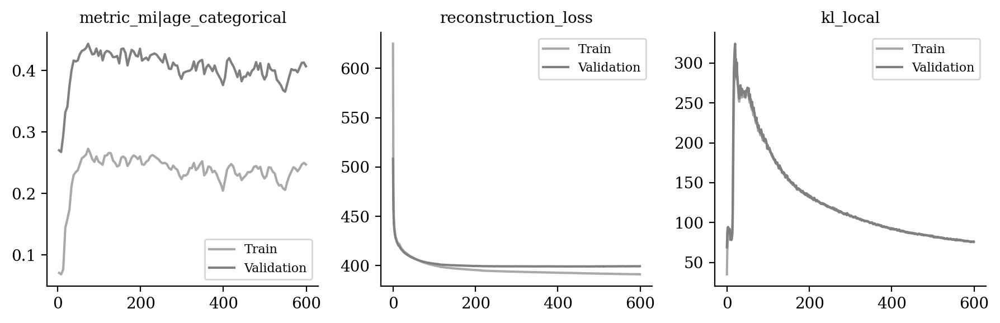

In [11]:
vae.plot_training_history(
    ignore_first=0,
    n_col=4,
    metrics_name=["metric_mi|age_categorical", "reconstruction_loss", "kl_local"]
)

In [12]:
from tardis._disentanglementmanager import DisentanglementManager as DM

In [13]:
sublatent = DM.configurations.get_by_obs_key("age_categorical").reserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

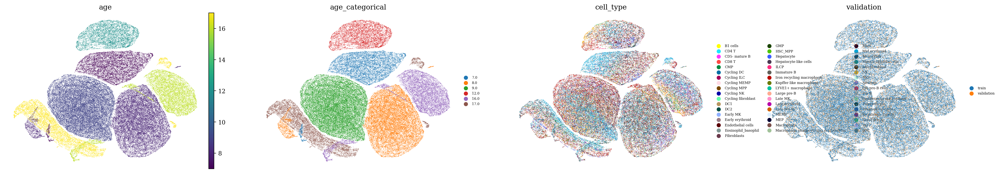

In [14]:
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

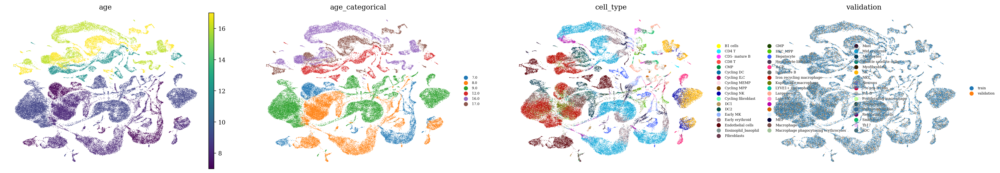

In [15]:
sublatent = DM.configurations.unreserved_latent_indices
latent = ad.AnnData(X=vae.get_latent_representation()[:, sublatent], obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )

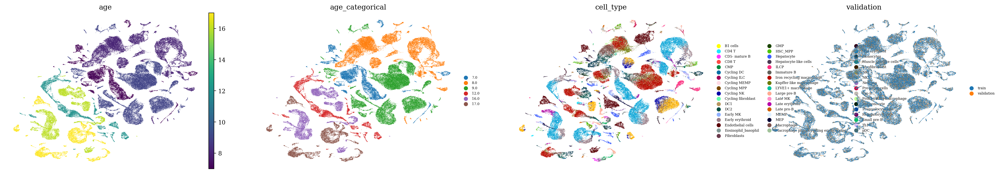

In [16]:
latent = ad.AnnData(X=vae.get_latent_representation(), obs=adata.obs.copy())
sc.pp.neighbors(latent)
sc.tl.umap(latent)

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    sc.pl.umap(
        latent, 
        color=['age', 'age_categorical', 'cell_type', 'validation'], 
        ncols=4,
        frameon=False,
        legend_fontsize="xx-small"
    )